In [2]:
%matplotlib inline
import matplotlib
matplotlib.rcParams['figure.dpi'] = 120

### All Imports

In [3]:
# =============================================================================
# STANDARD LIBRARIES
# =============================================================================
import os
import re
import gc
import time
import math
import warnings
import subprocess
from pathlib import Path

warnings.filterwarnings("ignore")

# =============================================================================
# DATA PROCESSING
# =============================================================================
import numpy as np
import pandas as pd

# =============================================================================
# VISUALIZATION
# =============================================================================
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns

# =============================================================================
# SCIENTIFIC / STATISTICS
# =============================================================================
from scipy.stats import pointbiserialr

# =============================================================================
# MACHINE LEARNING — PREPROCESSING
# =============================================================================
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif

# =============================================================================
# MACHINE LEARNING — MODEL SELECTION
# =============================================================================
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    GroupKFold,
    GroupShuffleSplit,
    cross_validate,
    GridSearchCV,
    RandomizedSearchCV
)

# =============================================================================
# MACHINE LEARNING — MODELS
# =============================================================================
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.cluster import KMeans
from xgboost import XGBClassifier

# =============================================================================
# MACHINE LEARNING — PIPELINES
# =============================================================================
from sklearn.pipeline import Pipeline

# =============================================================================
# MACHINE LEARNING — METRICS
# =============================================================================
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score,
    ConfusionMatrixDisplay,
    RocCurveDisplay
)

# =============================================================================
# DEEP LEARNING (PYTORCH)
# =============================================================================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# =============================================================================
# EXPLAINABLE AI
# =============================================================================
import lime
import lime.lime_tabular
import subprocess
subprocess.run(["pip", "install", "shap", "lime", "--break-system-packages"], check=True)

CompletedProcess(args=['pip', 'install', 'shap', 'lime', '--break-system-packages'], returncode=0)

# Data Cleaning

## Loading the datasheets

In [4]:
DATA_RAW = Path("../data/raw")
#DATA_RAW = Path("/Users/emaniftikhar/Desktop/oulad-clustered-student-engagement/data")


studentInfo = pd.read_csv(DATA_RAW / "studentInfo.csv")
studentVle = pd.read_csv(DATA_RAW / "studentVle.csv")
assessments = pd.read_csv(DATA_RAW / "assessments.csv")
studentAssessment = pd.read_csv(DATA_RAW / "studentAssessment.csv")
courses = pd.read_csv(DATA_RAW / "courses.csv")
vle = pd.read_csv(DATA_RAW / "vle.csv")
studentReg = pd.read_csv(DATA_RAW / "studentRegistration.csv")

## Tables Overview

In [5]:
datasets = {
    "studentInfo": studentInfo,
    "studentVle": studentVle,
    "assessments": assessments,
    "studentAssessment": studentAssessment,
    "courses": courses,
    "vle": vle,
    "studentRegistration": studentReg
}

for name, df in datasets.items():
    print(f"\n{'='*40}")
    print(f"{name}")
    print(f"{'='*40}")
    print("Shape:", df.shape)
    print("\nMissing values:\n", df.isnull().sum())
    print("\nDuplicate rows:", df.duplicated().sum())


studentInfo
Shape: (32593, 12)

Missing values:
 code_module             0
code_presentation       0
id_student              0
gender                  0
region                  0
highest_education       0
imd_band                0
age_band                0
num_of_prev_attempts    0
studied_credits         0
disability              0
final_result            0
dtype: int64

Duplicate rows: 0

studentVle
Shape: (10655280, 6)

Missing values:
 code_module          0
code_presentation    0
id_student           0
id_site              0
date                 0
sum_click            0
dtype: int64

Duplicate rows: 787170

assessments
Shape: (206, 6)

Missing values:
 code_module          0
code_presentation    0
id_assessment        0
assessment_type      0
date                 0
weight               0
dtype: int64

Duplicate rows: 0

studentAssessment
Shape: (173912, 5)

Missing values:
 id_assessment     0
id_student        0
date_submitted    0
is_banked         0
score             0
dtype: 

In [6]:
#Constants
KEYS        = ["id_student", "code_module", "code_presentation"]
COURSE_KEYS = ["code_module", "code_presentation"]
eps         = 1e-9

CONTENT_TYPES    = {"subpage","homepage","oucontent","resource","url","page",
                    "folder","glossary","htmlactivity","dualpane","repeatactivity"}
ASSESSMENT_TYPES = {"quiz","externalquiz","questionnaire"}
SOCIAL_TYPES     = {"forumng","ouwiki","oucollaborate","ouelluminate",
                    "dataplus","sharedsubpage"}
dim_keep         = {"content", "assessment", "social"}
TARGET = "target_at_risk"

In [7]:
# Convert registration and unregistration dates to numeric values
studentReg["date_unregistration"] = pd.to_numeric(
    studentReg["date_unregistration"], errors="coerce")

studentReg["date_registration"] = pd.to_numeric(
    studentReg["date_registration"], errors="coerce")


# Remove records where a student appears to have negative unregistration date
studentReg = studentReg[
    ~(studentReg["date_unregistration"].notna() &
      (studentReg["date_unregistration"] < 0))
].copy()


# Flag students with missing registration dates
studentReg["registration_missing_flag"] = studentReg["date_registration"].isna().astype(int)


# Flag students who withdrew from the course
studentReg["unregistered_flag"] = studentReg["date_unregistration"].notna().astype(int)


# Convert the unregistration date (in days) into the week of withdrawal
studentReg["unregistration_week"] = (
    (studentReg["date_unregistration"] // 7) + 1
).fillna(-1).astype(int)


# Replace missing registration dates with 0
studentReg["date_registration"] = studentReg["date_registration"].fillna(0)


# Flag students who registered after the course start date
studentReg["late_registration_flag"] = (studentReg["date_registration"] > 0).astype(int)


In [8]:
# Create a copy of courses
courses = courses.copy()

# Convert module presentation length (in days) to numeric
courses["module_presentation_length"] = pd.to_numeric(
    courses["module_presentation_length"], errors="coerce")

# Convert course length from days to weeks
courses["course_weeks"] = np.ceil(
    courses["module_presentation_length"] / 7).astype("Int64")


# Identify course type: STEM vs non-STEM
# Modules AAA, BBB, GGG are considered non-STEM
non_stem_modules = {"AAA", "BBB", "GGG"}
courses["course_type_stem"] = (
    ~courses["code_module"].astype(str).str.upper().str.strip().isin(non_stem_modules)
).astype(int)


# Display distribution of course lengths in weeks
print("Unique course week lengths:")
print(courses["course_weeks"].value_counts(dropna=False))


# Function to determine quarter cutoffs for each course
# For 38-week and 34-week courses, fixed cutoffs are used (based on the paper)
# Other course lengths use proportional cutoffs
def assign_quarter_cutoffs(course_weeks):
    """
    Paper's fixed cutoffs:
      38-week: Q1=10, Q2=19, Q3=29, Q4=38
      34-week: Q1=9,  Q2=17, Q3=26, Q4=34
    All other lengths: proportional fallback.
    """
    if course_weeks == 38:
        return 10, 19, 29, 38
    elif course_weeks == 34:
        return 9, 17, 26, 34
    else:
        q1 = max(1, int(np.ceil(course_weeks * 0.25)))
        q2 = min(int(np.ceil(course_weeks * 0.50)), course_weeks)
        q3 = min(int(np.ceil(course_weeks * 0.75)), course_weeks)
        q4 = course_weeks
        return q1, q2, q3, q4


# Create course-level table containing unique module–presentation pairs
course_windows = courses[COURSE_KEYS + ["course_weeks"]].drop_duplicates().copy()

# Handle missing or invalid week values
course_windows["course_weeks"] = course_windows["course_weeks"].fillna(1).clip(lower=1).astype(int)


# Apply quarter cutoff function to determine Q1–Q4 end weeks
cutoffs = course_windows["course_weeks"].apply(
    lambda cw: pd.Series(
        assign_quarter_cutoffs(cw), index=["q1_end","q2_end","q3_end","q4_end"]))

# Merge cutoff values back into the course table
course_windows = pd.concat([course_windows, cutoffs], axis=1)


# Define start weeks for each quarter window
course_windows["q1_start"] = 1
course_windows["q2_start"] = course_windows["q1_end"] + 1
course_windows["q3_start"] = course_windows["q2_end"] + 1
course_windows["q4_start"] = course_windows["q3_end"] + 1


# Display computed temporal windows for each course
print("\nCourse windows:")
print(course_windows[COURSE_KEYS + ["course_weeks","q1_end","q2_end","q3_end","q4_end"]])


Unique course week lengths:
course_weeks
39    9
35    8
38    4
34    1
Name: count, dtype: Int64

Course windows:
   code_module code_presentation  course_weeks  q1_end  q2_end  q3_end  q4_end
0          AAA             2013J            39      10      20      30      39
1          AAA             2014J            39      10      20      30      39
2          BBB             2013J            39      10      20      30      39
3          BBB             2014J            38      10      19      29      38
4          BBB             2013B            35       9      18      27      35
5          BBB             2014B            34       9      17      26      34
6          CCC             2014J            39      10      20      30      39
7          CCC             2014B            35       9      18      27      35
8          DDD             2013J            38      10      19      29      38
9          DDD             2014J            38      10      19      29      38
10         DDD 

In [9]:
# Create a copy of studentInfo
studentInfo = studentInfo.copy()


# Create binary target variable for academic risk
studentInfo["target_at_risk"] = (
    studentInfo["final_result"].isin(["Fail","Withdrawn"])).astype(int)


# Convert gender to binary variable (Male = 1, Female = 0)
studentInfo["gender_bin"] = (
    studentInfo["gender"].astype(str).str.upper() == "M").astype(int)


# Convert disability status to binary variable (Yes = 1, No = 0)
studentInfo["disability_bin"] = (
    studentInfo["disability"].astype(str).str.upper() == "Y").astype(int)


# Map age bands to ordinal numeric categories
age_map = {"0-35": 0, "35-55": 1, "55<=": 2, "55+": 2}
studentInfo["age_band_ord"] = studentInfo["age_band"].map(age_map)

# Flag missing or unknown age band values
studentInfo["age_band_missing_flag"] = (
    studentInfo["age_band"].isna() |
    ~studentInfo["age_band"].isin(age_map.keys())).astype(int)

# Impute missing age band values using the median category
studentInfo["age_band_ord"] = studentInfo["age_band_ord"].fillna(
    studentInfo["age_band_ord"].median())


# Map education levels to ordinal scale representing qualification level
edu_map = {
    "No Formal quals": 0,
    "Lower Than A Level": 1,
    "A Level or Equivalent": 2,
    "HE Qualification": 3,
    "Post Graduate Qualification": 4
}
studentInfo["highest_education_ord"] = studentInfo["highest_education"].map(edu_map)

# Flag missing or unknown education values
studentInfo["highest_education_missing_flag"] = (
    studentInfo["highest_education"].isna() |
    ~studentInfo["highest_education"].isin(edu_map.keys())).astype(int)

# Impute missing education values with the median category
studentInfo["highest_education_ord"] = studentInfo["highest_education_ord"].fillna(
    studentInfo["highest_education_ord"].median())


# Map detailed regions into broader UK nation groups
def map_region_to_nation(region):
    if pd.isna(region):
        return "Other"
    r = str(region).lower()
    if "scotland" in r:
        return "Scotland"
    if "wales" in r:
        return "Wales"
    if "ireland" in r:
        return "Northern_Ireland"
    if "england" in r or "region" in r:
        return "England"
    return "Other"

studentInfo["nation"] = studentInfo["region"].apply(map_region_to_nation)


# One-hot encode the nation categories
nation_ohe = pd.get_dummies(studentInfo["nation"], prefix="nation", dummy_na=False)
studentInfo = pd.concat([studentInfo, nation_ohe], axis=1)


# Convert IMD (deprivation index) bands into 5 broader categories
def bin_imd_5(x):
    x = str(x).strip()
    if x in {"0-10%","10-20%"}:   return "VeryLow"
    if x in {"20-30%","30-40%"}:  return "Low"
    if x in {"40-50%","50-60%"}:  return "Medium"
    if x in {"60-70%","70-80%"}:  return "High"
    if x in {"80-90%","90-100%"}: return "VeryHigh"
    return "Unknown"


# Clean IMD values and apply binning
studentInfo["imd_band"] = studentInfo["imd_band"].fillna("Unknown").astype(str)
studentInfo["imd_5cat"] = studentInfo["imd_band"].apply(bin_imd_5)


# Convert IMD categories to ordinal numeric values
imd_ord_map = {
    "VeryLow":0,
    "Low":1,
    "Medium":2,
    "High":3,
    "VeryHigh":4,
    "Unknown":np.nan
}

studentInfo["imd_ordinal"] = studentInfo["imd_5cat"].map(imd_ord_map)

# Flag unknown IMD values
studentInfo["imd_unknown_flag"] = studentInfo["imd_ordinal"].isna().astype(int)

# Impute missing IMD values with the median
studentInfo["imd_ordinal"] = studentInfo["imd_ordinal"].fillna(
    studentInfo["imd_ordinal"].median()).astype(float)


# Drop original categorical columns after encoding and transformation
studentInfo.drop(
    columns=[
        "gender",
        "disability",
        "age_band",
        "highest_education",
        "region",
        "nation",
        "imd_band",
        "imd_5cat"
    ],
    inplace=True
)

In [10]:
# Remove the course_weeks column from the courses table
courses_no_weeks = courses.drop(columns=["course_weeks"], errors="ignore")


# Create the base dataset by merging all static information sources
base_static = (
    studentInfo
    .merge(studentReg, on=KEYS, how="inner")                     # add registration and withdrawal information
    .merge(courses_no_weeks, on=COURSE_KEYS, how="inner")        # add course-level attributes
    .merge(
        course_windows[COURSE_KEYS + ["course_weeks","q1_end","q2_end","q3_end","q4_end"]],
        on=COURSE_KEYS, how="inner"                              # add temporal quarter boundaries
    )
)
print(
    f"\nbase_static: {base_static.shape}  |  at-risk: {base_static['target_at_risk'].mean()*100:.1f}%"
)


base_static: (29915, 32)  |  at-risk: 48.6%


In [11]:
# Function to convert presentation codes into a sortable chronological format
def parse_presentation_order(pres):
    """Parse '2013B', '2013J', '2014B' → (year, season) for chronological ordering."""
    pres = str(pres).strip()
    try:
        year = int(pres[:4])
        season_order = {"B": 0, "J": 1}.get(pres[4:].upper(), 0)
        return (year, season_order)
    except:
        return (0, 0)


# Count number of students in each module–presentation combination
pres_per_module = (
    base_static.groupby(COURSE_KEYS).size().reset_index(name="n_students")
)

# Add chronological order for each presentation
pres_per_module["pres_order"] = pres_per_module["code_presentation"].apply(
    parse_presentation_order
)

# Sort presentations within each module by time
pres_per_module = pres_per_module.sort_values(
    ["code_module", "pres_order"]
).reset_index(drop=True)


# Display all module presentations in chronological order
print("\nAll presentations (chronological):")
print(pres_per_module[["code_module", "code_presentation", "n_students"]].to_string(index=False))


# Identify modules that appear in only one presentation
# These cannot contribute to the held-out test split across time
single_pres = (
    pres_per_module.groupby("code_module")["code_presentation"]
    .nunique()
    .pipe(lambda s: s[s == 1])
    .index.tolist()
)

if single_pres:
    print(f"\n⚠️  Modules with 1 presentation (train only): {single_pres}")


# Select the latest presentation of each module as the test set
# This simulates deployment on future presentations
test_presentations = (
    pres_per_module.sort_values(["code_module", "pres_order"])
    .groupby("code_module")
    .last()
    .reset_index()[["code_module", "code_presentation"]]
)

print("\nHeld-out test presentations:")
print(test_presentations.to_string(index=False))


# Create a set of test module–presentation pairs
test_set = set(zip(
    test_presentations["code_module"],
    test_presentations["code_presentation"]
))

# Mark rows belonging to the held-out test presentations
test_mask = base_static.apply(
    lambda r: (r["code_module"], r["code_presentation"]) in test_set,
    axis=1
)


# Extract train and test student keys based on the presentation split
train_keys = base_static.loc[~test_mask, KEYS].copy()
test_keys  = base_static.loc[test_mask, KEYS].copy()


# Print summary of train and test split sizes
print(f"\nTrain: {len(train_keys):,} students | "
      f"{base_static.loc[~test_mask,'code_presentation'].nunique()} presentations")
print(f"Test:  {len(test_keys):,} students | "
      f"{base_static.loc[test_mask,'code_presentation'].nunique()} presentations")


# Ensure no module–presentation pair appears in both train and test sets
# This prevents temporal leakage across presentations
assert len(
    set(zip(train_keys["code_module"], train_keys["code_presentation"])) &
    set(zip(test_keys["code_module"],  test_keys["code_presentation"]))
) == 0, "Presentation leakage detected!"

print("✓ No presentation overlap")


All presentations (chronological):
code_module code_presentation  n_students
        AAA             2013J         376
        AAA             2014J         352
        BBB             2013B        1645
        BBB             2013J        2003
        BBB             2014B        1351
        BBB             2014J        2053
        CCC             2014B        1686
        CCC             2014J        2285
        DDD             2013B        1226
        DDD             2013J        1748
        DDD             2014B        1127
        DDD             2014J        1655
        EEE             2013J         986
        EEE             2014B         644
        EEE             2014J        1121
        FFF             2013B        1529
        FFF             2013J        2112
        FFF             2014B        1377
        FFF             2014J        2170
        GGG             2013J         930
        GGG             2014B         810
        GGG             2014J         72

In [12]:
# Convert activity date to numeric format
studentVle["date"] = pd.to_numeric(studentVle["date"], errors="coerce")

# Convert click counts to numeric, replace missing values with 0 and ensure no negative click values remain
studentVle["sum_click"] = pd.to_numeric(
    studentVle["sum_click"], errors="coerce"
).fillna(0).clip(lower=0)


# Aggregate raw VLE interactions at the student–site–day level
studentVle_daily = (
    studentVle
    .groupby(
        ["id_student", "code_module", "code_presentation", "id_site", "date"],
        as_index=False
    )
    .agg(sum_click=("sum_click", "sum"))
)

# Create lookup table linking site IDs to activity types
vle_lookup = vle[["id_site", "activity_type"]].drop_duplicates()

# Enrich daily interactions with activity type information
studentVle_daily_enr = studentVle_daily.merge(vle_lookup, on="id_site", how="left")

# Free memory after intermediate merge
del studentVle_daily, vle_lookup, studentVle
gc.collect()


# Remove interactions recorded before course start
studentVle_daily_enr = studentVle_daily_enr[studentVle_daily_enr["date"] >= 0].copy()

# Convert activity day into course week number
studentVle_daily_enr["week"] = (studentVle_daily_enr["date"] // 7) + 1


# Map detailed VLE activity types into broader engagement dimensions
def map_engagement_dim(activity_type):
    if pd.isna(activity_type):
        return "unknown"
    a = str(activity_type).strip().lower()
    if a in CONTENT_TYPES:
        return "content"
    if a in ASSESSMENT_TYPES:
        return "assessment"
    if a in SOCIAL_TYPES:
        return "social"
    return "other"


# Assign engagement dimension to each interaction
studentVle_daily_enr["engagement_dim"] = studentVle_daily_enr["activity_type"].apply(
    map_engagement_dim
)

# Keep only relevant columns for weekly aggregation
studentVle_daily_enr = studentVle_daily_enr[
    ["id_student", "code_module", "code_presentation", "week", "sum_click", "engagement_dim"]
].copy()


# Aggregate interactions to student–week–engagement dimension level
studentVle_weekly = (
    studentVle_daily_enr
    .groupby(
        ["id_student", "code_module", "code_presentation", "week", "engagement_dim"],
        as_index=False
    )
    .agg(sum_click=("sum_click", "sum"))
)

print(f"studentVle_weekly shape: {studentVle_weekly.shape}")

# Free memory after weekly aggregation
del studentVle_daily_enr
gc.collect()

studentVle_weekly shape: (1085419, 6)


0

In [13]:
# Copy assessment table and standardize assessment type values
assess_clean = assessments.copy()
assess_clean["assessment_type"] = assess_clean["assessment_type"].astype(str).str.lower()

# Exclude exams since they are not used in the behavioural metrics
assess_clean = assess_clean[assess_clean["assessment_type"] != "exam"].copy()

# Convert assessment due date to numeric and remove missing values
assess_clean["date"] = pd.to_numeric(assess_clean["date"], errors="coerce")
assess_clean = assess_clean.dropna(subset=["date"])

# Keep only required assessment fields and rename date as due_date
assess_clean = assess_clean[
    ["id_assessment", "code_module", "code_presentation", "date"]
].rename(columns={"date": "due_date"})

# Keep only records with a valid submission date
sa = studentAssessment.copy()
sa = sa[sa["date_submitted"].notna()].copy()

# Convert submission date to numeric and prevent negative values
sa["date_submitted"] = pd.to_numeric(sa["date_submitted"], errors="coerce").clip(lower=0)

# Keep only relevant submission fields
sa = sa[["id_assessment", "id_student", "date_submitted"]]


# Merge submissions with assessment due dates
sub_all = sa.merge(assess_clean, on="id_assessment", how="inner", validate="m:1")

# Add quarter boundaries for later temporal feature calculations
sub_all = sub_all.merge(
    course_windows[COURSE_KEYS + ["q1_end", "q2_end", "q3_end", "q4_end"]],
    on=COURSE_KEYS, how="inner", validate="m:1"
)

In [14]:
# Cap extreme weekly click values within each cohort
# This reduces the influence of unusually high activity values
def cap_outliers_within_cohort(vle_weekly, cohort_keys, cap_q=0.99):
    # Keep only students belonging to the selected cohort
    vle_c = vle_weekly.merge(cohort_keys, on=KEYS, how="inner")

    # Define grouping level for cohort-specific caps
    group_cols = ["code_module", "code_presentation", "week", "engagement_dim"]

    # Compute upper cap value for each module–presentation–week–dimension group
    cap_tbl = (
        vle_c.groupby(group_cols, as_index=False)["sum_click"]
        .quantile(cap_q)
        .rename(columns={"sum_click": "cap_hi"})
    )

    # Merge cap values back and clip clicks at the upper threshold
    vle_c = vle_c.merge(cap_tbl, on=group_cols, how="left")
    vle_c["sum_click"] = np.minimum(
        vle_c["sum_click"],
        vle_c["cap_hi"].fillna(vle_c["sum_click"])
    )

    # Drop temporary cap column
    vle_c = vle_c.drop(columns=["cap_hi"])

    return vle_c

In [15]:
# Build weekly normalized engagement features using cohort-based denominators
# Each feature represents a student's share of total cohort clicks for a given week and engagement dimension
def build_weekly_norm_features(studentVle_weekly, cohort_keys, course_windows):
    """Weekly norm columns. Denominators from cohort only."""

    # Keep only the engagement dimensions used in modelling
    vle_w = studentVle_weekly[
        studentVle_weekly["engagement_dim"].isin(dim_keep)
    ].copy()

    # Add course length information
    vle_w = vle_w.merge(
        course_windows[COURSE_KEYS + ["course_weeks"]],
        on=COURSE_KEYS, how="inner", validate="m:1"
    )

    # Keep only valid course weeks
    vle_w = vle_w[
        (vle_w["week"] >= 1) & (vle_w["week"] <= vle_w["course_weeks"])
    ].copy()

    # Ensure week is numeric and remove invalid values
    vle_w["week"] = pd.to_numeric(vle_w["week"], errors="coerce")
    vle_w = vle_w.dropna(subset=["week"]).copy()
    vle_w["week"] = vle_w["week"].astype(int)

    # Keep only records belonging to the selected cohort
    vle_cohort = vle_w.merge(cohort_keys, on=KEYS, how="inner")

    # Compute total cohort clicks for each module–presentation–week–dimension
    course_week_dim = (
        vle_cohort
        .groupby(COURSE_KEYS + ["week", "engagement_dim"], as_index=False)
        .agg(course_clicks=("sum_click", "sum"))
    )

    # Merge cohort totals back to student-level weekly data
    vle_cohort = vle_cohort.merge(
        course_week_dim,
        on=COURSE_KEYS + ["week", "engagement_dim"],
        how="left",
        validate="m:1"
    )

    # Calculate each student's normalized share of weekly clicks
    vle_cohort["share_clicks"] = np.where(
        vle_cohort["course_clicks"] > 0,
        vle_cohort["sum_click"] / (vle_cohort["course_clicks"] + eps),
        0.0
    )

    # Pivot to wide format: one column per week–dimension combination
    weekly_wide = (
        vle_cohort.pivot_table(
            index=KEYS,
            columns=["week", "engagement_dim"],
            values="share_clicks",
            fill_value=0.0
        )
        .reset_index()
    )

    # Flatten multi-index columns after pivot
    weekly_wide.columns = [
        c[0] if (isinstance(c, tuple) and (c[1] == "" or c[1] is None)) else c
        for c in weekly_wide.columns
    ]

    # Rename columns into readable feature names
    def _col_name(col):
        if isinstance(col, tuple):
            wk, dim = col
            return f"wk{int(wk):02d}_{dim}_norm"
        return col

    return weekly_wide.rename(columns=_col_name)

In [16]:
# Create course-length-aware aggregate features from weekly normalized engagement columns
# These features summarise overall engagement patterns across the full observed course period
def add_weekly_aggregates(df, course_weeks_col="course_weeks", suffix="_norm", eps=1e-9):
    """Course-length-aware aggregated features from weekly norm columns."""

    # Match weekly normalized columns 
    pat = re.compile(rf"^wk(\d{{2}})_(content|assessment|social){re.escape(suffix)}$")

    # Extract all available week numbers from the dataframe columns
    weeks = sorted({int(pat.match(c).group(1)) for c in df.columns if pat.match(c)})

    # If no matching weekly columns exist, return the dataframe unchanged
    if not weeks:
        return df.copy()

    max_w = max(weeks)

    # Build matrices for content, assessment, and social engagement across weeks
    Xc = df.reindex(
        columns=[f"wk{w:02d}_content{suffix}" for w in weeks],
        fill_value=0.0
    ).to_numpy(float)

    Xa = df.reindex(
        columns=[f"wk{w:02d}_assessment{suffix}" for w in weeks],
        fill_value=0.0
    ).to_numpy(float)

    Xs = df.reindex(
        columns=[f"wk{w:02d}_social{suffix}" for w in weeks],
        fill_value=0.0
    ).to_numpy(float)

    # Total engagement per week across all dimensions
    Xt = Xc + Xa + Xs

    # Read course length and ensure it stays within valid week range
    cw = pd.to_numeric(df[course_weeks_col], errors="coerce").fillna(max_w).clip(1, max_w).to_numpy(int)

    # Create mask so only valid course weeks are included for each student
    week_index = np.array(weeks, dtype=int)[None, :]
    valid_mask = (week_index <= cw[:, None]).astype(float)

    # Apply course-length mask to ignore weeks beyond the student's course duration
    Xc_v, Xa_v, Xs_v, Xt_v = Xc * valid_mask, Xa * valid_mask, Xs * valid_mask, Xt * valid_mask

    # Aggregate total engagement by dimension
    content_eng = Xc_v.sum(axis=1)
    assess_eng = Xa_v.sum(axis=1)
    social_eng = Xs_v.sum(axis=1)
    total_eng = Xt_v.sum(axis=1)

    # Compute dimension ratios relative to total engagement
    content_ratio = content_eng / (total_eng + eps)
    assessment_ratio = assess_eng / (total_eng + eps)
    social_ratio = social_eng / (total_eng + eps)

    # Count number of active weeks (weeks with any engagement)
    active_weeks = (Xt_v > 0).sum(axis=1).astype(int)

    # Store total observed weeks for each student
    weeks_observed = cw

    # Measure consistency of engagement across the course
    active_weeks_ratio = active_weeks / (weeks_observed + eps)

    # Compute entropy of weekly engagement distribution
    # Higher entropy indicates engagement spread more evenly over time
    row_sum = Xt_v.sum(axis=1, keepdims=True)
    P = np.divide(Xt_v, row_sum + eps)

    logP = np.zeros_like(P)
    m = P > 0
    logP[m] = np.log(P[m])

    ent = -(P * logP).sum(axis=1)

    # Normalize entropy by course length
    ent_norm = ent / (np.log(weeks_observed) + eps)

    # Create dataframe of aggregated behavioural features
    new_feat = pd.DataFrame({
        f"content_engagement{suffix}":           content_eng,
        f"assessment_engagement{suffix}":        assess_eng,
        f"social_engagement{suffix}":            social_eng,
        f"total_engagement{suffix}":             total_eng,
        f"content_ratio{suffix}":                content_ratio,
        f"assessment_ratio{suffix}":             assessment_ratio,
        f"social_ratio{suffix}":                 social_ratio,
        f"active_weeks{suffix}":                 active_weeks,
        f"weeks_observed{suffix}":               weeks_observed,
        f"active_weeks_ratio{suffix}":           active_weeks_ratio,
        f"engagement_entropy{suffix}":           ent,
        f"engagement_week_entropy_norm{suffix}": ent_norm,
    }, index=df.index)

    # Append aggregated features to the original dataframe
    return pd.concat([df.copy(), new_feat], axis=1).copy()

In [17]:
# Build quarter-level normalized engagement features
# Each feature represents a student's share of cohort engagement up to a given quarter endpoint (e.g., Q1, Q2, Q3, Q4)
def build_quarter_norm_features(studentVle_weekly, cohort_keys,
                                 course_windows, q_end_col, q_label):
    """Quarter engagement norm features. Denominators from cohort only."""

    # Add course length and quarter boundary information
    vle_q = studentVle_weekly.merge(
        course_windows[COURSE_KEYS + ["course_weeks", "q1_end", "q2_end", "q3_end", "q4_end"]],
        on=COURSE_KEYS, how="inner", validate="m:1"
    ).copy()

    # Keep only valid course weeks
    vle_q = vle_q[
        (vle_q["week"] >= 1) & (vle_q["week"] <= vle_q["course_weeks"])
    ].copy()

    # Keep interactions only up to the selected quarter endpoint
    df = vle_q[vle_q["week"] <= vle_q[q_end_col]].copy()

    # Restrict cohort-based denominators to the selected training cohort
    df_cohort = df.merge(cohort_keys, on=KEYS, how="inner")

    # Compute total cohort clicks by course and engagement dimension
    course_dim = (
        df_cohort[df_cohort["engagement_dim"].isin(dim_keep)]
        .groupby(COURSE_KEYS + ["engagement_dim"], as_index=False)
        .agg(course_clicks=("sum_click", "sum"))
    )

    # Compute total cohort clicks across all engagement types
    course_total = (
        df_cohort.groupby(COURSE_KEYS, as_index=False)
        .agg(course_total_clicks=("sum_click", "sum"))
    )

    # Compute each student's clicks by engagement dimension
    student_dim = (
        df[df["engagement_dim"].isin(dim_keep)]
        .merge(cohort_keys, on=KEYS, how="inner")
        .groupby(KEYS + ["engagement_dim"], as_index=False)
        .agg(clicks=("sum_click", "sum"))
    )

    # Compute each student's total clicks across all engagement types
    student_total = (
        df.merge(cohort_keys, on=KEYS, how="inner")
        .groupby(KEYS, as_index=False)
        .agg(total_clicks=("sum_click", "sum"))
    )

    # Normalize student dimension-level clicks by cohort totals
    student_dim = student_dim.merge(
        course_dim, on=COURSE_KEYS + ["engagement_dim"], how="left", validate="m:1"
    )
    student_dim["norm"] = np.where(
        student_dim["course_clicks"] > 0,
        student_dim["clicks"] / student_dim["course_clicks"],
        0.0
    )

    # Pivot normalized dimension-level features to wide format
    dim_wide = (
        student_dim
        .pivot_table(index=KEYS, columns="engagement_dim", values="norm", fill_value=0.0)
        .reset_index()
        .rename(columns={
            "content":    f"norm_content_{q_label}",
            "assessment": f"norm_assessment_{q_label}",
            "social":     f"norm_social_{q_label}",
        })
    )

    # Normalize total student clicks by total cohort clicks
    total_norm = student_total.merge(
        course_total, on=COURSE_KEYS, how="left", validate="m:1"
    )
    total_norm[f"norm_total_{q_label}"] = np.where(
        total_norm["course_total_clicks"] > 0,
        total_norm["total_clicks"] / total_norm["course_total_clicks"],
        0.0
    )
    total_norm = total_norm[KEYS + [f"norm_total_{q_label}"]]

    # Combine total and dimension-level normalized features
    out = total_norm.merge(dim_wide, on=KEYS, how="left")

    # Fill any missing dimension features with 0
    for c in [f"norm_content_{q_label}", f"norm_assessment_{q_label}", f"norm_social_{q_label}"]:
        out[c] = out.get(c, pd.Series(0.0, index=out.index)).fillna(0.0)

    return out

In [18]:
# Build full-course AP (anti-procrastination) features
# AP is based on how early a student submits relative to the earliest submission for the same assessment within the cohort
def build_ap_full(sub_all, cohort_keys, eps=1e-9):
    """Full-course AP score. Smin from cohort only."""

    # Keep only submissions from the selected cohort
    sub_c = sub_all.merge(cohort_keys, on=KEYS, how="inner")

    # Find the earliest submission date for each assessment within the cohort
    smin = (
        sub_c.groupby(COURSE_KEYS + ["id_assessment"], as_index=False)
        .agg(Smin=("date_submitted", "min"))
    )

    # Merge earliest submission date back to each submission
    sub_c = sub_c.merge(
        smin, on=COURSE_KEYS + ["id_assessment"], how="left", validate="m:1"
    )

    # Compute available submission window and student submission gap
    sub_c["Wa"] = sub_c["due_date"] - sub_c["Smin"]
    sub_c["delta"] = sub_c["due_date"] - sub_c["date_submitted"]

    # Compute AP score: higher values indicate earlier submission behaviour
    sub_c["Ts"] = np.where(
        sub_c["Wa"] > 0,
        sub_c["delta"] / (sub_c["Wa"] + eps),
        0.0
    )

    # Flag late submissions
    sub_c["late_flag"] = (sub_c["date_submitted"] > sub_c["due_date"]).astype(int)

    # Aggregate full-course AP features at student level
    return (
        sub_c.groupby(KEYS, as_index=False)
        .agg(
            AP_full=("Ts", "mean"),
            n_submissions=("Ts", "count"),
            num_late_submissions=("late_flag", "sum")
        )
    )

# Build quarter-specific AP features using only assessments due within that quarter
# AP is calculated relative to the earliest cohort submission for each assessment in that period
def build_ap_quarter(sub_all, cohort_keys, q_end_col, q_label,
                     prev_q_end_col=None, eps=1e-9):
    """Quarter AP score. Smin_q from cohort only."""

    # Keep only submissions from the selected cohort
    sub_c = sub_all.merge(cohort_keys, on=KEYS, how="inner")

    # Convert quarter endpoints from week number to day number
    q_end_day = sub_c[q_end_col] * 7 - 1
    prev_end_day = -1 if prev_q_end_col is None else sub_c[prev_q_end_col] * 7 - 1

    # Keep only assessments whose due dates fall within the selected quarter
    dfq = sub_c[
        (sub_c["due_date"] > prev_end_day) & (sub_c["due_date"] <= q_end_day)
    ].copy()

    # Flag late submissions within the quarter
    dfq["late_q"] = (dfq["date_submitted"] > dfq["due_date"]).astype(int)

    # Find earliest submission date per assessment within the quarter
    smin_q = (
        dfq[dfq["date_submitted"].notna()]
        .groupby(COURSE_KEYS + ["id_assessment"], as_index=False)
        .agg(Smin_q=("date_submitted", "min"))
    )

    # Merge earliest quarter submission date back to each record
    dfq = dfq.merge(
        smin_q, on=COURSE_KEYS + ["id_assessment"], how="left", validate="m:1"
    )

    # Compute AP components within the quarter
    dfq["Wa_q"] = dfq["due_date"] - dfq["Smin_q"]
    dfq["delta_q"] = dfq["due_date"] - dfq["date_submitted"]

    # Compute quarter AP score
    dfq["Ts_q"] = np.where(
        (dfq["Wa_q"] > 0) & (dfq["date_submitted"].notna()),
        dfq["delta_q"] / (dfq["Wa_q"] + eps),
        0.0
    )

    # Aggregate quarter AP features at student level
    return (
        dfq.groupby(KEYS, as_index=False).agg(**{
            f"AP_{q_label}":                   ("Ts_q", "mean"),
            f"n_submissions_{q_label}":        ("Ts_q", "count"),
            f"num_late_submissions_{q_label}": ("late_q", "sum"),
        })
    )

# Derive additional quarter-level behavioural features
# These include engagement ratios and entropy across content, assessment, and social activity
def add_quarter_derived_features(df, q_label, eps=1e-9):
    t, c = f"norm_total_{q_label}", f"norm_content_{q_label}"
    a, s = f"norm_assessment_{q_label}", f"norm_social_{q_label}"

    # Ensure required normalized engagement columns exist
    for col in [t, c, a, s]:
        if col not in df.columns:
            df[col] = 0.0
        df[col] = df[col].fillna(0.0)

    # Total engagement across the three dimensions
    dim_sum = df[c] + df[a] + df[s]

    # Compute proportion of engagement in each dimension
    df[f"content_ratio_{q_label}"] = df[c] / (dim_sum + eps)
    df[f"assessment_ratio_{q_label}"] = df[a] / (dim_sum + eps)
    df[f"social_ratio_{q_label}"] = df[s] / (dim_sum + eps)

    # Compute entropy across engagement dimensions
    # Higher entropy indicates more balanced engagement across dimensions
    vals = df[[c, a, s]].to_numpy(float)
    row_sum = vals.sum(axis=1, keepdims=True)
    P = vals / (row_sum + eps)

    logP = np.zeros_like(P)
    mask = P > 0
    logP[mask] = np.log(P[mask])

    dim_ent = -(P * logP).sum(axis=1)
    df[f"dim_entropy_{q_label}"] = dim_ent
    df[f"dim_entropy_norm_{q_label}"] = dim_ent / (np.log(3) + eps)

    # Handle missing AP values and add a missingness flag
    ap = f"AP_{q_label}"
    if ap in df.columns:
        df[f"{ap}_missing"] = df[ap].isna().astype(int)
        df[ap] = df[ap].fillna(0.0)

    return df

In [19]:
# Compute spacing scores for each quarter and for the full course
# The score measures how evenly a student's engagement is distributed over time using only the timing of activity, without cross-student normalization
def build_spacing_scores(studentVle_weekly_cohort, course_windows, eps=1e-9):
    """
    Spacing scores per quarter + full course.
    Uses only WHEN a student engages — no cross-student normalisation needed.
    Pass VLE data pre-filtered to the cohort.
    """

    # Create a copy of course windows and define full-course boundaries
    cw = course_windows.copy()
    cw["full_start"] = 1
    cw["full_end"] = cw["q4_end"]

    # Define temporal windows to evaluate
    q_windows = [
        ("q1_start", "q1_end", "Q1"),
        ("q2_start", "q2_end", "Q2"),
        ("q3_start", "q3_end", "Q3"),
        ("q4_start", "q4_end", "Q4"),
        ("full_start", "full_end", "full"),
    ]

    results = {}

    # Process each quarter/full-course window separately
    for q_start_col, q_end_col, q_label in q_windows:

        # Add course window boundaries to weekly VLE data
        vle_q = studentVle_weekly_cohort.merge(
            cw[COURSE_KEYS + ["course_weeks", q_start_col, q_end_col]],
            on=COURSE_KEYS, how="inner", validate="m:1"
        ).copy()

        # Keep only weeks within the selected window and relevant engagement dimensions
        vle_q = vle_q[
            (vle_q["week"] >= vle_q[q_start_col]) &
            (vle_q["week"] <= vle_q[q_end_col]) &
            (vle_q["engagement_dim"].isin(dim_keep))
        ].copy()

        # Aggregate total clicks at student–week level
        student_week = (
            vle_q.groupby(KEYS + ["week"], as_index=False)
            .agg(total_click=("sum_click", "sum"))
        )

        # Store unique start/end boundaries for each course presentation
        bounds = cw[COURSE_KEYS + [q_start_col, q_end_col]].drop_duplicates()

        records = []

        # Compute spacing score for each student separately
        for key, grp in student_week.groupby(KEYS):
            id_student, code_module, code_presentation = key

            # Retrieve quarter boundaries for the student's course presentation
            b = bounds[
                (bounds["code_module"] == code_module) &
                (bounds["code_presentation"] == code_presentation)
            ]

            # If no matching bounds exist, assign default score
            if b.empty:
                records.append({
                    "id_student": id_student,
                    "code_module": code_module,
                    "code_presentation": code_presentation,
                    f"spacing_score_{q_label}": 0.0,
                    f"spacing_defined_{q_label}": 0
                })
                continue

            # Determine window length and active weeks
            s, e = int(b[q_start_col].iloc[0]), int(b[q_end_col].iloc[0])
            qlen = e - s + 1
            weeks_active = grp.loc[grp["total_click"] > 0, "week"].sort_values().to_numpy()
            m = len(weeks_active)

            # Spacing score requires at least two active weeks
            if m < 2 or qlen < 2:
                score, defined = 0.0, 0
            else:
                # Compute gaps between active weeks
                gaps = np.diff(weeks_active)

                # Ideal gap assumes engagement is evenly spread across the window
                ideal_gap = (qlen - 1) / (m - 1)

                # Measure deviation from ideal spacing
                dev = np.mean(np.abs(gaps - ideal_gap)) / (ideal_gap + eps)

                # Higher consistency means activity is more evenly distributed
                consistency = 1.0 / (1.0 + dev)

                # Penalize long breaks between active weeks
                break_severity = (gaps.max() - 1) / max(qlen - 1, 1)

                # Final score combines consistency and break severity
                score = 0.7 * consistency + 0.3 * (
                    1.0 - np.clip(break_severity, 0.0, 1.0)
                )
                defined = 1

            # Store spacing score and whether it was meaningfully defined
            records.append({
                "id_student": id_student,
                "code_module": code_module,
                "code_presentation": code_presentation,
                f"spacing_score_{q_label}": score,
                f"spacing_defined_{q_label}": defined
            })

        # Save results for the current quarter/window
        results[q_label] = pd.DataFrame(records)

    return results

In [20]:
# Build quarter-level temporal engagement features from weekly norm columns
# These features capture:
# 1) how consistently a student was active across the quarter
# 2) how evenly engagement was distributed across the quarter weeks
def build_quarter_temporal_features(master_df, course_windows, eps=1e-9):
    """
    Build:
      - active_weeks_ratio_Qx
      - week_entropy_norm_Qx

    Uses weekly norm columns safely via reindex(fill_value=0.0),
    so missing week-dimension columns do not break the pipeline.
    """

    # Match weekly normalized columns
    pat = re.compile(r"^wk(\d{2})_(content|assessment|social)_norm$")

    # Extract all available week numbers from the dataframe
    weeks = sorted({
        int(pat.match(c).group(1))
        for c in master_df.columns
        if pat.match(c)
    })

    # If no weekly columns exist, return zero-filled quarter temporal features
    if not weeks:
        extra = master_df[KEYS].copy()
        for q_label in ["Q1", "Q2", "Q3", "Q4"]:
            extra[f"active_weeks_ratio_{q_label}"] = 0.0
            extra[f"week_entropy_norm_{q_label}"] = 0.0
        return extra, master_df

    # Ensure quarter cutoff columns are present
    q_end_cols = ["q1_end", "q2_end", "q3_end", "q4_end"]
    missing_q = [c for c in q_end_cols if c not in master_df.columns]

    if missing_q:
        master_df = master_df.merge(
            course_windows[COURSE_KEYS + q_end_cols].drop_duplicates(),
            on=COURSE_KEYS,
            how="left"
        )

    # Safely collect weekly normalized content, assessment, and social matrices
    Xc = master_df.reindex(
        columns=[f"wk{w:02d}_content_norm" for w in weeks],
        fill_value=0.0
    ).to_numpy(float)

    Xa = master_df.reindex(
        columns=[f"wk{w:02d}_assessment_norm" for w in weeks],
        fill_value=0.0
    ).to_numpy(float)

    Xs = master_df.reindex(
        columns=[f"wk{w:02d}_social_norm" for w in weeks],
        fill_value=0.0
    ).to_numpy(float)

    # Total weekly engagement across all three dimensions
    Xt = Xc + Xa + Xs
    week_index = np.array(weeks)

    # Start output dataframe with student/course keys
    extra = master_df[KEYS].copy()

    # Compute temporal features separately for each quarter
    for q_label, q_end_col in [
        ("Q1", "q1_end"),
        ("Q2", "q2_end"),
        ("Q3", "q3_end"),
        ("Q4", "q4_end"),
    ]:
        # Read quarter endpoint in weeks
        q_end = pd.to_numeric(master_df[q_end_col], errors="coerce").fillna(0).astype(int).to_numpy()

        # Keep only weeks that fall within the current quarter
        valid = (week_index[None, :] <= q_end[:, None])

        # Zero out weeks beyond the current quarter
        Xt_q = np.where(valid, Xt, 0.0)

        # Count number of active weeks with any engagement
        active_weeks = (Xt_q > 0).sum(axis=1)

        # Count total valid weeks in the quarter
        n_valid = valid.sum(axis=1).clip(min=1)

        # Ratio of active weeks to total available weeks
        extra[f"active_weeks_ratio_{q_label}"] = active_weeks / (n_valid + eps)

        # Compute entropy of weekly engagement distribution
        # Higher entropy means engagement is spread more evenly across weeks
        row_sum = Xt_q.sum(axis=1, keepdims=True)
        P = Xt_q / (row_sum + eps)

        logP = np.zeros_like(P)
        m = P > 0
        logP[m] = np.log(P[m])

        ent = -(P * logP).sum(axis=1)

        # Normalize entropy by number of valid weeks
        extra[f"week_entropy_norm_{q_label}"] = ent / (np.log(n_valid) + eps)

    return extra, master_df

In [21]:
def safe_cols(df, cols):
    return [c for c in cols if c in df.columns]


In [22]:
# Demographic features describing student background characteristics
DEMOGRAPHIC_FEATURES = [
    "gender_bin", "disability_bin",
    "age_band_ord", "age_band_missing_flag",
    "highest_education_ord", "highest_education_missing_flag",
    "imd_ordinal", "imd_unknown_flag",
    "nation_England", "nation_Scotland", "nation_Wales", "nation_Northern_Ireland",
    "late_registration_flag",
]

# Academic features describing course context and prior student history
ACADEMIC_FEATURES = [
    "studied_credits", "course_type_stem", "num_of_prev_attempts",
]

# Full-course behavioural features derived from VLE activity and submissions
MASTER_BEHAVIOURAL = [
    "total_engagement_norm", "content_engagement_norm",
    "assessment_engagement_norm", "social_engagement_norm",
    "content_ratio_norm", "assessment_ratio_norm", "social_ratio_norm",
    "active_weeks_ratio_norm", "engagement_week_entropy_norm_norm",
    "engagement_entropy_norm",
    "AP_full", "AP_full_missing", "n_submissions", "num_late_submissions",
    "spacing_score_full", "spacing_defined_full"
]

# Function that returns the behavioural feature set for a specific quarter
def quarter_behavioural(q):
    return [
        f"norm_total_{q}", f"norm_content_{q}",
        f"norm_assessment_{q}", f"norm_social_{q}",
        f"content_ratio_{q}", f"assessment_ratio_{q}", f"social_ratio_{q}",
        f"dim_entropy_norm_{q}",
        f"active_weeks_ratio_{q}", f"week_entropy_norm_{q}",
        f"AP_{q}", f"AP_{q}_missing",
        f"n_submissions_{q}", f"num_late_submissions_{q}",
        f"spacing_score_{q}", f"spacing_defined_{q}",
    ]

In [23]:
# Build complete ML-ready feature tables for a single cohort
def build_cohort_features(cohort_keys, studentVle_weekly, sub_all,
                           base_static, course_windows, label="cohort"):
    """
    Build complete ML-ready feature tables for one cohort.
    All reference stats computed from this cohort only. No outcome labels used.
    Returns: ml_master, ml_Q1, ml_Q2, ml_Q3, ml_Q4
    """

    # Print cohort summary
    print(f"\n  [{label}] {len(cohort_keys):,} students...")

    # Merge cohort keys with static student/course information
    base = base_static.merge(cohort_keys, on=KEYS, how="inner")

    # Cap extreme weekly VLE activity values within this cohort
    studentVle_weekly_c = cap_outliers_within_cohort(studentVle_weekly, cohort_keys, cap_q=0.99)

    # Ensure the base merge preserved the expected number of students
    assert len(base) == len(cohort_keys), "Student count mismatch after base merge"


    # Create weekly normalized engagement table
    weekly_wide = build_weekly_norm_features(studentVle_weekly_c, cohort_keys, course_windows)

    # Merge weekly features into the static base table
    master = base.merge(weekly_wide, on=KEYS, how="left")

    # Fill missing weekly normalized features with 0
    norm_weekly_cols = [c for c in weekly_wide.columns if c not in KEYS]
    master[norm_weekly_cols] = master[norm_weekly_cols].fillna(0.0)

    # Add aggregated full-course engagement features
    master = add_weekly_aggregates(master, course_weeks_col="course_weeks", suffix="_norm", eps=eps)

    # Build AP and submission behaviour features for the full course
    ap_full = build_ap_full(sub_all, cohort_keys, eps)

    # Merge AP features into the master table
    master = master.merge(ap_full, on=KEYS, how="left")

    # Fill missing AP-related values
    master["AP_full_missing"] = master["AP_full"].isna().astype(int)
    master["AP_full"] = master["AP_full"].fillna(0.0)
    master["n_submissions"] = master["n_submissions"].fillna(0).astype(int)
    master["num_late_submissions"] = master["num_late_submissions"].fillna(0).astype(int)

    quarter_tables = {}

    # Build normalized engagement and AP features for each quarter
    for q_end_col, q_label, prev_q_end_col in [
        ("q1_end", "Q1", None),
        ("q2_end", "Q2", "q1_end"),
        ("q3_end", "Q3", "q2_end"),
        ("q4_end", "Q4", "q3_end")
    ]:
        # Quarter-level normalized engagement features
        q_norm = build_quarter_norm_features(
            studentVle_weekly_c, cohort_keys, course_windows, q_end_col, q_label
        )

        # Quarter-level anti-procrastination features
        ap_q = build_ap_quarter(
            sub_all, cohort_keys, q_end_col, q_label, prev_q_end_col, eps
        )

        # Combine base, quarter engagement, and AP features
        q_df = add_quarter_derived_features(
            base.merge(q_norm, on=KEYS, how="left").merge(ap_q, on=KEYS, how="left"),
            q_label, eps
        )

        quarter_tables[q_label] = q_df

    # Keep only cohort VLE activity for spacing calculations
    vle_cohort = studentVle_weekly_c.merge(cohort_keys, on=KEYS, how="inner")

    # Compute spacing scores for each quarter and full course
    spacing = build_spacing_scores(vle_cohort, course_windows, eps)

    # Merge all quarter spacing tables together
    spacing_all = spacing["Q1"]
    for q in ["Q2", "Q3", "Q4"]:
        spacing_all = spacing_all.merge(spacing[q], on=KEYS, how="outer")

    # Fill missing spacing values
    for q in ["Q1", "Q2", "Q3", "Q4"]:
        spacing_all[f"spacing_score_{q}"] = spacing_all[f"spacing_score_{q}"].fillna(0.0)
        spacing_all[f"spacing_defined_{q}"] = spacing_all[f"spacing_defined_{q}"].fillna(0).astype(int)

    # Add quarter spacing features to the master table
    master = master.merge(spacing_all, on=KEYS, how="left")

    for q in ["Q1", "Q2", "Q3", "Q4"]:
        master[f"spacing_score_{q}"] = master[f"spacing_score_{q}"].fillna(0.0)
        master[f"spacing_defined_{q}"] = master[f"spacing_defined_{q}"].fillna(0).astype(int)

    # Add full-course spacing features if available
    if "full" in spacing:
        master = master.merge(
            spacing["full"][KEYS + ["spacing_score_full", "spacing_defined_full"]],
            on=KEYS, how="left"
        )
        master["spacing_score_full"] = master["spacing_score_full"].fillna(0.0)
        master["spacing_defined_full"] = master["spacing_defined_full"].fillna(0).astype(int)

    for q_label in ["Q1", "Q2", "Q3", "Q4"]:
        q_df = quarter_tables[q_label]

        # Remove any old spacing columns before merging fresh ones
        old = [c for c in q_df.columns if "spacing" in c and q_label in c]
        q_df.drop(columns=old, errors="ignore", inplace=True)

        # Merge quarter-specific spacing features
        q_df = q_df.merge(spacing[q_label], on=KEYS, how="left", validate="1:1")

        # Fill missing spacing values
        q_df[f"spacing_score_{q_label}"] = q_df[f"spacing_score_{q_label}"].fillna(0.0)
        q_df[f"spacing_defined_{q_label}"] = q_df[f"spacing_defined_{q_label}"].fillna(0).astype(int)

        quarter_tables[q_label] = q_df


    master = master.drop(columns=[
        "final_result", "outcome_group", "risk_label",
        "module_presentation_length", "weeks_observed_norm",
        "date_registration", "date_unregistration",
        "unregistered_flag", "unregistration_week",
    ], errors="ignore")


    # Build additional temporal quarter features from weekly activity
    quarter_extra, master = build_quarter_temporal_features(master, course_windows)


    # Helper: build final master modelling table

    def build_ml_master(mt):
        # Select safe subsets of demographic, academic, and full-course behavioural features
        dem, acad, beh = (
            safe_cols(mt, DEMOGRAPHIC_FEATURES),
            safe_cols(mt, ACADEMIC_FEATURES),
            safe_cols(mt, MASTER_BEHAVIOURAL)
        )

        # Build final full-course ML table
        ml = mt[KEYS + ["target_at_risk"] + dem + acad + beh].copy()

        # Fill any missing modelling values with 0
        ml[dem + acad + beh] = ml[dem + acad + beh].fillna(0.0)
        return ml


    # Helper: build final quarter-specific modelling table

    def build_ml_quarter(q_df, q_label):
        # Additional temporal features derived from weekly patterns
        new_feats = [f"active_weeks_ratio_{q_label}", f"week_entropy_norm_{q_label}"]

        # Select available behavioural, demographic, and academic features
        beh = safe_cols(q_df, quarter_behavioural(q_label))
        dem = safe_cols(q_df, DEMOGRAPHIC_FEATURES)
        acad = safe_cols(q_df, ACADEMIC_FEATURES)

        # Avoid duplicate temporal features before merging
        existing_beh = [c for c in beh if c not in new_feats]

        # Build quarter-level ML table
        ml = q_df[KEYS + ["target_at_risk"] + dem + acad + existing_beh].copy()

        # Merge extra temporal quarter features
        ml = ml.merge(quarter_extra[KEYS + new_feats], on=KEYS, how="left")

        # Fill missing values
        all_feat = dem + acad + existing_beh + new_feats
        ml[all_feat] = ml[all_feat].fillna(0.0)
        return ml


    # Build final modelling tables for full course and each quarter
    ml_master = build_ml_master(master)
    ml_Q1 = build_ml_quarter(quarter_tables["Q1"], "Q1")
    ml_Q2 = build_ml_quarter(quarter_tables["Q2"], "Q2")
    ml_Q3 = build_ml_quarter(quarter_tables["Q3"], "Q3")
    ml_Q4 = build_ml_quarter(quarter_tables["Q4"], "Q4")


    # Build sequential weekly feature table for sequence models

    # Select weekly normalized columns only
    wk_pattern = re.compile(r"^wk\d{2}_(content|assessment|social)_norm$")
    wk_cols = [c for c in master.columns if wk_pattern.match(c)]

    # Build sequence-ready table with weekly features
    ml_seq = master[KEYS + ["target_at_risk"] + wk_cols].copy()
    ml_seq[wk_cols] = ml_seq[wk_cols].fillna(0.0)


    # Print summary of final output tables
    print(f"  master: {ml_master.shape}  at-risk={ml_master['target_at_risk'].mean()*100:.1f}%")
    print(f"  Q1:{ml_Q1.shape} Q2:{ml_Q2.shape} Q3:{ml_Q3.shape} Q4:{ml_Q4.shape}")
    print(f"  seq: {ml_seq.shape}  weekly cols: {len(wk_cols)}")

    return ml_master, ml_Q1, ml_Q2, ml_Q3, ml_Q4, ml_seq

In [24]:
# Build feature tables for the training cohort
print("\n" + "="*70)
print("BUILDING TRAIN COHORT FEATURES")
print("="*70)

# Generate ML-ready datasets for the training cohort
ml_master_train, ml_Q1_train, ml_Q2_train, ml_Q3_train, ml_Q4_train, ml_seq_train = \
    build_cohort_features(
        train_keys,
        studentVle_weekly,
        sub_all,
        base_static,
        course_windows,
        label="Train"
    )


# Build feature tables for the held-out test cohort
print("\n" + "="*70)
print("BUILDING TEST COHORT FEATURES")
print("="*70)

# Generate ML-ready datasets for the test cohort
ml_master_test, ml_Q1_test, ml_Q2_test, ml_Q3_test, ml_Q4_test, ml_seq_test = \
    build_cohort_features(
        test_keys,
        studentVle_weekly,
        sub_all,
        base_static,
        course_windows,
        label="Test"
    )


BUILDING TRAIN COHORT FEATURES

  [Train] 19,550 students...
  master: (19550, 36)  at-risk=49.2%
  Q1:(19550, 36) Q2:(19550, 36) Q3:(19550, 36) Q4:(19550, 36)
  seq: (19550, 121)  weekly cols: 117

BUILDING TEST COHORT FEATURES

  [Test] 10,365 students...
  master: (10365, 36)  at-risk=47.4%
  Q1:(10365, 36) Q2:(10365, 36) Q3:(10365, 36) Q4:(10365, 36)
  seq: (10365, 121)  weekly cols: 117


In [25]:
# Identify weekly normalized engagement columns for sequence modelling

# Pattern matching columns
pat = re.compile(r"^wk(\d{2})_(content|assessment|social)_norm$")

# Extract all weekly normalized feature columns from the training sequence dataset
wk_cols = [c for c in ml_seq_train.columns if pat.match(c)]

# Extract the week numbers represented in the dataset
weeks = sorted({int(pat.match(c).group(1)) for c in wk_cols})


# Display summary information for the sequence datasets

print(f"ml_seq_train shape : {ml_seq_train.shape}")
print(f"ml_seq_test  shape : {ml_seq_test.shape}")
print(f"Weekly cols found  : {len(wk_cols)}")
print(f"Weeks              : {weeks}")

ml_seq_train shape : (19550, 121)
ml_seq_test  shape : (10365, 121)
Weekly cols found  : 117
Weeks              : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]


In [26]:
# Ensure training and test datasets have identical feature columns

def align_columns(train_df, test_df):
    # Identify feature columns in the training dataset
    train_feats = [
        c for c in train_df.columns
        if c not in KEYS + ["target_at_risk"]
    ]

    # Add any missing training features to the test dataset
    for c in train_feats:
        if c not in test_df.columns:
            test_df[c] = 0.0

    # Ensure the test dataset follows the same column order as training
    keep = KEYS + ["target_at_risk"] + train_feats

    return train_df, test_df[[c for c in keep if c in test_df.columns]].copy()


# Align columns for full-course modelling dataset
ml_master_train, ml_master_test = align_columns(
    ml_master_train, ml_master_test
)

# Align columns for quarter-level modelling datasets
ml_Q1_train, ml_Q1_test = align_columns(ml_Q1_train, ml_Q1_test)
ml_Q2_train, ml_Q2_test = align_columns(ml_Q2_train, ml_Q2_test)
ml_Q3_train, ml_Q3_test = align_columns(ml_Q3_train, ml_Q3_test)
ml_Q4_train, ml_Q4_test = align_columns(ml_Q4_train, ml_Q4_test)

print("\nColumn alignment complete")



Column alignment complete


In [27]:
# Print pipeline summary
def get_feature_cols(df):
    return [c for c in df.columns if c not in KEYS + ["target_at_risk"]]

print("\n" + "="*70)
print("PIPELINE SUMMARY")
print("="*70)
print(f"\nProtocol: Cross-presentation deployment")
print(f"\nTest presentations (held out):")
print(test_presentations.to_string(index=False))
print(f"\nTrain: {len(train_keys):,} students  |  Test: {len(test_keys):,} students")
print(f"\nFeature counts (train):")
print(f"  master: {len(get_feature_cols(ml_master_train))}")
print(f"  Q1: {len(get_feature_cols(ml_Q1_train))}  "
      f"Q2: {len(get_feature_cols(ml_Q2_train))}  "
      f"Q3: {len(get_feature_cols(ml_Q3_train))}  "
      f"Q4: {len(get_feature_cols(ml_Q4_train))}")
print(f"\nAt-risk rates:")
print(f"  Train master: {ml_master_train['target_at_risk'].mean()*100:.1f}%")
print(f"  Test  master: {ml_master_test['target_at_risk'].mean()*100:.1f}%")
print("\nReady for ML pipeline")



PIPELINE SUMMARY

Protocol: Cross-presentation deployment

Test presentations (held out):
code_module code_presentation
        AAA             2014J
        BBB             2014J
        CCC             2014J
        DDD             2014J
        EEE             2014J
        FFF             2014J
        GGG             2014J

Train: 19,550 students  |  Test: 10,365 students

Feature counts (train):
  master: 32
  Q1: 32  Q2: 32  Q3: 32  Q4: 32

At-risk rates:
  Train master: 49.2%
  Test  master: 47.4%

Ready for ML pipeline


In [28]:
# Print feature lists for each table
tables = {
    "ml_master_train": ml_master_train,
    "ml_Q1_train":     ml_Q1_train,
    "ml_Q2_train":     ml_Q2_train,
    "ml_Q3_train":     ml_Q3_train,
    "ml_Q4_train":     ml_Q4_train,
}

for name, df in tables.items():
    feat_cols = [c for c in df.columns if c not in KEYS + ["target_at_risk"]]
    print(f"\n{'='*60}")
    print(f"{name}  |  shape: {df.shape}  |  {len(feat_cols)} features")
    print(f"{'='*60}")
    print(f"  KEYS + target : {KEYS + ['target_at_risk']}")
    print(f"  Features ({len(feat_cols)}):")
    for i, c in enumerate(feat_cols, 1):
        print(f"    {i:>3}. {c}")


ml_master_train  |  shape: (19550, 36)  |  32 features
  KEYS + target : ['id_student', 'code_module', 'code_presentation', 'target_at_risk']
  Features (32):
      1. gender_bin
      2. disability_bin
      3. age_band_ord
      4. age_band_missing_flag
      5. highest_education_ord
      6. highest_education_missing_flag
      7. imd_ordinal
      8. imd_unknown_flag
      9. nation_England
     10. nation_Scotland
     11. nation_Wales
     12. nation_Northern_Ireland
     13. late_registration_flag
     14. studied_credits
     15. course_type_stem
     16. num_of_prev_attempts
     17. total_engagement_norm
     18. content_engagement_norm
     19. assessment_engagement_norm
     20. social_engagement_norm
     21. content_ratio_norm
     22. assessment_ratio_norm
     23. social_ratio_norm
     24. active_weeks_ratio_norm
     25. engagement_week_entropy_norm_norm
     26. engagement_entropy_norm
     27. AP_full
     28. AP_full_missing
     29. n_submissions
     30. num_lat

## Clustering

In [29]:
CLUSTERING_FEATURES = [
    # Engagement profile
    "content_ratio_norm",
    "assessment_ratio_norm",
    "social_ratio_norm",

    # Consistency
    "active_weeks_ratio_norm",
    "spacing_score_full",

    # Submission behaviour
    "AP_full",
    "num_late_submissions",
]
cluster_models = {}
CLUSTER_FEATURES_Q = {
    "Q1": [
        "content_ratio_Q1", "assessment_ratio_Q1", "social_ratio_Q1",
        "AP_Q1", 
         "num_late_submissions_Q1",
        "spacing_score_Q1", "active_weeks_ratio_Q1"],
    "Q2": [
        "content_ratio_Q2", "assessment_ratio_Q2", "social_ratio_Q2",
        "AP_Q2", 
        "num_late_submissions_Q2",
        "spacing_score_Q2", "active_weeks_ratio_Q2"],
    "Q3": [
        "content_ratio_Q3", "assessment_ratio_Q3", "social_ratio_Q3",
        "AP_Q3", 
        "num_late_submissions_Q3",
        "spacing_score_Q3", "active_weeks_ratio_Q3"],
    "Q4": [
        "content_ratio_Q4", "assessment_ratio_Q4", "social_ratio_Q4",
        "AP_Q4", 
        "num_late_submissions_Q4",
        "spacing_score_Q4", "active_weeks_ratio_Q4"],
}

def _ensure_numeric_matrix(df, features):
    """
    Extract features matrix as float32, coercing non-numeric to NaN then fill with 0.
    """
    X = df[features].copy()
    for c in features:
        X[c] = pd.to_numeric(X[c], errors="coerce")
    X = X.fillna(0.0).astype(np.float32)
    return X


def choose_k_kmeans(X_scaled, k_min=2, k_max=12, n_init=20, random_state=42):
    """
    Pick k using silhouette (primary), with CH (higher better) and DB (lower better) tracked.
    Returns:
      best_k, metrics_df
    """
    rows = []
    n = X_scaled.shape[0]

    # If too few samples, fall back safely
    if n < (k_min + 1):
        return 1, pd.DataFrame([{
            "k": 1, "silhouette": np.nan, "calinski_harabasz": np.nan, "davies_bouldin": np.nan
        }])

    k_max_eff = min(k_max, n - 1)
    k_min_eff = min(k_min, k_max_eff)

    best_k = None
    best_s = -np.inf

    for k in range(k_min_eff, k_max_eff + 1):
        km = KMeans(n_clusters=k, n_init=n_init, random_state=random_state)
        labels = km.fit_predict(X_scaled)

        # Guard: silhouette requires >=2 clusters and no empty clusters
        if len(np.unique(labels)) < 2:
            s = np.nan
        else:
            s = silhouette_score(X_scaled, labels)

        ch = calinski_harabasz_score(X_scaled, labels) if len(np.unique(labels)) > 1 else np.nan
        db = davies_bouldin_score(X_scaled, labels) if len(np.unique(labels)) > 1 else np.nan

        rows.append({"k": k, "silhouette": s, "calinski_harabasz": ch, "davies_bouldin": db})

        # Primary criterion: silhouette
        if np.isfinite(s) and s > best_s:
            best_s = s
            best_k = k

    metrics_df = pd.DataFrame(rows).sort_values("k").reset_index(drop=True)

    # If silhouette failed everywhere (rare), choose k with best (lowest) DB, else k_min
    if best_k is None:
        if metrics_df["davies_bouldin"].notna().any():
            best_k = int(metrics_df.loc[metrics_df["davies_bouldin"].idxmin(), "k"])
        else:
            best_k = k_min_eff

    # Optional stability bias: choose smallest k within 1% of best silhouette
    best_row = metrics_df.loc[metrics_df["k"] == best_k]
    if not best_row.empty and np.isfinite(best_row["silhouette"].iloc[0]):
        best_val = best_row["silhouette"].iloc[0]
        near = metrics_df[np.isfinite(metrics_df["silhouette"]) & (metrics_df["silhouette"] >= 0.99 * best_val)]
        if len(near) > 0:
            best_k = int(near["k"].min())

    return best_k, metrics_df


def fit_cluster_model(train_df, features, *,
                      k_min=2, k_max=12, n_init=20, random_state=42,
                      add_onehot=True, add_distances=True,
                      prefix="cluster"):
    """
    Fit scaler + choose k + fit KMeans on TRAIN ONLY.
    Returns dict: model bundle + train artifacts.
    """
    features = safe_cols(train_df, features)
    if len(features) == 0:
        raise ValueError(f"[{prefix}] No clustering features found in train_df.")

    X_train = _ensure_numeric_matrix(train_df, features)
    scaler = RobustScaler()
    Xs_train = scaler.fit_transform(X_train)

    best_k, metrics_df = choose_k_kmeans(
        Xs_train, k_min=k_min, k_max=k_max, n_init=n_init, random_state=random_state
    )

    if best_k == 1:
        # Degenerate case: can't cluster; everyone same label
        kmeans = None
        train_labels = np.zeros(len(train_df), dtype=int)
        train_dists = np.zeros((len(train_df), 1), dtype=np.float32)
    else:
        kmeans = KMeans(n_clusters=best_k, n_init=n_init, random_state=random_state)
        train_labels = kmeans.fit_predict(Xs_train)

        if add_distances:
            train_dists = kmeans.transform(Xs_train).astype(np.float32)
        else:
            train_dists = None

    bundle = {
        "features": features,
        "scaler": scaler,
        "k": int(best_k),
        "kmeans": kmeans,
        "metrics": metrics_df,
        "add_onehot": add_onehot,
        "add_distances": add_distances,
        "prefix": prefix,
    }
    return bundle, train_labels, train_dists


def apply_cluster_model(df, bundle):
    """
    Apply fitted clustering bundle to any df (train or test).
    Adds:
      - {prefix}_id (int cluster label)
      - one-hot columns (optional)
      - distance columns (optional)
    Returns: new_df
    """
    features = bundle["features"]
    scaler = bundle["scaler"]
    k = bundle["k"]
    kmeans = bundle["kmeans"]
    prefix = bundle["prefix"]

    add_onehot = bundle["add_onehot"]
    add_distances = bundle["add_distances"]

    X = _ensure_numeric_matrix(df, features)
    Xs = scaler.transform(X)

    out = df.copy()

    if k == 1 or kmeans is None:
        labels = np.zeros(len(df), dtype=int)
        dists = np.zeros((len(df), 1), dtype=np.float32) if add_distances else None
    else:
        labels = kmeans.predict(Xs)
        dists = kmeans.transform(Xs).astype(np.float32) if add_distances else None

    # integer label
    out[f"{prefix}_id"] = labels.astype(int)

    # one-hot cluster membership
    if add_onehot:
        for j in range(k):
            out[f"{prefix}_{j}"] = (out[f"{prefix}_id"] == j).astype(int)

    # distances to centroids (soft membership)
    if add_distances:
        # name columns cluster_dist_0 .. cluster_dist_(k-1)
        dist_cols = [f"{prefix}_dist_{j}" for j in range(dists.shape[1])]
        out[dist_cols] = dists

    return out


def attach_clusters(train_df, test_df, features, *,
                    prefix,
                    k_min=2, k_max=12, n_init=20, random_state=42,
                    add_onehot=True, add_distances=True,
                    verbose=True):
    """
    Fit on train, apply to train & test, return updated dfs + model bundle.
    """
    bundle, train_labels, train_dists = fit_cluster_model(
        train_df, features,
        k_min=k_min, k_max=k_max, n_init=n_init, random_state=random_state,
        add_onehot=add_onehot, add_distances=add_distances,
        prefix=prefix
    )
    train_out = apply_cluster_model(train_df, bundle)
    test_out  = apply_cluster_model(test_df,  bundle)

    if verbose:
        print(f"[{prefix}] chosen k = {bundle['k']}")
        # Print top rows of metrics
        m = bundle["metrics"].copy()
        if len(m) > 0:
            print(m.to_string(index=False))

    return train_out, test_out, bundle


# Master clustering
ml_master_train, ml_master_test, bundle_master = attach_clusters(
    ml_master_train, ml_master_test,
    features=CLUSTERING_FEATURES,
    prefix="cluster_master",
    k_min=2, k_max=12,
    n_init=30, random_state=42,
    add_onehot=True,
    add_distances=True,   # set False if you don't want distance features
    verbose=True
)
cluster_models["master"] = bundle_master

# Quarterly clustering
for q in ["Q1", "Q2", "Q3", "Q4"]:
    train_df = globals()[f"ml_{q}_train"]
    test_df  = globals()[f"ml_{q}_test"]

    train_df, test_df, bundle_q = attach_clusters(
        train_df, test_df,
        features=CLUSTER_FEATURES_Q[q],
        prefix=f"cluster_{q}",
        k_min=2, k_max=12,
        n_init=30, random_state=42,
        add_onehot=True,
        add_distances=True,
        verbose=True
    )

    globals()[f"ml_{q}_train"] = train_df
    globals()[f"ml_{q}_test"]  = test_df
    cluster_models[q] = bundle_q

def align_columns_full(train_df, test_df, keys, target="target_at_risk"):
    train_cols = list(train_df.columns)
    for c in train_cols:
        if c not in test_df.columns:
            # infer dtype type-ish
            if pd.api.types.is_integer_dtype(train_df[c]):
                test_df[c] = 0
            else:
                test_df[c] = 0.0
    # Keep same order
    keep = train_cols
    return train_df[keep].copy(), test_df[keep].copy()

KEYS = ["id_student", "code_module", "code_presentation"]

ml_master_train, ml_master_test = align_columns_full(ml_master_train, ml_master_test, KEYS)
for q in ["Q1", "Q2", "Q3", "Q4"]:
    globals()[f"ml_{q}_train"], globals()[f"ml_{q}_test"] = align_columns_full(
        globals()[f"ml_{q}_train"], globals()[f"ml_{q}_test"], KEYS
    )

print("Clustering features added + train/test aligned")

[cluster_master] chosen k = 4
 k  silhouette  calinski_harabasz  davies_bouldin
 2    0.365315        7450.868574        1.028347
 3    0.436825        8528.347807        0.871961
 4    0.454470        8078.341887        0.824140
 5    0.326673        7531.341596        0.953284
 6    0.265654        7461.011009        1.150228
 7    0.268295        7452.168904        1.045699
 8    0.271353        7564.525007        1.042996
 9    0.287169        7491.672492        0.958693
10    0.285652        7450.389741        0.970627
11    0.286908        7419.964763        0.967511
12    0.290346        7450.556124        0.940730
[cluster_Q1] chosen k = 3
 k  silhouette  calinski_harabasz  davies_bouldin
 2    0.711610        6692.750490        0.584861
 3    0.727853        8829.563073        0.561467
 4    0.616858        9373.463297        0.616575
 5    0.346639        9601.968539        0.763332
 6    0.388713       10056.197708        0.760327
 7    0.404726       10648.789684        0.7

In [30]:
# Printing cluster profiles
def print_cluster_profiles(train_df, features, cluster_id_col, target_col="target_at_risk"):
    """Print mean feature values per cluster with at-risk rate."""
    feats = [f for f in features if f in train_df.columns]
    profile = (
        train_df.groupby(cluster_id_col)[feats + [target_col]]
        .mean()
        .round(3)
    )
    sizes = train_df.groupby(cluster_id_col).size().rename("n_students")
    profile = profile.join(sizes)
    profile["at_risk_%"] = (profile[target_col] * 100).round(1)
    profile = profile.drop(columns=[target_col])
    print(profile.to_string())
    return profile

print("\n" + "="*60)
print("MASTER CLUSTER PROFILES")
print("="*60)
master_profile = print_cluster_profiles(
    ml_master_train, CLUSTERING_FEATURES, "cluster_master_id")

print("\n" + "="*60)
print("Q1 CLUSTER PROFILES")
print("="*60)
q1_profile = print_cluster_profiles(
    ml_Q1_train, CLUSTER_FEATURES_Q["Q1"], "cluster_Q1_id")

print("\n" + "="*60)
print("Q2 CLUSTER PROFILES")
print("="*60)
q2_profile = print_cluster_profiles(
    ml_Q2_train, CLUSTER_FEATURES_Q["Q2"], "cluster_Q2_id")

print("\n" + "="*60)
print("Q3 CLUSTER PROFILES")
print("="*60)
q3_profile = print_cluster_profiles(
    ml_Q3_train, CLUSTER_FEATURES_Q["Q3"], "cluster_Q3_id")

print("\n" + "="*60)
print("Q4 CLUSTER PROFILES")
print("="*60)
q4_profile = print_cluster_profiles(
    ml_Q4_train, CLUSTER_FEATURES_Q["Q4"], "cluster_Q4_id")


MASTER CLUSTER PROFILES
                   content_ratio_norm  assessment_ratio_norm  social_ratio_norm  active_weeks_ratio_norm  spacing_score_full  AP_full  num_late_submissions  n_students  at_risk_%
cluster_master_id                                                                                                                                                                 
0                               0.430                  0.304              0.266                    0.556               0.777    0.003                 2.517       14246       47.6
1                               0.532                  0.223              0.235                    0.319               0.680   -0.815                 2.011         276       83.3
2                               0.368                  0.352              0.274                    0.653               0.802    0.425                 0.388        3454       30.0
3                               0.293                  0.045              0.060 

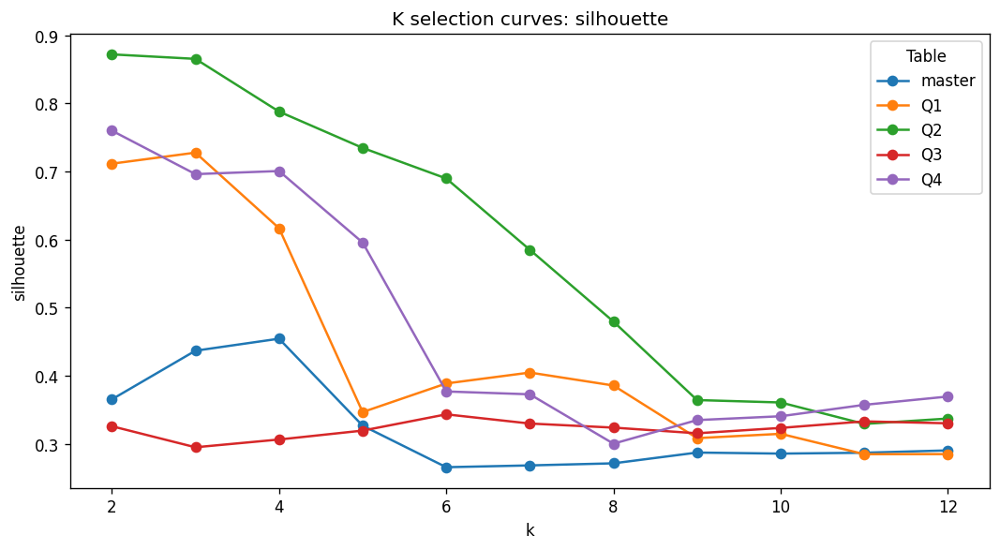

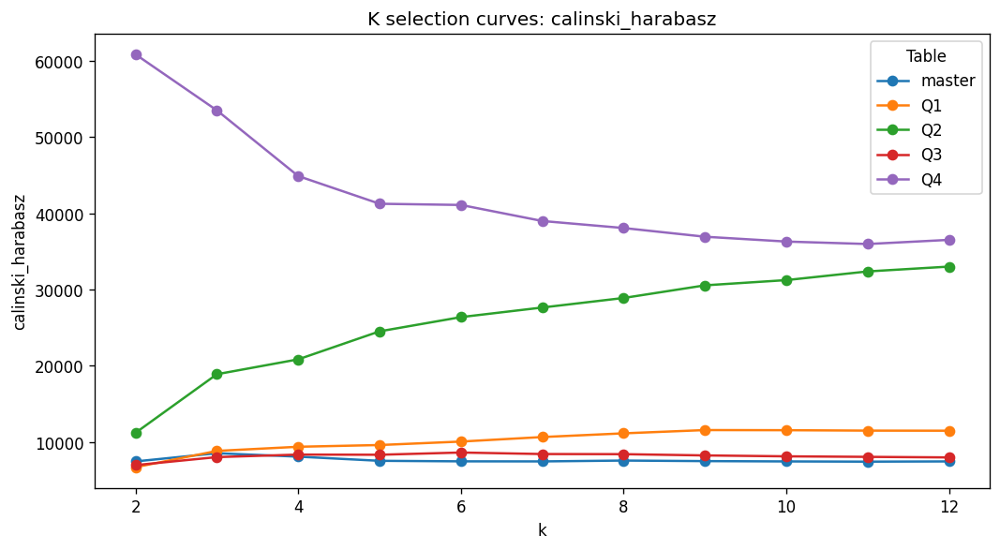

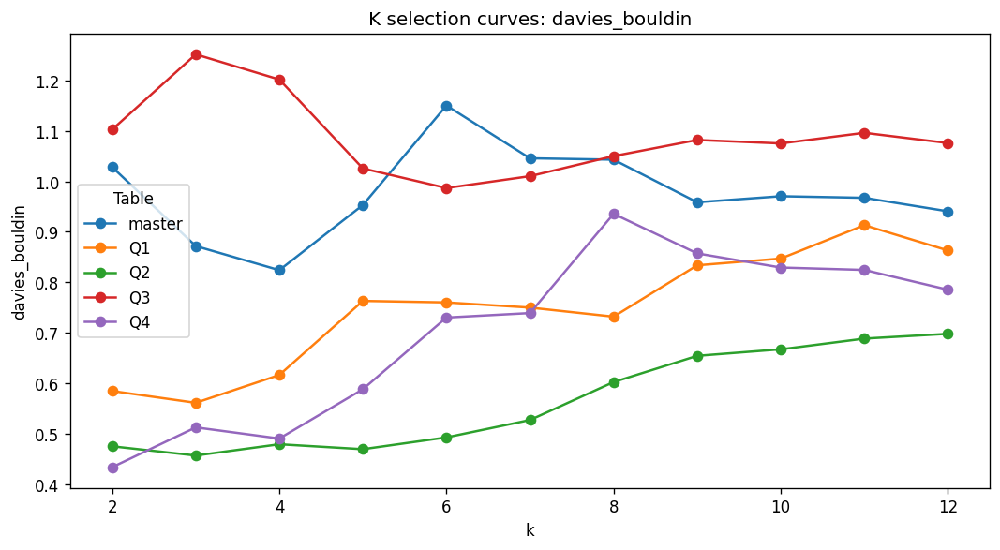

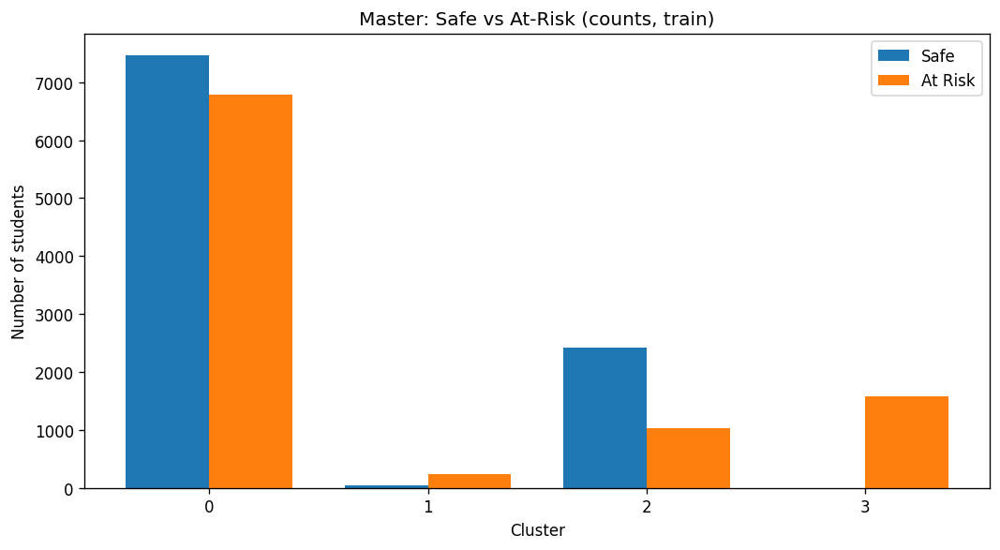

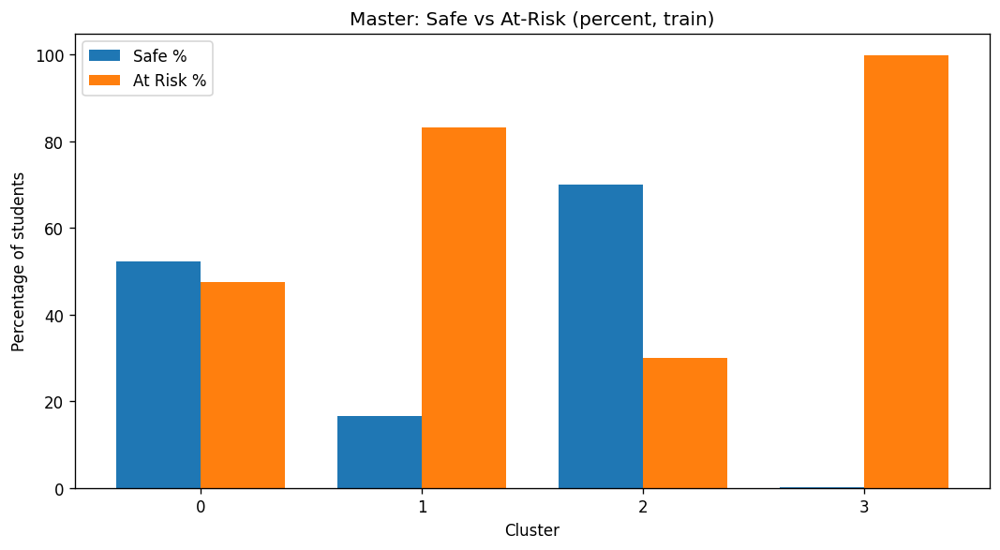

...

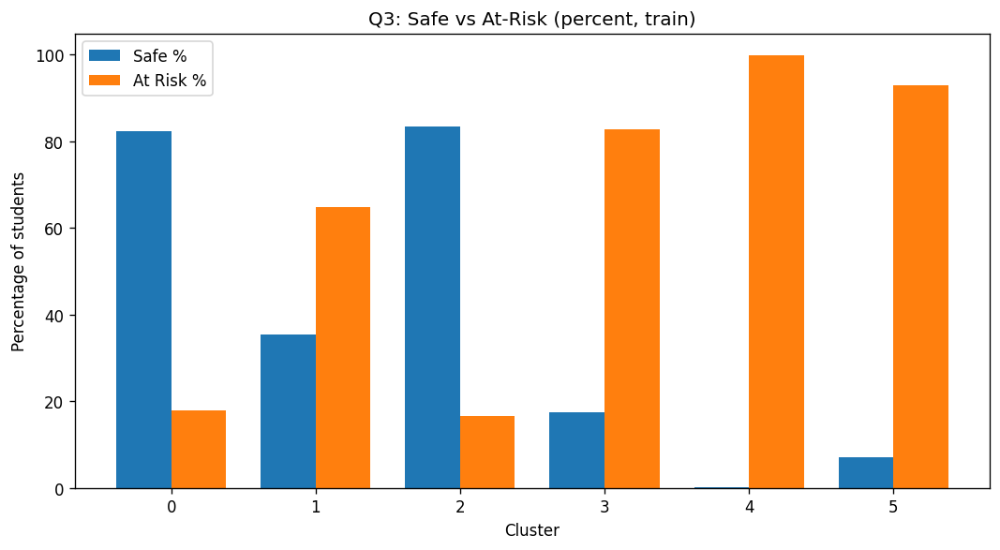

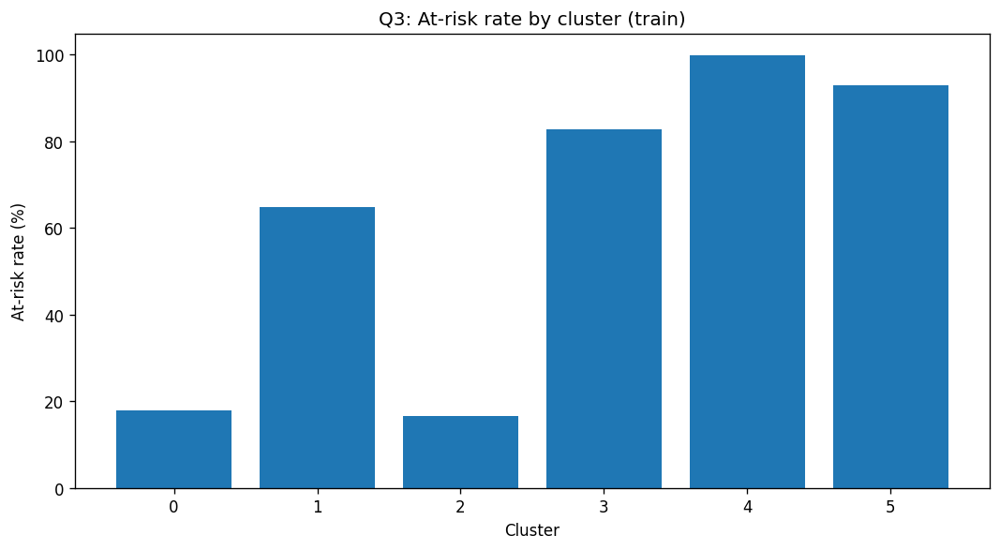

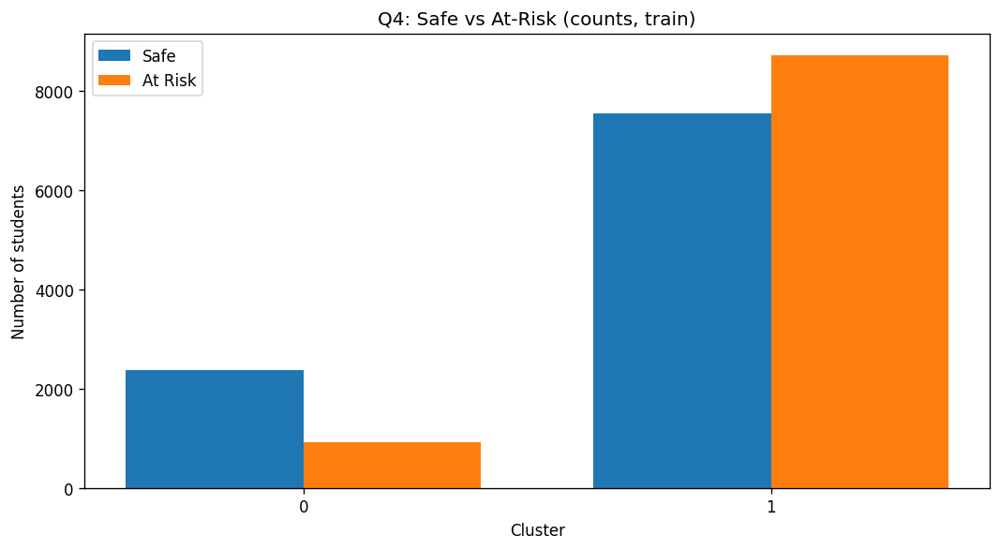

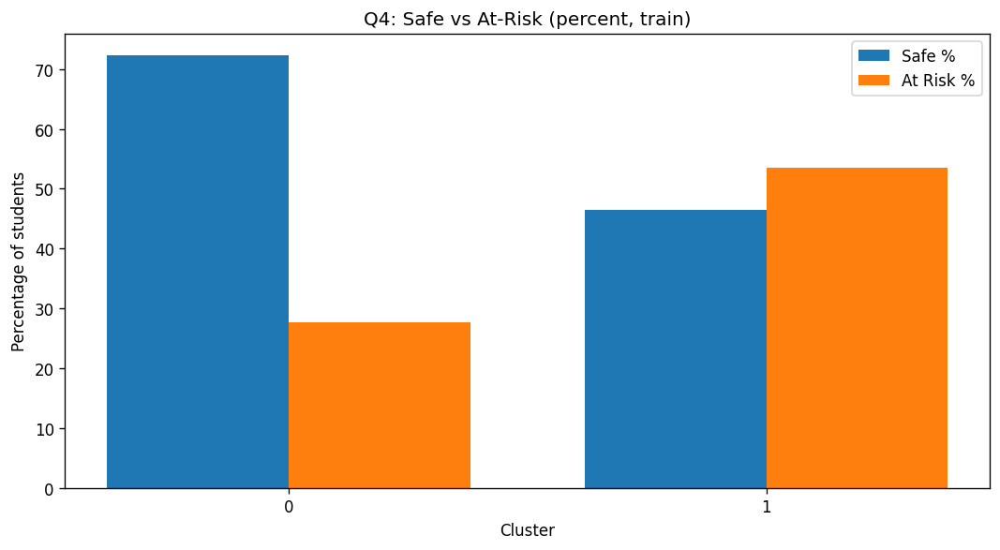

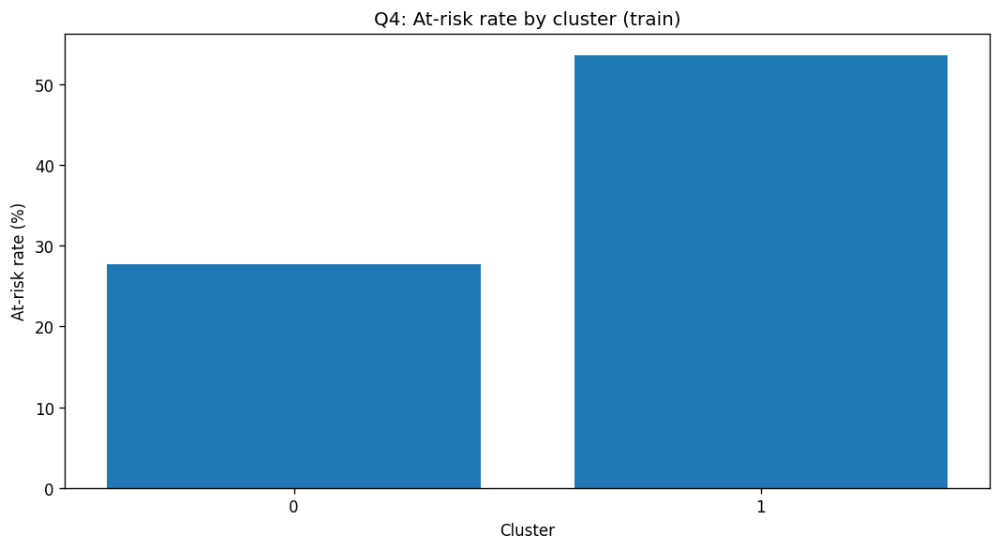

In [31]:
# Visualizatons for clustering

def _cluster_metrics_from_models(cluster_models: dict):
    rows = []
    for name, bundle in cluster_models.items():
        m = bundle.get("metrics", None)
        if m is None or len(m) == 0:
            continue
        m = m.copy()
        m["table"] = name
        rows.append(m)
    if not rows:
        return pd.DataFrame()
    out = pd.concat(rows, ignore_index=True)
    return out[["table","k","silhouette","calinski_harabasz","davies_bouldin"]]


def plot_k_selection_curves(cluster_models, tables=("master","Q1","Q2","Q3","Q4")):
    metrics_df = _cluster_metrics_from_models(cluster_models)
    if metrics_df.empty:
        print("No metrics found in cluster_models (bundle['metrics'] missing).")
        return

    for metric in ["silhouette", "calinski_harabasz", "davies_bouldin"]:
        plt.figure(figsize=(9,5))
        for t in tables:
            d = metrics_df[metrics_df["table"] == t].sort_values("k")
            if d.empty:
                continue
            plt.plot(d["k"], d[metric], marker="o", label=str(t))
        plt.title(f"K selection curves: {metric}")
        plt.xlabel("k")
        plt.ylabel(metric)
        plt.legend(title="Table")
        plt.tight_layout()
        plt.show()

def cluster_profiles_table(df, cluster_col, feature_cols, outcome_col="target_at_risk"):
    feats = safe_cols(df, feature_cols)
    base_cols = [cluster_col] + feats + ([outcome_col] if outcome_col in df.columns else [])
    base = df[base_cols].copy()

    for c in feats:
        base[c] = pd.to_numeric(base[c], errors="coerce").fillna(0.0)

    prof = base.groupby(cluster_col)[feats].mean()
    n = base.groupby(cluster_col).size().rename("n_students")
    out = prof.merge(n, left_index=True, right_index=True)

    if outcome_col in base.columns:
        at_risk = base.groupby(cluster_col)[outcome_col].mean().rename("at_risk_%") * 100.0
        out = out.merge(at_risk, left_index=True, right_index=True)

    return out.sort_index()



def plot_cluster_heatmap_with_values(df, cluster_col, feature_cols, title):
    
    profile = (
        df.groupby(cluster_col)[feature_cols]
        .mean()
        .sort_index()
    )

    plt.figure(figsize=(10,5))
    sns.heatmap(
        profile,
        annot=True,         
        fmt=".2f",          
        cmap="coolwarm",
        linewidths=0.5
    )

    plt.title(title)
    plt.xlabel("Features")
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()

def plot_safe_risk_side_by_side(df, cluster_col, title, outcome_col="target_at_risk"):
    dist = (
        df.groupby([cluster_col, outcome_col])
        .size()
        .unstack(fill_value=0)
        .sort_index()
    )
    if 0 not in dist.columns: dist[0] = 0
    if 1 not in dist.columns: dist[1] = 0
    dist = dist[[0,1]]
    dist.columns = ["Safe", "At_Risk"]

    clusters = dist.index.astype(str).tolist()
    x = np.arange(len(clusters))
    w = 0.38

    plt.figure(figsize=(9,5))
    plt.bar(x - w/2, dist["Safe"].to_numpy(), w, label="Safe")
    plt.bar(x + w/2, dist["At_Risk"].to_numpy(), w, label="At Risk")
    plt.xticks(x, clusters)
    plt.xlabel("Cluster")
    plt.ylabel("Number of students")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_safe_risk_side_by_side_pct(df, cluster_col, title, outcome_col="target_at_risk"):
    dist = (
        df.groupby([cluster_col, outcome_col])
        .size()
        .unstack(fill_value=0)
        .sort_index()
    )
    if 0 not in dist.columns: dist[0] = 0
    if 1 not in dist.columns: dist[1] = 0
    dist = dist[[0,1]]
    dist = dist.div(dist.sum(axis=1).replace(0, np.nan), axis=0).fillna(0.0) * 100.0
    dist.columns = ["Safe_%", "At_Risk_%"]

    clusters = dist.index.astype(str).tolist()
    x = np.arange(len(clusters))
    w = 0.38

    plt.figure(figsize=(9,5))
    plt.bar(x - w/2, dist["Safe_%"].to_numpy(), w, label="Safe %")
    plt.bar(x + w/2, dist["At_Risk_%"].to_numpy(), w, label="At Risk %")
    plt.xticks(x, clusters)
    plt.xlabel("Cluster")
    plt.ylabel("Percentage of students")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_risk_rate_by_cluster(df, cluster_col, title, outcome_col="target_at_risk"):
    rate = df.groupby(cluster_col)[outcome_col].mean().sort_index() * 100.0
    clusters = rate.index.astype(str).tolist()
    x = np.arange(len(clusters))

    plt.figure(figsize=(9,5))
    plt.bar(x, rate.to_numpy())
    plt.xticks(x, clusters)
    plt.xlabel("Cluster")
    plt.ylabel("At-risk rate (%)")
    plt.title(title)
    plt.tight_layout()
    plt.show()


def visualize_all(ml_master_train, ml_Q1_train, ml_Q2_train, ml_Q3_train, ml_Q4_train,
                  CLUSTERING_FEATURES, CLUSTER_FEATURES_Q,
                  cluster_models=None):

    if cluster_models is not None:
        plot_k_selection_curves(cluster_models, tables=("master","Q1","Q2","Q3","Q4"))

    plot_safe_risk_side_by_side(
        ml_master_train, "cluster_master_id",
        "Master: Safe vs At-Risk (counts, train)"
    )
    plot_safe_risk_side_by_side_pct(
        ml_master_train, "cluster_master_id",
        "Master: Safe vs At-Risk (percent, train)"
    )
    plot_risk_rate_by_cluster(
        ml_master_train, "cluster_master_id",
        "Master: At-risk rate by cluster (train)"
    )

    quarter_map = {
        "Q1": (ml_Q1_train, "cluster_Q1_id"),
        "Q2": (ml_Q2_train, "cluster_Q2_id"),
        "Q3": (ml_Q3_train, "cluster_Q3_id"),
        "Q4": (ml_Q4_train, "cluster_Q4_id"),
    }
    for q, (df, ccol) in quarter_map.items():
        plot_safe_risk_side_by_side(
            df, ccol,
            f"{q}: Safe vs At-Risk (counts, train)"
        )
        plot_safe_risk_side_by_side_pct(
            df, ccol,
            f"{q}: Safe vs At-Risk (percent, train)"
        )
        plot_risk_rate_by_cluster(
            df, ccol,
            f"{q}: At-risk rate by cluster (train)"
        )


visualize_all(
    ml_master_train, ml_Q1_train, ml_Q2_train, ml_Q3_train, ml_Q4_train,
    CLUSTERING_FEATURES, CLUSTER_FEATURES_Q,
    cluster_models=cluster_models 
)

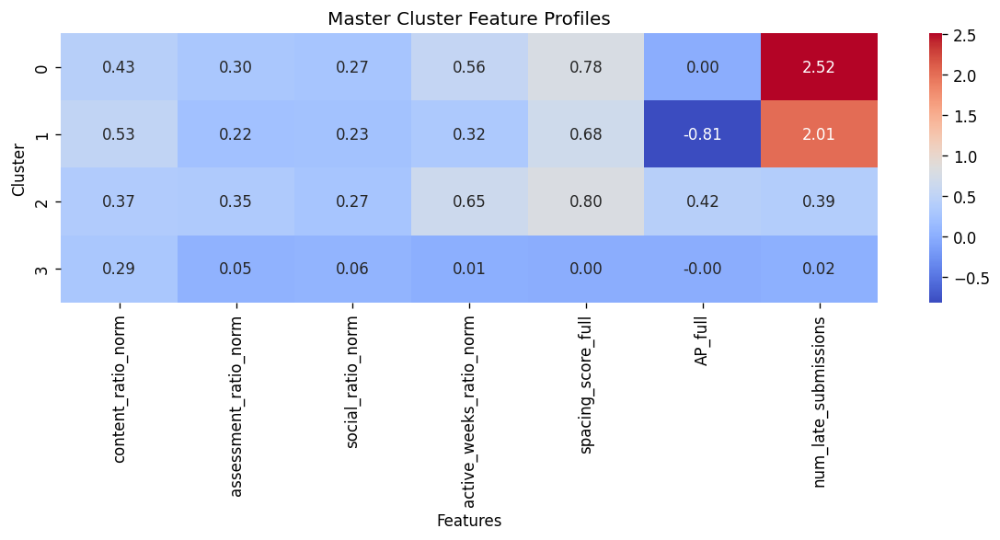

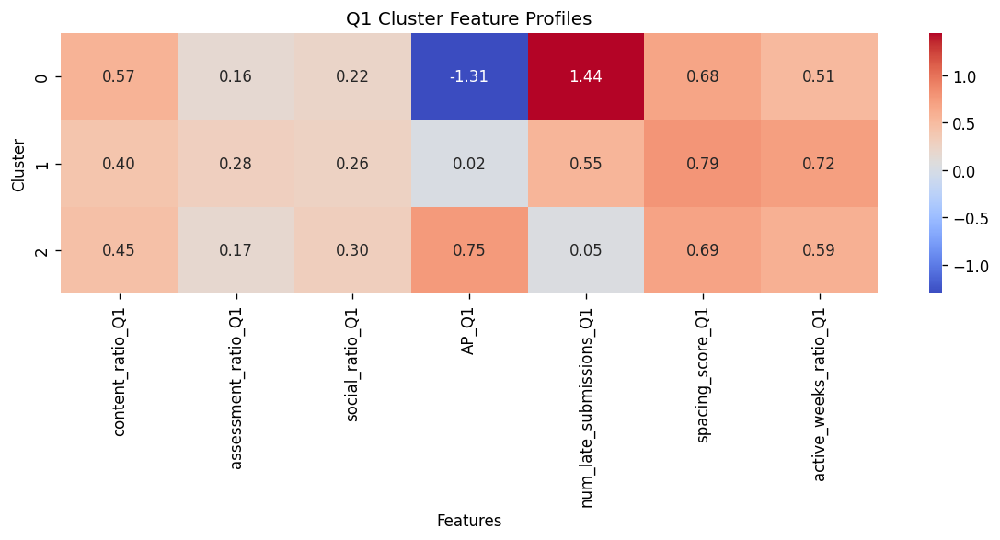

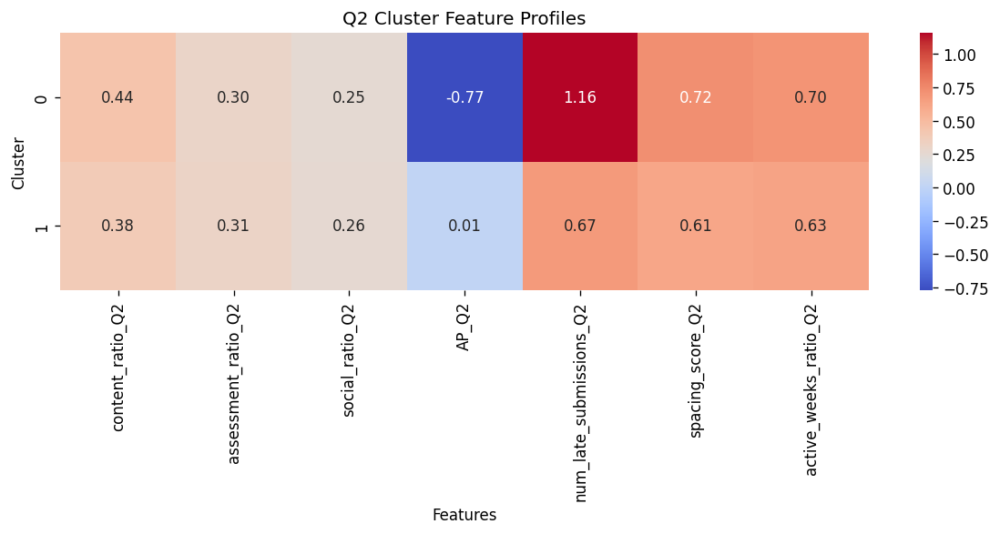

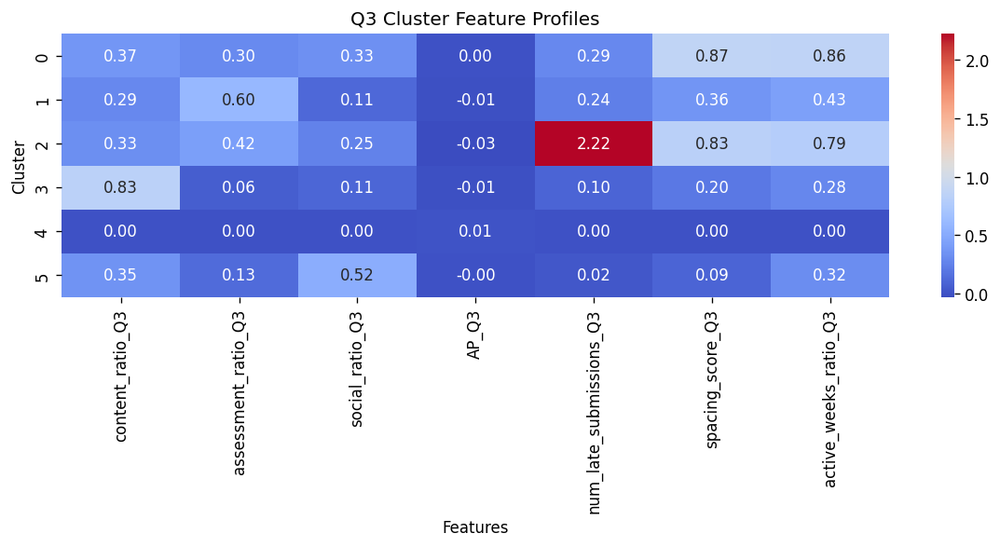

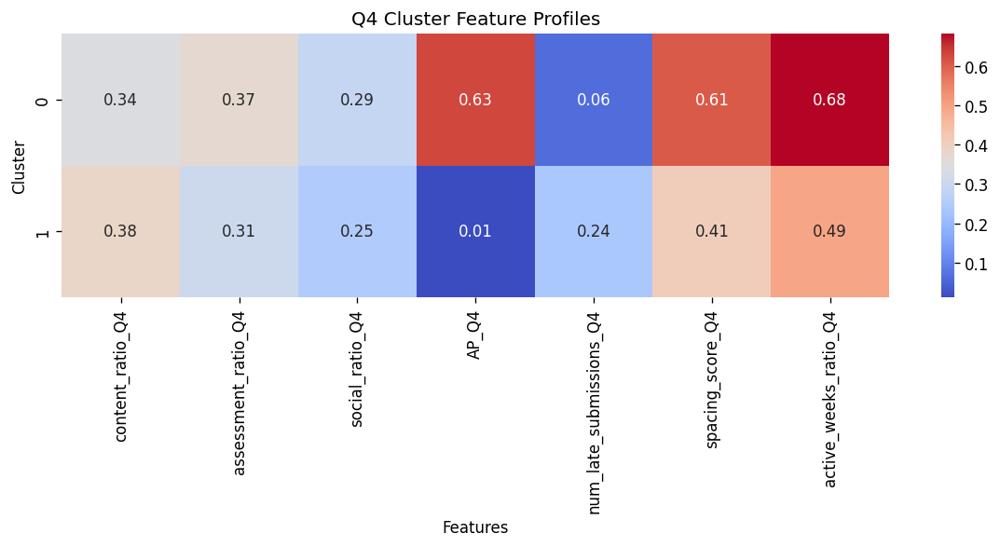

In [32]:
# Visualizations for clusters 
def plot_cluster_heatmap(df, cluster_col, feature_cols, title):
    profile = (
        df.groupby(cluster_col)[feature_cols]
        .mean()
    )

    plt.figure(figsize=(10,5))
    sns.heatmap(profile, annot=True, fmt=".2f", cmap="coolwarm")
    plt.title(title)
    plt.xlabel("Features")
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()

plot_cluster_heatmap(
    df=ml_master_train,
    cluster_col="cluster_master_id",
    feature_cols=CLUSTERING_FEATURES,
    title="Master Cluster Feature Profiles"
)

plot_cluster_heatmap(
    ml_Q1_train,
    cluster_col="cluster_Q1_id",
    feature_cols=CLUSTER_FEATURES_Q["Q1"],
    title="Q1 Cluster Feature Profiles"
)

plot_cluster_heatmap(
    ml_Q2_train,
    cluster_col="cluster_Q2_id",
    feature_cols=CLUSTER_FEATURES_Q["Q2"],
    title="Q2 Cluster Feature Profiles"
)

plot_cluster_heatmap(
    ml_Q3_train,
    cluster_col="cluster_Q3_id",
    feature_cols=CLUSTER_FEATURES_Q["Q3"],
    title="Q3 Cluster Feature Profiles"
)

plot_cluster_heatmap(
    ml_Q4_train,
    cluster_col="cluster_Q4_id",
    feature_cols=CLUSTER_FEATURES_Q["Q4"],
    title="Q4 Cluster Feature Profiles"
)

## ML Model

In [33]:
# Limit PyTorch to a single CPU thread for consistent performance
torch.set_num_threads(1)

sns.set_style("whitegrid")
plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.spines.top": False,
    "axes.spines.right": False
})

# Define key identifier columns and target label
KEYS   = ["id_student", "code_module", "code_presentation"]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("\nClass balance (train):")
print(ml_master_train[TARGET].value_counts())
print(ml_master_train[TARGET].value_counts(normalize=True).round(3))


Class balance (train):
target_at_risk
0    9928
1    9622
Name: count, dtype: int64
target_at_risk
0    0.508
1    0.492
Name: proportion, dtype: float64


In [34]:
# Function to extract feature columns by excluding identifier keys and target label
def get_feature_cols(df):
    return [c for c in df.columns if c not in KEYS + [TARGET]]


# Define modelling windows
# Each window contains:
# - training dataset
# - test dataset
# - list of feature columns used for modelling
WINDOWS = {
    "Q1": {
        "train": ml_Q1_train,
        "test":  ml_Q1_test,
        "features": get_feature_cols(ml_Q1_train),
    },
    "Q2": {
        "train": ml_Q2_train,
        "test":  ml_Q2_test,
        "features": get_feature_cols(ml_Q2_train),
    },
    "Q3": {
        "train": ml_Q3_train,
        "test":  ml_Q3_test,
        "features": get_feature_cols(ml_Q3_train),
    },
    "Master": {
        "train": ml_master_train,
        "test":  ml_master_test,
        "features": get_feature_cols(ml_master_train),
    },
}


# Display dataset summary for each modelling window
print("Windows:")
for label, w in WINDOWS.items():
    print(
        f"  {label:10s}  "
        f"train={len(w['train']):,}  "
        f"test={len(w['test']):,}  "
        f"features={len(w['features'])}"
    )


# Display the presentations used as the held-out test set
print("\nTest presentations (held out per module):")
print(test_presentations.to_string(index=False))

Windows:
  Q1          train=19,550  test=10,365  features=39
  Q2          train=19,550  test=10,365  features=37
  Q3          train=19,550  test=10,365  features=45
  Master      train=19,550  test=10,365  features=41

Test presentations (held out per module):
code_module code_presentation
        AAA             2014J
        BBB             2014J
        CCC             2014J
        DDD             2014J
        EEE             2014J
        FFF             2014J
        GGG             2014J


In [35]:
# Remove highly correlated features to reduce multicollinearity
def correlation_filter(X_df, features, threshold=0.85, verbose=True):

    # Extract feature subset
    X = X_df[features].copy()

    # Compute absolute Pearson correlation matrix
    corr_matrix = X.corr().abs()

    # Keep only the upper triangle of the matrix to avoid duplicate pairs
    upper = corr_matrix.where(
        np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
    )

    # Store highly correlated feature pairs
    high_corr_pairs = []

    # Track features that should be removed
    to_drop = set()

    # Identify feature pairs exceeding the correlation threshold
    for col in upper.columns:
        correlated_with_col = upper.index[upper[col] > threshold].tolist()
        for row in correlated_with_col:
            high_corr_pairs.append((row, col, upper.loc[row, col]))
            to_drop.add(col)  # drop the later feature

    # Keep only non-correlated features
    kept = [f for f in features if f not in to_drop]

    # Print summary if verbose mode is enabled
    if verbose:
        print(f"    Correlation filter: {len(features)} -> {len(kept)}")

        if high_corr_pairs:
            print("    Highly correlated pairs:")
            for f1, f2, corr_val in sorted(high_corr_pairs, key=lambda x: -x[2]):
                print(f"      {f1} vs {f2} : r = {corr_val:.3f}")
        else:
            print("    No highly correlated pairs found.")

        if to_drop:
            print(f"    Dropped features: {sorted(to_drop)}")

    # Return filtered feature list, correlation matrix, and detected pairs
    return kept, corr_matrix, high_corr_pairs

In [36]:
SELECTED_FEATURES = {}
SELECTION_SUMMARY = []
CORR_INFO = {}

for window_label, w in WINDOWS.items():
    print(f"\n{'='*55}")
    print(f"  Feature selection — {window_label}")
    print(f"{'='*55}")

    train_df = w["train"]
    features = w["features"]

    # train only
    X_train = train_df[features].fillna(0)

    kept, corr_matrix, high_corr_pairs = correlation_filter(
        X_train,
        features,
        threshold=0.85,
        verbose=True
    )

    SELECTED_FEATURES[window_label] = kept
    CORR_INFO[window_label] = {
        "corr_matrix": corr_matrix,
        "high_corr_pairs": high_corr_pairs
    }

    SELECTION_SUMMARY.append({
        "Window": window_label,
        "Original": len(features),
        "Final": len(kept),
        "Dropped": sorted(list(set(features) - set(kept))),
        "Selected": kept,
    })

summary_df = pd.DataFrame(SELECTION_SUMMARY)

print("\n" + "="*55)
print("FEATURE SELECTION SUMMARY")
print("="*55)
print(summary_df[["Window", "Original", "Final"]].to_string(index=False))


  Feature selection — Q1
    Correlation filter: 39 -> 32
    Highly correlated pairs:
      AP_Q1 vs cluster_Q1_dist_2 : r = 0.962
      active_weeks_ratio_Q1 vs week_entropy_norm_Q1 : r = 0.940
      norm_total_Q1 vs norm_content_Q1 : r = 0.914
      spacing_score_Q1 vs spacing_defined_Q1 : r = 0.903
      spacing_score_Q1 vs active_weeks_ratio_Q1 : r = 0.895
      cluster_Q1_id vs cluster_Q1_2 : r = 0.888
      cluster_Q1_1 vs cluster_Q1_2 : r = 0.885
      spacing_score_Q1 vs week_entropy_norm_Q1 : r = 0.883
      norm_total_Q1 vs norm_social_Q1 : r = 0.871
    Dropped features: ['active_weeks_ratio_Q1', 'cluster_Q1_2', 'cluster_Q1_dist_2', 'norm_content_Q1', 'norm_social_Q1', 'spacing_defined_Q1', 'week_entropy_norm_Q1']

  Feature selection — Q2
    Correlation filter: 37 -> 30
    Highly correlated pairs:
      cluster_Q2_id vs cluster_Q2_0 : r = 1.000
      cluster_Q2_id vs cluster_Q2_1 : r = 1.000
      cluster_Q2_0 vs cluster_Q2_1 : r = 1.000
      spacing_score_Q2 vs spacin

In [37]:
# Define models used for classification

def make_models(spw=1.0):
    return {

        "Logistic Regression": Pipeline([
            ("scaler", RobustScaler()),
            ("clf", LogisticRegression(
                class_weight="balanced",
                max_iter=1000,
                random_state=42
            ))
        ]),

        "SVM": Pipeline([
            ("scaler", RobustScaler()),
            ("clf", SVC(
                kernel="rbf",
                class_weight="balanced",
                probability=True,
                C=1.0,
                random_state=42
            ))
        ]),

        "Random Forest": Pipeline([
            ("scaler", RobustScaler()),
            ("clf", RandomForestClassifier(
                n_estimators=300,
                max_depth=8,
                min_samples_leaf=10,
                min_samples_split=20,
                max_features="sqrt",
                class_weight="balanced",
                random_state=42,
                n_jobs=-1
            ))
        ]),

        "XGBoost": Pipeline([
            ("scaler", RobustScaler()),
            ("clf", XGBClassifier(
                n_estimators=300,
                learning_rate=0.05,
                max_depth=3,
                subsample=0.7,
                colsample_bytree=0.7,
                reg_alpha=0.5,
                reg_lambda=2.0,
                scale_pos_weight=spw,
                random_state=42,
                eval_metric="logloss",
                verbosity=0
            ))
        ]),

        "MLP": Pipeline([
            ("scaler", RobustScaler()),
            ("clf", MLPClassifier(
                hidden_layer_sizes=(128,),
                alpha=0.001,
                learning_rate_init=0.001,
                max_iter=200,
                early_stopping=True,
                validation_fraction=0.1,
                random_state=42
            ))
        ]),
    }


# Evaluate model performance and return metrics

def score_row(name, model, X_te, y_te, window_label, features, y_prob=None):

    # Generate predictions
    y_pred = model.predict(X_te)

    # Compute predicted probabilities if not already provided
    if y_prob is None:
        y_prob = model.predict_proba(X_te)[:, 1]

    # Compute evaluation metrics
    row = {
        "Window":    window_label,
        "Model":     name,
        "Accuracy":  round(accuracy_score(y_te, y_pred), 4),
        "Precision": round(precision_score(y_te, y_pred, zero_division=0), 4),
        "Recall":    round(recall_score(y_te, y_pred, zero_division=0), 4),
        "F1":        round(f1_score(y_te, y_pred, zero_division=0), 4),
        "ROC-AUC":   round(roc_auc_score(y_te, y_prob), 4),

        # Store objects for later analysis (e.g., plots or explanations)
        "_model":    model,
        "_X_te":     X_te,
        "_y_te":     y_te,
        "_features": features,
        "_y_prob":   y_prob,
    }

    # Print model performance summary
    print(
        f"    {name:22s}  "
        f"Acc={row['Accuracy']:.3f}  "
        f"Prec={row['Precision']:.3f}  "
        f"Rec={row['Recall']:.3f}  "
        f"F1={row['F1']:.3f}  "
        f"AUC={row['ROC-AUC']:.3f}"
    )

    return row


# Confirm model definitions are ready
print("Models defined.")

Models defined.


In [38]:
# Run cross-validation on training data to estimate model performance
# Uses GroupKFold otherwise defaults to StratifiedKFold

def run_cross_validation(window_label, X_tr, y_tr, spw, groups=None):
    """
    CV on train data.
    If groups provided -> GroupKFold by module-presentation.
    Otherwise -> StratifiedKFold.
    """

    # Choose cross-validation strategy
    if groups is not None:
        # Count unique module–presentation groups
        unique_groups = pd.Series(groups).nunique()

        # Limit folds based on number of available groups
        n_splits = min(3, unique_groups)

        if n_splits < 2:
            raise ValueError(
                f"Not enough unique groups for GroupKFold in {window_label}. "
                f"Found only {unique_groups} unique groups."
            )

        # Group-aware CV prevents leakage across course presentations
        cv = GroupKFold(n_splits=n_splits)
        print(f"\n    --- GroupKFold CV on train cohort ({n_splits} folds, module-presentation groups) ---")

    else:
        # Standard stratified CV maintaining class distribution
        cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        print(f"\n    --- Stratified 5-Fold CV on train cohort ---")


    # Initialize models with class imbalance weight
    models = make_models(spw=spw)

    cv_rows = []

    # Evaluate each model using cross-validation
    for name, model in models.items():

        cv_results = cross_validate(
            model,
            X_tr,
            y_tr,
            cv=cv,
            groups=groups,
            scoring={
                "f1": "f1",
                "roc_auc": "roc_auc",
                "recall": "recall",
            },
            return_train_score=True,
            n_jobs=-1
        )

        # Aggregate CV performance metrics
        row = {
            "Window": window_label,
            "Model": name,

            "CV F1": round(cv_results["test_f1"].mean(), 4),
            "CV F1 Std": round(cv_results["test_f1"].std(), 4),

            "CV AUC": round(cv_results["test_roc_auc"].mean(), 4),
            "CV AUC Std": round(cv_results["test_roc_auc"].std(), 4),

            "CV Recall": round(cv_results["test_recall"].mean(), 4),

            # Training performance for overfitting analysis
            "Train AUC": round(cv_results["train_roc_auc"].mean(), 4),

            # Gap between training and validation performance
            "Overfit Gap": round(
                cv_results["train_roc_auc"].mean() - cv_results["test_roc_auc"].mean(), 4
            ),
        }

        cv_rows.append(row)

        # Simple overfitting indicator
        status = "OK" if row["Overfit Gap"] < 0.05 else "OVERFIT"

        print(
            f"    {name:22s}  "
            f"CV_AUC={row['CV AUC']:.3f}(+/-{row['CV AUC Std']:.3f})  "
            f"CV_F1={row['CV F1']:.3f}  "
            f"Gap={row['Overfit Gap']:.3f}  {status}"
        )

    # Return CV summary table
    return pd.DataFrame(cv_rows)

In [39]:
# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)


# Multi-Layer Perceptron architecture for tabular classification

class MLP(nn.Module):
    def __init__(self, input_dim):
        super().__init__()

        # Feedforward neural network with batch normalization and dropout
        self.net = nn.Sequential(
            nn.Linear(input_dim, 128),   # input layer
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(128, 64),          # hidden layer
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(64, 32),           # hidden layer
            nn.ReLU(),

            nn.Linear(32, 1)             # output layer (logit)
        )

    def forward(self, x):
        return self.net(x).squeeze(1)    # return logits


# Train MLP model with validation monitoring and early stopping

def train_mlp(X_tr, y_tr, X_te, y_te,
              epochs=40, batch_size=1024, lr=3e-3, patience=5):

    # Reproducibility
    torch.manual_seed(42)
    np.random.seed(42)

    # Print dataset statistics
    print(f"      [MLP] Input shape: {X_tr.shape} | pos={y_tr.sum()} neg={(y_tr==0).sum()}")

    # Train / Validation split
    print(f"      [MLP] Splitting train/val...")
    X_tr_inner, X_val, y_tr_inner, y_val = train_test_split(
        X_tr, y_tr, test_size=0.10, random_state=42, stratify=y_tr
    )

    print(f"      [MLP] Train inner: {X_tr_inner.shape} | Val: {X_val.shape}")

    # Feature scaling
    print(f"      [MLP] Scaling...")
    scaler = RobustScaler()

    X_tr_s = scaler.fit_transform(X_tr_inner)
    X_val_s = scaler.transform(X_val)
    X_te_s  = scaler.transform(X_te)

    # Handle class imbalance using positive class weighting
    pos_weight = torch.tensor(
        [(y_tr_inner == 0).sum() / max((y_tr_inner == 1).sum(), 1)],
        dtype=torch.float32
    ).to(device)

    print(f"      [MLP] pos_weight: {pos_weight.item():.3f}")

    # Build training DataLoader
    print(f"      [MLP] Building DataLoader (batch_size={batch_size})...")

    train_loader = DataLoader(
        TensorDataset(
            torch.tensor(X_tr_s, dtype=torch.float32),
            torch.tensor(y_tr_inner, dtype=torch.float32)
        ),
        batch_size=batch_size,
        shuffle=True,
        num_workers=0,
    )

    print(f"      [MLP] Batches per epoch: {len(train_loader)}")

    # Initialize model, loss, optimizer
    model = MLP(X_tr.shape[1]).to(device)

    print(f"      [MLP] Model on device: {device}")

    criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)

    # Early stopping variables
    best_state   = None
    best_val_auc = -np.inf
    wait         = 0

    X_val_t = torch.tensor(X_val_s, dtype=torch.float32).to(device)

    print(f"      [MLP] Starting training loop ({epochs} max epochs, patience={patience})...")

    # Training loop

    for epoch in range(epochs):

        model.train()
        epoch_loss = 0.0

        for xb, yb in train_loader:

            xb, yb = xb.to(device), yb.to(device)

            optimizer.zero_grad()

            logits = model(xb)
            loss   = criterion(logits, yb)

            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        # Validation evaluation
        model.eval()

        with torch.no_grad():
            val_logits = model(X_val_t)
            val_prob   = torch.sigmoid(val_logits).cpu().numpy()

        val_auc = roc_auc_score(y_val, val_prob)

        print(f"      [MLP] Epoch {epoch+1:>3}/{epochs}  "
              f"loss={epoch_loss/len(train_loader):.4f}  "
              f"val_auc={val_auc:.4f}  "
              f"wait={wait}/{patience}")

        # Save best model
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            best_state   = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            wait         = 0
        else:
            wait += 1

        # Early stopping condition
        if wait >= patience:
            print(f"      [MLP] Early stopping at epoch {epoch+1} "
                  f"(best val_auc={best_val_auc:.4f})")
            break

    # Final inference on full train and test sets
    print(f"      [MLP] Training done. Running final inference...")

    model.load_state_dict(best_state)
    model.eval()

    with torch.no_grad():

        tr_logits = model(torch.tensor(
            scaler.transform(X_tr), dtype=torch.float32).to(device))

        te_logits = model(torch.tensor(
            X_te_s, dtype=torch.float32).to(device))

        # Convert logits to probabilities
        y_prob_tr = torch.sigmoid(tr_logits).cpu().numpy()
        y_prob_te = torch.sigmoid(te_logits).cpu().numpy()

    print(f"      [MLP] Done")

    return y_prob_tr, y_prob_te

In [ ]:
# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)


# LSTM architecture for sequential engagement modelling

class LSTMModel(nn.Module):
    def __init__(self, input_size=3, hidden_size=64,
                 num_layers=2, dropout=0.3,
                 bidirectional=False, clf_hidden_dim=64):
        super().__init__()
        self.bidirectional = bidirectional

        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0,
            bidirectional=bidirectional
        )

        factor = 2 if bidirectional else 1
        self.classifier = nn.Sequential(
            nn.Linear(hidden_size * factor, clf_hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(clf_hidden_dim, 1)
        )

    def forward(self, x):
        _, (h_n, _) = self.lstm(x)

        last = (
            torch.cat([h_n[-2], h_n[-1]], dim=1)
            if self.bidirectional else h_n[-1]
        )

        return self.classifier(last).squeeze(1)


# Convert weekly behavioural features into masked sequences
def build_sequences_masked(df, global_max_week, q_end_col):

    """
    Build fixed-length weekly sequences for LSTM.
    Weeks beyond each student's true quarter cutoff are masked to zero.
    """

    pat = re.compile(r"^wk(\d{2})_(content|assessment|social)_norm$")

    # Identify weekly columns
    weeks = sorted({
        int(pat.match(c).group(1))
        for c in df.columns
        if pat.match(c) and int(pat.match(c).group(1)) <= global_max_week
    })

    if not weeks:
        return None

    n = len(df)

    # Sequence shape: (students, weeks, engagement dimensions)
    seq = np.zeros((n, len(weeks), 3), dtype=np.float32)

    # True quarter cutoff per student
    true_cutoffs = (
        df[q_end_col].values
        if q_end_col in df.columns
        else np.full(n, global_max_week)
    )

    for wi, wk in enumerate(weeks):

        # Retrieve weekly engagement features
        c = df.get(f"wk{wk:02d}_content_norm", pd.Series(0.0, index=df.index)).fillna(0).values
        a = df.get(f"wk{wk:02d}_assessment_norm", pd.Series(0.0, index=df.index)).fillna(0).values
        s = df.get(f"wk{wk:02d}_social_norm", pd.Series(0.0, index=df.index)).fillna(0).values

        # Mask weeks beyond each student's course quarter
        mask = (wk <= true_cutoffs).astype(np.float32)

        seq[:, wi, 0] = c * mask
        seq[:, wi, 1] = a * mask
        seq[:, wi, 2] = s * mask

    return seq   # shape: (n_students, n_weeks, 3)

def train_seq_model(
    X_tr, y_tr, X_te, y_te,
    bidirectional=False,
    hidden_size=64,
    num_layers=2,
    dropout=0.3,
    clf_hidden_dim=64,
    epochs=60,
    batch_size=512,
    lr=1e-3,
    patience=10,
    weight_decay=1e-4,
    return_val_auc=False,
    verbose=False
):
    torch.manual_seed(42)
    np.random.seed(42)

    idx = np.arange(len(y_tr))
    tr_idx, val_idx = train_test_split(
        idx,
        test_size=0.15,
        random_state=42,
        stratify=y_tr
    )

    X_tr_inner, y_tr_inner = X_tr[tr_idx], y_tr[tr_idx]
    X_val, y_val = X_tr[val_idx], y_tr[val_idx]

    mean = X_tr_inner.mean(axis=(0, 1), keepdims=True)
    std  = X_tr_inner.std(axis=(0, 1), keepdims=True) + 1e-8

    X_tr_s      = (X_tr_inner - mean) / std
    X_val_s     = (X_val - mean) / std
    X_te_s      = (X_te - mean) / std
    X_tr_full_s = (X_tr - mean) / std

    pos_weight = torch.tensor(
        [(y_tr_inner == 0).sum() / max((y_tr_inner == 1).sum(), 1)],
        dtype=torch.float32
    ).to(device)

    train_loader = DataLoader(
        TensorDataset(
            torch.tensor(X_tr_s, dtype=torch.float32),
            torch.tensor(y_tr_inner, dtype=torch.float32)
        ),
        batch_size=batch_size,
        shuffle=True
    )

    model = LSTMModel(
        input_size=X_tr.shape[2],
        hidden_size=hidden_size,
        num_layers=num_layers,
        dropout=dropout,
        bidirectional=bidirectional,
        clf_hidden_dim=clf_hidden_dim
    ).to(device)

    criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    best_state = None
    best_val_auc = -np.inf
    wait = 0

    X_val_t = torch.tensor(X_val_s, dtype=torch.float32).to(device)

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0.0

        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)

            optimizer.zero_grad()
            logits = model(xb)
            loss = criterion(logits, yb)
            loss.backward()

            nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            epoch_loss += loss.item()

        model.eval()
        with torch.no_grad():
            val_logits = model(X_val_t)
            val_prob = torch.sigmoid(val_logits).cpu().numpy()

        val_auc = roc_auc_score(y_val, val_prob)

        if val_auc > best_val_auc:
            best_val_auc = val_auc
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            wait = 0
        else:
            wait += 1

        if verbose and (epoch + 1) % 10 == 0:
            print(f"Epoch {epoch+1}/{epochs} loss={epoch_loss/len(train_loader):.4f} val_auc={val_auc:.4f}")

        if wait >= patience:
            if verbose:
                print(f"Early stopping at epoch {epoch+1}")
            break

    model.load_state_dict(best_state)
    model.eval()

    with torch.no_grad():
        tr_logits = model(torch.tensor(X_tr_full_s, dtype=torch.float32).to(device))
        te_logits = model(torch.tensor(X_te_s, dtype=torch.float32).to(device))

        y_prob_tr = torch.sigmoid(tr_logits).cpu().numpy()
        y_prob_te = torch.sigmoid(te_logits).cpu().numpy()

    if return_val_auc:
        return y_prob_tr, y_prob_te, best_val_auc

    return y_prob_tr, y_prob_te


In [41]:
# Verify q_end columns exist in seq tables
for col in ["q1_end", "q2_end", "q3_end", "q4_end"]:
    if col not in ml_seq_train.columns:
        print(f"WARNING: {col} missing from ml_seq_train — merging now")
        ml_seq_train = ml_seq_train.merge(
            course_windows[["code_module","code_presentation",
                            "q1_end","q2_end","q3_end","q4_end"]],
            on=["code_module","code_presentation"], how="left")
        ml_seq_test = ml_seq_test.merge(
            course_windows[["code_module","code_presentation",
                            "q1_end","q2_end","q3_end","q4_end"]],
            on=["code_module","code_presentation"], how="left")
        break

print("q_end cols in ml_seq_train:", 
      [c for c in ml_seq_train.columns if "q" in c and "end" in c])

q_end cols in ml_seq_train: ['q1_end', 'q2_end', 'q3_end', 'q4_end']


In [ ]:
# Determine maximum week length used for each modelling window
QUARTER_MAX_WEEKS = {
    "Q1":     int(course_windows["q1_end"].median()),   # typical Q1 length
    "Q2":     int(course_windows["q2_end"].median()),   # typical Q2 length
    "Q3":     int(course_windows["q3_end"].median()),   # typical Q3 length
    "Master": int(course_windows["q4_end"].max()),      # full course length
}
print("Quarter max weeks:", QUARTER_MAX_WEEKS)


# Threshold optimisation using training predictions
def find_best_threshold(y_true, y_prob, metric="f1"):

    # Search thresholds between 0.10 and 0.90
    thresholds = np.arange(0.10, 0.91, 0.02)

    best_thr = 0.50
    best_score = -1

    for thr in thresholds:

        # Convert probabilities to predictions
        y_pred = (y_prob >= thr).astype(int)

        # Compute chosen metric
        if metric == "f1":
            score = f1_score(y_true, y_pred, zero_division=0)
        elif metric == "recall":
            score = recall_score(y_true, y_pred, zero_division=0)
        elif metric == "precision":
            score = precision_score(y_true, y_pred, zero_division=0)
        else:
            raise ValueError("metric must be one of: f1, recall, precision")

        # Keep best-performing threshold
        if score > best_score:
            best_score = score
            best_thr = thr

    return best_thr, best_score


# Train model and obtain probability predictions
def fit_model_and_get_probs(model, X_tr, y_tr, X_te):

    model.fit(X_tr, y_tr)

    y_prob_tr = model.predict_proba(X_tr)[:, 1]  # train probabilities
    y_prob_te = model.predict_proba(X_te)[:, 1]  # test probabilities

    return model, y_prob_tr, y_prob_te


# Evaluate predictions using selected probability threshold
def score_probabilities(name, y_te, y_prob_te, window_label, features,
                        model_obj=None, X_te=None, threshold=0.5):

    # Convert probabilities to class predictions
    y_pred = (y_prob_te >= threshold).astype(int)

    row = {
        "Window": window_label,
        "Model": name,
        "Threshold": round(float(threshold), 3),

        "Accuracy": round(accuracy_score(y_te, y_pred), 4),
        "Precision": round(precision_score(y_te, y_pred, zero_division=0), 4),
        "Recall": round(recall_score(y_te, y_pred, zero_division=0), 4),
        "F1": round(f1_score(y_te, y_pred, zero_division=0), 4),
        "ROC-AUC": round(roc_auc_score(y_te, y_prob_te), 4),

        # Stored for later analysis/visualisation
        "_model": model_obj,
        "_X_te": X_te,
        "_y_te": y_te,
        "_features": features,
        "_y_prob": y_prob_te,
    }

    # Print performance summary
    print(
        f"    {name:22s}  "
        f"Thr={row['Threshold']:.2f}  "
        f"Acc={row['Accuracy']:.3f}  "
        f"Prec={row['Precision']:.3f}  "
        f"Rec={row['Recall']:.3f}  "
        f"F1={row['F1']:.3f}  "
        f"AUC={row['ROC-AUC']:.3f}"
    )

    return row


# Run modelling experiments across all time windows
all_cv_rows = []
all_test_rows = []

for window_label, w in WINDOWS.items():

    print(f"\n{'='*65}")
    print(f"  {window_label}")
    print(f"{'='*65}")

    # Extract selected features for this window
    features = SELECTED_FEATURES[window_label]
    train_df = w["train"]
    test_df = w["test"]

    X_tr = train_df[features].fillna(0).values
    X_te = test_df[features].fillna(0).values
    y_tr = train_df[TARGET].astype(int).values
    y_te = test_df[TARGET].astype(int).values

    # Compute class imbalance ratio
    spw = (y_tr == 0).sum() / max((y_tr == 1).sum(), 1)

    print(f"\n    Train: {len(y_tr):,}  Test: {len(y_te):,}  SPW: {spw:.2f}  Features: {len(features)}")

    # Cross-validation using module-presentation groups
    groups = (
        train_df["code_module"].astype(str) + "_" +
        train_df["code_presentation"].astype(str)
    ).values

    cv_df = run_cross_validation(window_label, X_tr, y_tr, spw, groups=groups)
    all_cv_rows.append(cv_df)

    # Final evaluation on held-out test presentation
    print(f"\n    --- Final Test (latest presentation per module) ---")

    models = make_models(spw=spw)

    for name, model in models.items():

        model, y_prob_tr, y_prob_te = fit_model_and_get_probs(model, X_tr, y_tr, X_te)

        # Tune threshold using training predictions
        best_thr, best_train_score = find_best_threshold(y_tr, y_prob_tr, metric="f1")

        print(f"    Best train threshold for {name}: {best_thr:.2f} (train F1={best_train_score:.3f})")

        row = score_probabilities(
            name=name,
            y_te=y_te,
            y_prob_te=y_prob_te,
            window_label=window_label,
            features=features,
            model_obj=model,
            X_te=X_te,
            threshold=best_thr
        )

        all_test_rows.append(pd.DataFrame([row]))



# Aggregate results
results_cv = pd.concat(all_cv_rows, ignore_index=True)
results_test = pd.concat(all_test_rows, ignore_index=True)


# Display columns
display_cols = ["Window", "Model", "Threshold", "Accuracy", "Precision", "Recall", "F1", "ROC-AUC"]
cv_display = ["Window", "Model", "CV AUC", "CV AUC Std", "CV F1", "CV F1 Std", "CV Recall", "Train AUC", "Overfit Gap"]


# Print cross-validation results
print("\n" + "="*95)
print("CROSS VALIDATION RESULTS (train cohort only)")
print("="*95)

print(results_cv[cv_display].to_string(index=False))


# Print final test results
print("\n" + "="*95)
print("FINAL TEST RESULTS (latest presentation per module)")
print("="*95)

print(results_test[display_cols].to_string(index=False))


# Save results for reporting
results_cv[cv_display].to_csv("results_cv.csv", index=False)
results_test[display_cols].to_csv("results_test.csv", index=False)

print("\nSaved results_cv.csv and results_test.csv")


# Overfitting diagnostics
print("\nOverfitting Check — CV Train vs CV Test AUC")
print("="*65)

for _, row in results_cv.iterrows():

    gap = row["Overfit Gap"]
    status = "OK" if gap < 0.05 else "OVERFIT"

    print(
        f"  {row['Window']:10s}  {row['Model']:22s}  "
        f"Train={row['Train AUC']:.3f}  "
        f"CV={row['CV AUC']:.3f}  "
        f"Gap={gap:.3f}  {status}"
    )

print("\nAll tabular windows complete.")

Quarter max weeks: {'Q1': 10, 'Q2': 19, 'Q3': 29, 'Master': 39}

  Q1

    Train: 19,550  Test: 10,365  SPW: 1.03  Features: 32

    --- GroupKFold CV on train cohort (3 folds, module-presentation groups) ---
    Logistic Regression     CV_AUC=0.818(+/-0.009)  CV_F1=0.716  Gap=0.006  OK
    SVM                     CV_AUC=0.824(+/-0.008)  CV_F1=0.723  Gap=0.020  OK
    Random Forest           CV_AUC=0.825(+/-0.010)  CV_F1=0.724  Gap=0.043  OK
    XGBoost                 CV_AUC=0.834(+/-0.011)  CV_F1=0.736  Gap=0.032  OK
    MLP                     CV_AUC=0.828(+/-0.008)  CV_F1=0.729  Gap=0.025  OK

    --- Final Test (latest presentation per module) ---
    Best train threshold for Logistic Regression: 0.38 (train F1=0.741)
    Logistic Regression     Thr=0.38  Acc=0.727  Prec=0.674  Rec=0.819  F1=0.740  AUC=0.828
    Best train threshold for SVM: 0.36 (train F1=0.759)
    SVM                     Thr=0.36  Acc=0.725  Prec=0.670  Rec=0.826  F1=0.740  AUC=0.830
    Best train threshold fo

In [ ]:
# Define static features to combine with weekly sequence features
HYBRID_STATIC_BASE = [
    "gender_bin", "disability_bin",
    "age_band_ord", "age_band_missing_flag",
    "highest_education_ord", "highest_education_missing_flag",
    "imd_ordinal", "imd_unknown_flag",
    "nation_England", "nation_Scotland", "nation_Wales", "nation_Northern_Ireland",
    "late_registration_flag",
    "studied_credits", "course_type_stem", "num_of_prev_attempts",
]

# Key identifier columns
KEYS = ["id_student", "code_module", "code_presentation"]

# Merge static features into sequence datasets
_static_train = ml_Q1_train[KEYS + HYBRID_STATIC_BASE].drop_duplicates(subset=KEYS)
_static_test  = ml_Q1_test[KEYS + HYBRID_STATIC_BASE].drop_duplicates(subset=KEYS)

# Attach static demographic/academic features to sequence tables
ml_seq_train_h = ml_seq_train.merge(_static_train, on=KEYS, how="left")
ml_seq_test_h  = ml_seq_test.merge(_static_test,   on=KEYS, how="left")

# Fill missing static values with 0
ml_seq_train_h[HYBRID_STATIC_BASE] = ml_seq_train_h[HYBRID_STATIC_BASE].fillna(0)
ml_seq_test_h[HYBRID_STATIC_BASE]  = ml_seq_test_h[HYBRID_STATIC_BASE].fillna(0)

# Check resulting dataset shapes
print(f"ml_seq_train_h: {ml_seq_train_h.shape}")
print(f"ml_seq_test_h:  {ml_seq_test_h.shape}")


class HybridLSTM(nn.Module):
    def __init__(self, seq_input_size, static_input_size,
                 hidden_size=64, num_layers=2, dropout=0.3,
                 bidirectional=False, static_hidden_dim=32,
                 clf_hidden_dim=64):
        super().__init__()
        self.bidirectional = bidirectional

        self.lstm = nn.LSTM(
            input_size=seq_input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0,
            bidirectional=bidirectional
        )

        factor = 2 if bidirectional else 1

        self.static_net = nn.Sequential(
            nn.Linear(static_input_size, static_hidden_dim),
            nn.BatchNorm1d(static_hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.classifier = nn.Sequential(
            nn.Linear(hidden_size * factor + static_hidden_dim, clf_hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(clf_hidden_dim, 1)
        )

    def forward(self, x_seq, x_static):
        _, (h_n, _) = self.lstm(x_seq)

        if self.bidirectional:
            last = torch.cat([h_n[-2], h_n[-1]], dim=1)
        else:
            last = h_n[-1]

        static_out = self.static_net(x_static)
        combined = torch.cat([last, static_out], dim=1)

        return self.classifier(combined).squeeze(1)

#  Train HybridLSTM / HybridBiLSTM model

def train_hybrid_seq_model(
    X_tr_seq, X_tr_static, y_tr,
    X_te_seq, X_te_static, y_te,
    bidirectional=False,
    hidden_size=64,
    num_layers=2,
    dropout=0.3,
    static_hidden_dim=32,
    clf_hidden_dim=64,
    epochs=60,
    batch_size=512,
    lr=1e-3,
    patience=10,
    weight_decay=1e-4,
    return_val_auc=False,
    verbose=False
):
    torch.manual_seed(42)
    np.random.seed(42)

    idx = np.arange(len(y_tr))
    tr_idx, val_idx = train_test_split(
        idx, test_size=0.15, random_state=42, stratify=y_tr
    )

    X_tr_seq_i = X_tr_seq[tr_idx]
    X_val_seq = X_tr_seq[val_idx]

    X_tr_static_i = X_tr_static[tr_idx]
    X_val_static = X_tr_static[val_idx]

    y_tr_inner = y_tr[tr_idx]
    y_val = y_tr[val_idx]

    static_scaler = RobustScaler()
    X_tr_static_s = static_scaler.fit_transform(X_tr_static_i)
    X_val_static_s = static_scaler.transform(X_val_static)
    X_te_static_s = static_scaler.transform(X_te_static)
    X_tr_static_full_s = static_scaler.transform(X_tr_static)

    mean = X_tr_seq_i.mean(axis=(0, 1), keepdims=True)
    std = X_tr_seq_i.std(axis=(0, 1), keepdims=True) + 1e-8

    X_tr_seq_s = (X_tr_seq_i - mean) / std
    X_val_seq_s = (X_val_seq - mean) / std
    X_te_seq_s = (X_te_seq - mean) / std
    X_tr_seq_full_s = (X_tr_seq - mean) / std

    pos_weight = torch.tensor(
        [(y_tr_inner == 0).sum() / max((y_tr_inner == 1).sum(), 1)],
        dtype=torch.float32
    ).to(device)

    train_loader = DataLoader(
        TensorDataset(
            torch.tensor(X_tr_seq_s, dtype=torch.float32),
            torch.tensor(X_tr_static_s, dtype=torch.float32),
            torch.tensor(y_tr_inner, dtype=torch.float32)
        ),
        batch_size=batch_size,
        shuffle=True,
        num_workers=0
    )

    model = HybridLSTM(
        seq_input_size=X_tr_seq.shape[2],
        static_input_size=X_tr_static.shape[1],
        hidden_size=hidden_size,
        num_layers=num_layers,
        dropout=dropout,
        bidirectional=bidirectional,
        static_hidden_dim=static_hidden_dim,
        clf_hidden_dim=clf_hidden_dim
    ).to(device)

    criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    best_state = None
    best_val_auc = -np.inf
    wait = 0

    X_val_seq_t = torch.tensor(X_val_seq_s, dtype=torch.float32).to(device)
    X_val_static_t = torch.tensor(X_val_static_s, dtype=torch.float32).to(device)

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0.0

        for x_seq_b, x_static_b, yb in train_loader:
            x_seq_b = x_seq_b.to(device)
            x_static_b = x_static_b.to(device)
            yb = yb.to(device)

            optimizer.zero_grad()
            logits = model(x_seq_b, x_static_b)
            loss = criterion(logits, yb)
            loss.backward()

            nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            epoch_loss += loss.item()

        model.eval()
        with torch.no_grad():
            val_logits = model(X_val_seq_t, X_val_static_t)
            val_prob = torch.sigmoid(val_logits).cpu().numpy()

        val_auc = roc_auc_score(y_val, val_prob)

        if val_auc > best_val_auc:
            best_val_auc = val_auc
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            wait = 0
        else:
            wait += 1

        if verbose and (epoch + 1) % 10 == 0:
            print(f"Epoch {epoch+1}/{epochs} loss={epoch_loss/len(train_loader):.4f} val_auc={val_auc:.4f}")

        if wait >= patience:
            if verbose:
                print(f"Early stopping at epoch {epoch+1}")
            break

    model.load_state_dict(best_state)
    model.eval()

    with torch.no_grad():
        tr_logits = model(
            torch.tensor(X_tr_seq_full_s, dtype=torch.float32).to(device),
            torch.tensor(X_tr_static_full_s, dtype=torch.float32).to(device)
        )
        te_logits = model(
            torch.tensor(X_te_seq_s, dtype=torch.float32).to(device),
            torch.tensor(X_te_static_s, dtype=torch.float32).to(device)
        )

        y_prob_tr = torch.sigmoid(tr_logits).cpu().numpy()
        y_prob_te = torch.sigmoid(te_logits).cpu().numpy()

    if return_val_auc:
        return y_prob_tr, y_prob_te, best_val_auc

    return y_prob_tr, y_prob_te

ml_seq_train_h: (19550, 141)
ml_seq_test_h:  (10365, 141)


In [44]:
QUARTER_CONFIG = {
    "Q1": ("q1_end", int(course_windows["q1_end"].max())),
    "Q2": ("q2_end", int(course_windows["q2_end"].max())),
    "Q3": ("q3_end", int(course_windows["q3_end"].max())),
    "Master": ("q4_end", int(course_windows["q4_end"].max())),
}

# Define static feature sets for HybridLSTM + cluster-aware features
HYBRID_STATIC_CAF = {
    "Q1": HYBRID_STATIC_BASE + [
        "caf_q1_risk_prior",
        "caf_q1_z_AP",
        "caf_q1_z_total",
        "caf_q1_z_active",
    ],
    "Q2": HYBRID_STATIC_BASE + [
        "caf_q2_risk_prior",
        "caf_q2_z_AP",
        "caf_q2_z_total",
        "caf_q2_z_active",
    ],
    "Q3": HYBRID_STATIC_BASE + [
        "caf_q3_risk_prior",
        "caf_q3_z_AP",
        "caf_q3_z_total",
        "caf_q3_z_active",
    ],
    "Master": HYBRID_STATIC_BASE + [
        "caf_master_risk_prior",
        "caf_master_z_AP",
        "caf_master_z_total",
        "caf_master_z_active",
    ],
}


def run_baseline_seq_windows(seq_train, seq_test):
    rows = []

    y_tr = seq_train[TARGET].astype(int).values
    y_te = seq_test[TARGET].astype(int).values

    for window_label, (q_end_col, global_max_wk) in QUARTER_CONFIG.items():
        print(f"\n{'='*70}")
        print(f"BASELINE SEQ — {window_label}")
        print(f"{'='*70}")

        X_tr_seq = build_sequences_masked(seq_train, global_max_wk, q_end_col)
        X_te_seq = build_sequences_masked(seq_test, global_max_wk, q_end_col)

        for model_name, bidir in [("LSTM", False), ("BiLSTM", True)]:
            print(f"\nTraining {model_name}...")

            y_prob_tr, y_prob_te = train_seq_model(
                X_tr_seq, y_tr, X_te_seq, y_te,
                bidirectional=bidir,
                hidden_size=64,
                num_layers=2,
                dropout=0.3,
                clf_hidden_dim=64,
                lr=1e-3,
                batch_size=512,
                weight_decay=1e-4,
                epochs=60,
                patience=10,
                verbose=False
            )

            best_thr, best_train_score = find_best_threshold(
                y_tr, y_prob_tr, metric="f1"
            )

            print(f"Best train threshold for {model_name}: {best_thr:.2f} (train F1={best_train_score:.3f})")

            row = score_probabilities(
                name=model_name,
                y_te=y_te,
                y_prob_te=y_prob_te,
                window_label=window_label,
                features=["content", "assessment", "social"],
                threshold=best_thr
            )

            row["Experiment"] = "seq_baseline"
            rows.append(row)

    return pd.DataFrame(rows)

def run_baseline_hybrid_windows(seq_train_h, seq_test_h):
    rows = []

    y_tr = seq_train_h[TARGET].astype(int).values
    y_te = seq_test_h[TARGET].astype(int).values

    X_tr_static_all = seq_train_h[HYBRID_STATIC_BASE].values.astype(np.float32)
    X_te_static_all = seq_test_h[HYBRID_STATIC_BASE].values.astype(np.float32)

    for window_label, (q_end_col, global_max_wk) in QUARTER_CONFIG.items():
        print(f"\n{'='*70}")
        print(f"BASELINE HYBRID — {window_label}")
        print(f"{'='*70}")

        X_tr_seq = build_sequences_masked(seq_train_h, global_max_wk, q_end_col)
        X_te_seq = build_sequences_masked(seq_test_h, global_max_wk, q_end_col)

        for model_name, bidir in [("HybridLSTM", False), ("HybridBiLSTM", True)]:
            print(f"\nTraining {model_name}...")

            y_prob_tr, y_prob_te = train_hybrid_seq_model(
                X_tr_seq, X_tr_static_all, y_tr,
                X_te_seq, X_te_static_all, y_te,
                bidirectional=bidir,
                hidden_size=64,
                num_layers=2,
                dropout=0.3,
                static_hidden_dim=32,
                clf_hidden_dim=64,
                lr=1e-3,
                batch_size=512,
                weight_decay=1e-4,
                epochs=60,
                patience=10,
                verbose=False
            )

            best_thr, best_train_score = find_best_threshold(
                y_tr, y_prob_tr, metric="f1"
            )

            print(f"Best train threshold for {model_name}: {best_thr:.2f} (train F1={best_train_score:.3f})")

            row = score_probabilities(
                name=model_name,
                y_te=y_te,
                y_prob_te=y_prob_te,
                window_label=window_label,
                features=["seq+static"],
                threshold=best_thr
            )

            row["Experiment"] = "hybrid_baseline"
            rows.append(row)

    return pd.DataFrame(rows)

In [46]:
print("\nRunning untuned sequence models...")
results_seq_baseline = run_baseline_seq_windows(ml_seq_train, ml_seq_test)

print("\nRunning untuned hybrid models...")
results_hybrid_baseline = run_baseline_hybrid_windows(ml_seq_train_h, ml_seq_test_h)


Running untuned sequence models...

BASELINE SEQ — Q1

Training LSTM...
Best train threshold for LSTM: 0.34 (train F1=0.726)
    LSTM                    Thr=0.34  Acc=0.707  Prec=0.649  Rec=0.833  F1=0.729  AUC=0.829

Training BiLSTM...
Best train threshold for BiLSTM: 0.34 (train F1=0.726)
    BiLSTM                  Thr=0.34  Acc=0.712  Prec=0.656  Rec=0.824  F1=0.730  AUC=0.829

BASELINE SEQ — Q2

Training LSTM...
Best train threshold for LSTM: 0.44 (train F1=0.809)
    LSTM                    Thr=0.44  Acc=0.827  Prec=0.839  Rec=0.785  F1=0.811  AUC=0.901

Training BiLSTM...
Best train threshold for BiLSTM: 0.36 (train F1=0.810)
    BiLSTM                  Thr=0.36  Acc=0.821  Prec=0.814  Rec=0.806  F1=0.810  AUC=0.902

BASELINE SEQ — Q3

Training LSTM...
Best train threshold for LSTM: 0.48 (train F1=0.879)
    LSTM                    Thr=0.48  Acc=0.884  Prec=0.915  Rec=0.832  F1=0.872  AUC=0.941

Training BiLSTM...
Best train threshold for BiLSTM: 0.46 (train F1=0.878)
    BiLST

In [47]:
results_seq_baseline.to_csv("results_seq_baseline.csv", index=False)
results_hybrid_baseline.to_csv("results_hybrid_baseline.csv", index=False)

In [48]:

display_cols = ["Window", "Model", "Accuracy",
                "Precision", "Recall", "F1", "ROC-AUC"]

cv_display   = ["Window", "Model", "CV AUC", "CV AUC Std",
                "CV F1", "CV F1 Std", "CV Recall",
                "Train AUC", "Overfit Gap"]

print("\n" + "="*95)
print("CROSS VALIDATION RESULTS (train cohort only — 5-fold)")
print("="*95)
print(results_cv[cv_display].to_string(index=False))

print("\n" + "="*95)
print("FINAL TEST RESULTS (latest presentation per module)")
print("="*95)
print(results_test[display_cols].to_string(index=False))

results_cv[cv_display].to_csv("results_cv.csv", index=False)
results_test[display_cols].to_csv("results_test.csv", index=False)
print("\nSaved results_cv.csv and results_test.csv")


CROSS VALIDATION RESULTS (train cohort only — 5-fold)
Window               Model  CV AUC  CV AUC Std  CV F1  CV F1 Std  CV Recall  Train AUC  Overfit Gap
    Q1 Logistic Regression  0.8178      0.0088 0.7156     0.0273     0.6648     0.8243       0.0064
    Q1                 SVM  0.8240      0.0082 0.7226     0.0265     0.6685     0.8442       0.0202
    Q1       Random Forest  0.8248      0.0100 0.7243     0.0209     0.6807     0.8683       0.0435
    Q1             XGBoost  0.8339      0.0114 0.7364     0.0210     0.6958     0.8655       0.0317
    Q1                 MLP  0.8278      0.0083 0.7294     0.0261     0.6868     0.8523       0.0245
    Q2 Logistic Regression  0.8974      0.0059 0.8023     0.0099     0.7191     0.9015       0.0042
    Q2                 SVM  0.8854      0.0069 0.7775     0.0066     0.6731     0.8987       0.0134
    Q2       Random Forest  0.8968      0.0054 0.7993     0.0046     0.7147     0.9290       0.0322
    Q2             XGBoost  0.9017      0.005

In [49]:
seq_display_cols = ["Window", "Model", "Threshold", "Accuracy", "Precision", "Recall", "F1", "ROC-AUC"]

print("\n--- LSTM / BiLSTM ---")
print(results_seq_baseline[seq_display_cols].to_string(index=False))

print("\n--- HybridLSTM / HybridBiLSTM ---")
print(results_hybrid_baseline[seq_display_cols].to_string(index=False))


--- LSTM / BiLSTM ---
Window  Model  Threshold  Accuracy  Precision  Recall     F1  ROC-AUC
    Q1   LSTM       0.34    0.7074     0.6489  0.8325 0.7293   0.8293
    Q1 BiLSTM       0.34    0.7120     0.6560  0.8240 0.7304   0.8293
    Q2   LSTM       0.44    0.8270     0.8393  0.7850 0.8112   0.9007
    Q2 BiLSTM       0.36    0.8209     0.8140  0.8060 0.8100   0.9021
    Q3   LSTM       0.48    0.8842     0.9155  0.8323 0.8719   0.9405
    Q3 BiLSTM       0.46    0.8890     0.9316  0.8264 0.8758   0.9429
Master   LSTM       0.50    0.9167     0.9507  0.8692 0.9081   0.9584
Master BiLSTM       0.42    0.9146     0.9372  0.8786 0.9069   0.9581

--- HybridLSTM / HybridBiLSTM ---
Window        Model  Threshold  Accuracy  Precision  Recall     F1  ROC-AUC
    Q1   HybridLSTM       0.38    0.7361     0.6834  0.8248 0.7475   0.8450
    Q1 HybridBiLSTM       0.38    0.7463     0.7019  0.8068 0.7507   0.8469
    Q2   HybridLSTM       0.42    0.8270     0.8143  0.8221 0.8182   0.9077
    Q2 H

## Cluster-based ML models

In [ ]:
# Save baseline results and create baseline-only feature sets

# Keep copies of baseline CV and test results for later comparison
results_cv_baseline   = results_cv.copy()
results_test_baseline = results_test.copy()

# Helper to identify clustering-related columns
def is_cluster_col(col):
    return (
        col.startswith("cluster_") or
        col.startswith("caf_")
    )

# Remove cluster-related features from selected feature lists
SELECTED_FEATURES_BASE = {
    k: [f for f in v if not is_cluster_col(f)]
    for k, v in SELECTED_FEATURES.items()
}

print("Baseline results and selected features saved")
for w in ["Q1", "Q2", "Q3", "Master"]:
    print(f"{w}: {len(SELECTED_FEATURES_BASE[w])} features")


# Create copies of modelling tables for cluster-aware experiments
ml_master_train_cl = ml_master_train.copy()
ml_master_test_cl  = ml_master_test.copy()
ml_Q1_train_cl     = ml_Q1_train.copy()
ml_Q1_test_cl      = ml_Q1_test.copy()
ml_Q2_train_cl     = ml_Q2_train.copy()
ml_Q2_test_cl      = ml_Q2_test.copy()
ml_Q3_train_cl     = ml_Q3_train.copy()
ml_Q3_test_cl      = ml_Q3_test.copy()

print("Cluster experiment copies created")


# Define behavioural features used to create cluster-aware z-scores

Z_FEATURES_BY_WINDOW = {
    "Q1":     ["AP_Q1",   "norm_total_Q1",         "active_weeks_ratio_Q1"],
    "Q2":     ["AP_Q2",   "norm_total_Q2",         "active_weeks_ratio_Q2"],
    "Q3":     ["AP_Q3",   "norm_total_Q3",         "active_weeks_ratio_Q3"],
    "Master": ["AP_full", "total_engagement_norm", "active_weeks_ratio_norm"],
}

# Mapping from modelling window to cluster ID column
CLUSTER_ID_COLS = {
    "Q1":     "cluster_Q1_id",
    "Q2":     "cluster_Q2_id",
    "Q3":     "cluster_Q3_id",
    "Master": "cluster_master_id",
}

# Helper to safely convert a series to numeric
def _safe_numeric(series):
    return pd.to_numeric(series, errors="coerce").fillna(0.0)


# Generic experiment runner for tabular models
# Supports both baseline and cluster-aware feature sets
def run_tabular_experiment(windows_dict, selected_features_dict, label="baseline"):
    all_cv_rows = []
    all_test_rows = []

    for window_label, w in windows_dict.items():
        print(f"\n{'='*70}")
        print(f"{label.upper()} — {window_label}")
        print(f"{'='*70}")

        # Extract feature list and train/test data
        features = selected_features_dict[window_label]
        train_df = w["train"]
        test_df  = w["test"]

        X_tr = train_df[features].fillna(0).values
        X_te = test_df[features].fillna(0).values
        y_tr = train_df[TARGET].astype(int).values
        y_te = test_df[TARGET].astype(int).values

        # Compute class imbalance ratio
        spw = (y_tr == 0).sum() / max((y_tr == 1).sum(), 1)
        print(f"\nTrain: {len(y_tr):,} | Test: {len(y_te):,} | SPW: {spw:.2f} | Features: {len(features)}")

        # Group identifiers for leakage-safe cross-validation
        groups = (
            train_df["code_module"].astype(str) + "_" +
            train_df["code_presentation"].astype(str)
        ).values

        # Cross-validation on training data
        cv_df = run_cross_validation(window_label, X_tr, y_tr, spw, groups=groups)
        cv_df["Experiment"] = label
        all_cv_rows.append(cv_df)

        # Final test evaluation for classical models
        print(f"\n--- Final Test ({label}) ---")
        models = make_models(spw=spw)

        for name, model in models.items():
            model, y_prob_tr, y_prob_te = fit_model_and_get_probs(model, X_tr, y_tr, X_te)

            # Tune threshold on training data only
            best_thr, best_train_score = find_best_threshold(
                y_tr, y_prob_tr, metric="f1"
            )

            print(f"Best train threshold for {name}: {best_thr:.2f} (train F1={best_train_score:.3f})")

            row = score_probabilities(
                name=name,
                y_te=y_te,
                y_prob_te=y_prob_te,
                window_label=window_label,
                features=features,
                model_obj=model,
                X_te=X_te,
                threshold=best_thr
            )
            row["Experiment"] = label
            all_test_rows.append(pd.DataFrame([row]))


    # Combine all CV and test results
    results_cv_exp = pd.concat(all_cv_rows, ignore_index=True)
    results_test_exp = pd.concat(all_test_rows, ignore_index=True)

    return results_cv_exp, results_test_exp


# Add final cluster-aware features
# These are computed from TRAIN only and then applied to both train/test

def add_cluster_aware_features_final(train_df, test_df, cluster_id_col, window, z_features_by_window):
    """
    Final cluster-aware features:
      - risk_prior : train-only cluster failure rate
      - z_AP       : AP score vs cluster peers
      - z_total    : total engagement vs cluster peers
      - z_active   : consistency vs cluster peers

    All statistics computed on TRAIN only, then applied to train/test.
    """

    prefix = f"caf_{window.lower()}"
    z_features = z_features_by_window[window]

    result_train = train_df.copy()
    result_test = test_df.copy()

    def _safe_numeric(series):
        return pd.to_numeric(series, errors="coerce").fillna(0.0)

    # Used if a cluster is missing in test or has unstable variance
    global_stats = {}
    for f in z_features:
        vals = _safe_numeric(train_df[f])
        mean_f = vals.mean()
        std_f = vals.std()

        if pd.isna(std_f) or std_f < 1e-6:
            std_f = 1e-6

        global_stats[f] = {"mean": mean_f, "std": std_f}

    global_risk = train_df[TARGET].mean()

    # Cluster-specific statistics from training data only
    cluster_stats = {}
    cluster_risk = {}

    for cid in sorted(train_df[cluster_id_col].dropna().unique()):
        mask = train_df[cluster_id_col] == cid
        stats = {}

        # Cluster-specific at-risk rate
        risk_val = train_df.loc[mask, TARGET].mean()
        cluster_risk[cid] = risk_val
        stats["risk_prior"] = risk_val

        # Cluster-specific mean and std for chosen behavioural features
        for f in z_features:
            vals = _safe_numeric(train_df.loc[mask, f])
            mean_f = vals.mean()
            std_f = vals.std()

            if pd.isna(std_f) or std_f < 1e-6:
                std_f = 1e-6

            stats[f] = {"mean": mean_f, "std": std_f}

        cluster_stats[cid] = stats

    # Identify highest-risk cluster in training set
    worst_cid = max(cluster_risk, key=cluster_risk.get)

    # Apply cluster-aware statistics to a dataframe
    def apply_stats(df):
        df = df.copy()
        labels = ["AP", "total", "active"]

        # Default fallback values
        df[f"{prefix}_risk_prior"] = global_risk
        for lbl in labels:
            df[f"{prefix}_z_{lbl}"] = 0.0

        for cid in df[cluster_id_col].dropna().unique():
            mask = df[cluster_id_col] == cid
            cid_stats = cluster_stats.get(cid, None)

            # Use cluster-specific risk if available, else global fallback
            if cid_stats is None:
                risk_val = global_risk
            else:
                risk_val = cid_stats["risk_prior"]

            df.loc[mask, f"{prefix}_risk_prior"] = risk_val

            # Compute z-scores relative to cluster peers
            for f, lbl in zip(z_features, labels):
                vals = _safe_numeric(df.loc[mask, f])

                if cid_stats is None:
                    mean_f = global_stats[f]["mean"]
                    std_f = global_stats[f]["std"]
                else:
                    mean_f = cid_stats[f]["mean"]
                    std_f = cid_stats[f]["std"]

                z = (vals - mean_f) / std_f
                df.loc[mask, f"{prefix}_z_{lbl}"] = z.clip(-3, 3)

        return df

    # Apply train-derived statistics to both train and test
    result_train = apply_stats(result_train)
    result_test = apply_stats(result_test)

    print(f"[{window}] cluster-aware features added")
    print(f"  Worst cluster (train only): {worst_cid}")
    print(f"  Worst-cluster risk: {cluster_risk[worst_cid]:.4f}")

    return result_train, result_test


# Build cluster-aware train/test tables for each window
ml_Q1_train_caf, ml_Q1_test_caf = add_cluster_aware_features_final(
    ml_Q1_train_cl, ml_Q1_test_cl, CLUSTER_ID_COLS["Q1"], "Q1", Z_FEATURES_BY_WINDOW
)
ml_Q2_train_caf, ml_Q2_test_caf = add_cluster_aware_features_final(
    ml_Q2_train_cl, ml_Q2_test_cl, CLUSTER_ID_COLS["Q2"], "Q2", Z_FEATURES_BY_WINDOW
)
ml_Q3_train_caf, ml_Q3_test_caf = add_cluster_aware_features_final(
    ml_Q3_train_cl, ml_Q3_test_cl, CLUSTER_ID_COLS["Q3"], "Q3", Z_FEATURES_BY_WINDOW
)
ml_master_train_caf, ml_master_test_caf = add_cluster_aware_features_final(
    ml_master_train_cl, ml_master_test_cl, CLUSTER_ID_COLS["Master"], "Master", Z_FEATURES_BY_WINDOW
)

print("\nFinal cluster-aware tables built")


# Define new cluster-aware feature columns added to each window
CAF_COLS_BY_WINDOW = {
    "Q1": [
        "caf_q1_risk_prior",
        "caf_q1_z_AP",
        "caf_q1_z_total",
        "caf_q1_z_active",
    ],
    "Q2": [
        "caf_q2_risk_prior",
        "caf_q2_z_AP",
        "caf_q2_z_total",
        "caf_q2_z_active",
    ],
    "Q3": [
        "caf_q3_risk_prior",
        "caf_q3_z_AP",
        "caf_q3_z_total",
        "caf_q3_z_active",
    ],
    "Master": [
        "caf_master_risk_prior",
        "caf_master_z_AP",
        "caf_master_z_total",
        "caf_master_z_active",
    ],
}

# Window dictionary for cluster-aware modelling
WINDOWS_CAF = {
    "Q1":     {"train": ml_Q1_train_caf,     "test": ml_Q1_test_caf},
    "Q2":     {"train": ml_Q2_train_caf,     "test": ml_Q2_test_caf},
    "Q3":     {"train": ml_Q3_train_caf,     "test": ml_Q3_test_caf},
    "Master": {"train": ml_master_train_caf, "test": ml_master_test_caf},
}

# Final feature lists = baseline features + new cluster-aware features
SELECTED_FEATURES_CLUSTER_AWARE_FINAL = {
    w: SELECTED_FEATURES_BASE[w] + CAF_COLS_BY_WINDOW[w]
    for w in WINDOWS_CAF
}

# Print feature count summary
for w in ["Q1", "Q2", "Q3", "Master"]:
    print(f"{w}: baseline={len(SELECTED_FEATURES_BASE[w])} | cluster-aware extra={len(CAF_COLS_BY_WINDOW[w])} | total={len(SELECTED_FEATURES_CLUSTER_AWARE_FINAL[w])}")


# Run final cluster-aware modelling experiment
results_cv_caf, results_test_caf = run_tabular_experiment(
    WINDOWS_CAF,
    SELECTED_FEATURES_CLUSTER_AWARE_FINAL,
    label="cluster_aware_final"
)

print("\nFinal cluster-aware experiment complete")

Baseline results and selected features saved
Q1: 27 features
Q2: 27 features
Q3: 26 features
Master: 29 features
Cluster experiment copies created
[Q1] cluster-aware features added
  Worst cluster (train only): 0
  Worst-cluster risk: 0.7315
[Q2] cluster-aware features added
  Worst cluster (train only): 1
  Worst-cluster risk: 0.4924
[Q3] cluster-aware features added
  Worst cluster (train only): 4
  Worst-cluster risk: 0.9980
[Master] cluster-aware features added
  Worst cluster (train only): 3
  Worst-cluster risk: 0.9987

Final cluster-aware tables built
Q1: baseline=27 | cluster-aware extra=4 | total=31
Q2: baseline=27 | cluster-aware extra=4 | total=31
Q3: baseline=26 | cluster-aware extra=4 | total=30
Master: baseline=29 | cluster-aware extra=4 | total=33

CLUSTER_AWARE_FINAL — Q1

Train: 19,550 | Test: 10,365 | SPW: 1.03 | Features: 31

    --- GroupKFold CV on train cohort (3 folds, module-presentation groups) ---
    Logistic Regression     CV_AUC=0.824(+/-0.010)  CV_F1=0.725

In [51]:
# Map each window to its train/test cluster-aware tabular table
WINDOW_TRAIN_TABLES_CAF = {
    "Q1": ml_Q1_train_caf,
    "Q2": ml_Q2_train_caf,
    "Q3": ml_Q3_train_caf,
    "Master": ml_master_train_caf,
}

WINDOW_TEST_TABLES_CAF = {
    "Q1": ml_Q1_test_caf,
    "Q2": ml_Q2_test_caf,
    "Q3": ml_Q3_test_caf,
    "Master": ml_master_test_caf,
}

def run_baseline_hybrid_caf_windows(seq_train_h, seq_test_h):
    rows = []

    y_tr = seq_train_h[TARGET].astype(int).values
    y_te = seq_test_h[TARGET].astype(int).values

    for window_label, (q_end_col, global_max_wk) in QUARTER_CONFIG.items():
        print(f"\n{'='*70}")
        print(f"BASELINE HYBRID CAF — {window_label}")
        print(f"{'='*70}")

        static_cols = [
            c for c in HYBRID_STATIC_CAF[window_label]
            if c in WINDOW_TRAIN_TABLES_CAF[window_label].columns
        ]

        train_static_df = (
            WINDOW_TRAIN_TABLES_CAF[window_label][KEYS + static_cols]
            .drop_duplicates(subset=KEYS)
            .copy()
        )
        test_static_df = (
            WINDOW_TEST_TABLES_CAF[window_label][KEYS + static_cols]
            .drop_duplicates(subset=KEYS)
            .copy()
        )

        seq_train_base = seq_train_h.drop(
            columns=[c for c in static_cols if c in seq_train_h.columns],
            errors="ignore"
        ).copy()
        seq_test_base = seq_test_h.drop(
            columns=[c for c in static_cols if c in seq_test_h.columns],
            errors="ignore"
        ).copy()

        seq_tr_w = seq_train_base.merge(train_static_df, on=KEYS, how="left")
        seq_te_w = seq_test_base.merge(test_static_df, on=KEYS, how="left")

        seq_tr_w[static_cols] = seq_tr_w[static_cols].fillna(0.0)
        seq_te_w[static_cols] = seq_te_w[static_cols].fillna(0.0)

        X_tr_static = seq_tr_w[static_cols].astype(np.float32).values
        X_te_static = seq_te_w[static_cols].astype(np.float32).values

        X_tr_seq = build_sequences_masked(seq_tr_w, global_max_wk, q_end_col)
        X_te_seq = build_sequences_masked(seq_te_w, global_max_wk, q_end_col)

        for model_name, bidir in [("HybridLSTM_CAF", False), ("HybridBiLSTM_CAF", True)]:
            print(f"\nTraining {model_name}...")

            y_prob_tr, y_prob_te = train_hybrid_seq_model(
                X_tr_seq, X_tr_static, y_tr,
                X_te_seq, X_te_static, y_te,
                bidirectional=bidir,
                hidden_size=64,
                num_layers=2,
                dropout=0.3,
                static_hidden_dim=32,
                clf_hidden_dim=64,
                lr=1e-3,
                batch_size=512,
                weight_decay=1e-4,
                epochs=60,
                patience=10,
                verbose=False
            )

            best_thr, best_train_score = find_best_threshold(
                y_tr, y_prob_tr, metric="f1"
            )

            print(f"Best train threshold for {model_name}: {best_thr:.2f} (train F1={best_train_score:.3f})")

            row = score_probabilities(
                name=model_name,
                y_te=y_te,
                y_prob_te=y_prob_te,
                window_label=window_label,
                features=static_cols,
                threshold=best_thr
            )

            row["Experiment"] = "hybrid_caf_baseline"
            rows.append(row)

    return pd.DataFrame(rows)

In [52]:
print("\nRunning untuned hybrid CAF models...")
results_hybrid_caf_baseline = run_baseline_hybrid_caf_windows(ml_seq_train_h, ml_seq_test_h)
results_hybrid_caf_baseline.to_csv("results_hybrid_caf_baseline.csv", index=False)

print("\n--- HybridLSTM_CAF / HybridBiLSTM_CAF ---")
print(results_hybrid_caf_baseline[seq_display_cols].to_string(index=False))


Running untuned hybrid CAF models...

BASELINE HYBRID CAF — Q1

Training HybridLSTM_CAF...
Best train threshold for HybridLSTM_CAF: 0.38 (train F1=0.758)
    HybridLSTM_CAF          Thr=0.38  Acc=0.744  Prec=0.690  Rec=0.835  F1=0.755  AUC=0.853

Training HybridBiLSTM_CAF...
Best train threshold for HybridBiLSTM_CAF: 0.38 (train F1=0.758)
    HybridBiLSTM_CAF        Thr=0.38  Acc=0.744  Prec=0.691  Rec=0.832  F1=0.755  AUC=0.855

BASELINE HYBRID CAF — Q2

Training HybridLSTM_CAF...
Best train threshold for HybridLSTM_CAF: 0.44 (train F1=0.830)
    HybridLSTM_CAF          Thr=0.44  Acc=0.841  Prec=0.844  Rec=0.814  F1=0.829  AUC=0.916

Training HybridBiLSTM_CAF...
Best train threshold for HybridBiLSTM_CAF: 0.44 (train F1=0.827)
    HybridBiLSTM_CAF        Thr=0.44  Acc=0.839  Prec=0.839  Rec=0.816  F1=0.828  AUC=0.916

BASELINE HYBRID CAF — Q3

Training HybridLSTM_CAF...
Best train threshold for HybridLSTM_CAF: 0.54 (train F1=0.883)
    HybridLSTM_CAF          Thr=0.54  Acc=0.885  Prec

In [54]:
SEQ_PARAM_GRID = [
    {
        "hidden_size": 32,
        "num_layers": 1,
        "dropout": 0.2,
        "clf_hidden_dim": 32,
        "lr": 1e-3,
        "batch_size": 256,
        "weight_decay": 1e-4,
    },
    {
        "hidden_size": 64,
        "num_layers": 1,
        "dropout": 0.3,
        "clf_hidden_dim": 64,
        "lr": 1e-3,
        "batch_size": 256,
        "weight_decay": 1e-4,
    },
    {
        "hidden_size": 64,
        "num_layers": 2,
        "dropout": 0.3,
        "clf_hidden_dim": 64,
        "lr": 5e-4,
        "batch_size": 256,
        "weight_decay": 1e-4,
    },
    {
        "hidden_size": 128,
        "num_layers": 2,
        "dropout": 0.3,
        "clf_hidden_dim": 64,
        "lr": 5e-4,
        "batch_size": 128,
        "weight_decay": 1e-4,
    },
]

HYBRID_PARAM_GRID = [
    {
        "hidden_size": 32,
        "num_layers": 1,
        "dropout": 0.2,
        "static_hidden_dim": 16,
        "clf_hidden_dim": 32,
        "lr": 1e-3,
        "batch_size": 256,
        "weight_decay": 1e-4,
    },
    {
        "hidden_size": 64,
        "num_layers": 1,
        "dropout": 0.3,
        "static_hidden_dim": 32,
        "clf_hidden_dim": 64,
        "lr": 1e-3,
        "batch_size": 256,
        "weight_decay": 1e-4,
    },
    {
        "hidden_size": 64,
        "num_layers": 2,
        "dropout": 0.3,
        "static_hidden_dim": 32,
        "clf_hidden_dim": 64,
        "lr": 5e-4,
        "batch_size": 256,
        "weight_decay": 1e-4,
    },
    {
        "hidden_size": 128,
        "num_layers": 2,
        "dropout": 0.3,
        "static_hidden_dim": 32,
        "clf_hidden_dim": 64,
        "lr": 5e-4,
        "batch_size": 128,
        "weight_decay": 1e-4,
    },
]

In [55]:
QUARTER_CONFIG = {
    "Q1": ("q1_end", int(course_windows["q1_end"].max())),
    "Q2": ("q2_end", int(course_windows["q2_end"].max())),
    "Q3": ("q3_end", int(course_windows["q3_end"].max())),
    "Master": ("q4_end", int(course_windows["q4_end"].max())),
}

def tune_seq_model_master_only(X_tr_seq, y_tr, X_te_seq, y_te,
                               bidirectional, param_grid, model_name,
                               epochs=60, patience=10):
    best_result = None
    best_val_auc = -np.inf

    print(f"\nTuning {model_name} on MASTER only...")

    for i, params in enumerate(param_grid, start=1):
        print(f"  Config {i}/{len(param_grid)}: {params}")

        y_prob_tr, y_prob_te, val_auc = train_seq_model(
            X_tr_seq, y_tr, X_te_seq, y_te,
            bidirectional=bidirectional,
            hidden_size=params["hidden_size"],
            num_layers=params["num_layers"],
            dropout=params["dropout"],
            clf_hidden_dim=params["clf_hidden_dim"],
            lr=params["lr"],
            batch_size=params["batch_size"],
            weight_decay=params["weight_decay"],
            epochs=epochs,
            patience=patience,
            return_val_auc=True,
            verbose=False
        )

        print(f"    val_auc={val_auc:.4f}")

        if val_auc > best_val_auc:
            best_val_auc = val_auc
            best_result = {
                "params": params,
                "best_val_auc": val_auc,
                "y_prob_tr": y_prob_tr,
                "y_prob_te": y_prob_te,
            }

    return best_result


def tune_hybrid_model_master_only(X_tr_seq, X_tr_static, y_tr,
                                  X_te_seq, X_te_static, y_te,
                                  bidirectional, param_grid, model_name,
                                  epochs=60, patience=10):
    best_result = None
    best_val_auc = -np.inf

    print(f"\nTuning {model_name} on MASTER only...")

    for i, params in enumerate(param_grid, start=1):
        print(f"  Config {i}/{len(param_grid)}: {params}")

        y_prob_tr, y_prob_te, val_auc = train_hybrid_seq_model(
            X_tr_seq, X_tr_static, y_tr,
            X_te_seq, X_te_static, y_te,
            bidirectional=bidirectional,
            hidden_size=params["hidden_size"],
            num_layers=params["num_layers"],
            dropout=params["dropout"],
            static_hidden_dim=params["static_hidden_dim"],
            clf_hidden_dim=params["clf_hidden_dim"],
            lr=params["lr"],
            batch_size=params["batch_size"],
            weight_decay=params["weight_decay"],
            epochs=epochs,
            patience=patience,
            return_val_auc=True,
            verbose=False
        )

        print(f"    val_auc={val_auc:.4f}")

        if val_auc > best_val_auc:
            best_val_auc = val_auc
            best_result = {
                "params": params,
                "best_val_auc": val_auc,
                "y_prob_tr": y_prob_tr,
                "y_prob_te": y_prob_te,
            }

    return best_result

def tune_all_models_on_master():
    best_params = {}

    master_q_end_col, master_max_week = QUARTER_CONFIG["Master"]

    y_tr = ml_seq_train[TARGET].astype(int).values
    y_te = ml_seq_test[TARGET].astype(int).values

    # LSTM / BiLSTM
    X_tr_seq_master = build_sequences_masked(ml_seq_train, master_max_week, master_q_end_col)
    X_te_seq_master = build_sequences_masked(ml_seq_test, master_max_week, master_q_end_col)

    best_params["LSTM"] = tune_seq_model_master_only(
        X_tr_seq_master, y_tr, X_te_seq_master, y_te,
        bidirectional=False, param_grid=SEQ_PARAM_GRID, model_name="LSTM"
    )

    best_params["BiLSTM"] = tune_seq_model_master_only(
        X_tr_seq_master, y_tr, X_te_seq_master, y_te,
        bidirectional=True, param_grid=SEQ_PARAM_GRID, model_name="BiLSTM"
    )

    # Hybrid / HybridBiLSTM
    X_tr_static_master = ml_seq_train_h[HYBRID_STATIC_BASE].values.astype(np.float32)
    X_te_static_master = ml_seq_test_h[HYBRID_STATIC_BASE].values.astype(np.float32)

    X_tr_seq_master_h = build_sequences_masked(ml_seq_train_h, master_max_week, master_q_end_col)
    X_te_seq_master_h = build_sequences_masked(ml_seq_test_h, master_max_week, master_q_end_col)

    best_params["HybridLSTM"] = tune_hybrid_model_master_only(
        X_tr_seq_master_h, X_tr_static_master, y_tr,
        X_te_seq_master_h, X_te_static_master, y_te,
        bidirectional=False, param_grid=HYBRID_PARAM_GRID, model_name="HybridLSTM"
    )

    best_params["HybridBiLSTM"] = tune_hybrid_model_master_only(
        X_tr_seq_master_h, X_tr_static_master, y_tr,
        X_te_seq_master_h, X_te_static_master, y_te,
        bidirectional=True, param_grid=HYBRID_PARAM_GRID, model_name="HybridBiLSTM"
    )

    # Hybrid CAF / HybridBiLSTM CAF
    static_cols_master = [
        c for c in HYBRID_STATIC_CAF["Master"]
        if c in WINDOW_TRAIN_TABLES_CAF["Master"].columns
    ]

    train_static_df = (
        WINDOW_TRAIN_TABLES_CAF["Master"][KEYS + static_cols_master]
        .drop_duplicates(subset=KEYS)
        .copy()
    )
    test_static_df = (
        WINDOW_TEST_TABLES_CAF["Master"][KEYS + static_cols_master]
        .drop_duplicates(subset=KEYS)
        .copy()
    )

    seq_train_base = ml_seq_train_h.drop(
        columns=[c for c in static_cols_master if c in ml_seq_train_h.columns],
        errors="ignore"
    ).copy()
    seq_test_base = ml_seq_test_h.drop(
        columns=[c for c in static_cols_master if c in ml_seq_test_h.columns],
        errors="ignore"
    ).copy()

    seq_tr_master_caf = seq_train_base.merge(train_static_df, on=KEYS, how="left")
    seq_te_master_caf = seq_test_base.merge(test_static_df, on=KEYS, how="left")

    seq_tr_master_caf[static_cols_master] = seq_tr_master_caf[static_cols_master].fillna(0.0)
    seq_te_master_caf[static_cols_master] = seq_te_master_caf[static_cols_master].fillna(0.0)

    X_tr_static_master_caf = seq_tr_master_caf[static_cols_master].astype(np.float32).values
    X_te_static_master_caf = seq_te_master_caf[static_cols_master].astype(np.float32).values

    X_tr_seq_master_caf = build_sequences_masked(seq_tr_master_caf, master_max_week, master_q_end_col)
    X_te_seq_master_caf = build_sequences_masked(seq_te_master_caf, master_max_week, master_q_end_col)

    best_params["HybridLSTM_CAF"] = tune_hybrid_model_master_only(
        X_tr_seq_master_caf, X_tr_static_master_caf, y_tr,
        X_te_seq_master_caf, X_te_static_master_caf, y_te,
        bidirectional=False, param_grid=HYBRID_PARAM_GRID, model_name="HybridLSTM_CAF"
    )

    best_params["HybridBiLSTM_CAF"] = tune_hybrid_model_master_only(
        X_tr_seq_master_caf, X_tr_static_master_caf, y_tr,
        X_te_seq_master_caf, X_te_static_master_caf, y_te,
        bidirectional=True, param_grid=HYBRID_PARAM_GRID, model_name="HybridBiLSTM_CAF"
    )

    return best_params

In [56]:
QUARTER_CONFIG = {
    "Q1": ("q1_end", int(course_windows["q1_end"].max())),
    "Q2": ("q2_end", int(course_windows["q2_end"].max())),
    "Q3": ("q3_end", int(course_windows["q3_end"].max())),
    "Master": ("q4_end", int(course_windows["q4_end"].max())),
}

def run_final_tuned_seq_windows(seq_train, seq_test, best_master_params):
    rows = []

    y_tr = seq_train[TARGET].astype(int).values
    y_te = seq_test[TARGET].astype(int).values

    for window_label, (q_end_col, global_max_wk) in QUARTER_CONFIG.items():
        X_tr_seq = build_sequences_masked(seq_train, global_max_wk, q_end_col)
        X_te_seq = build_sequences_masked(seq_test, global_max_wk, q_end_col)

        for model_name, bidir in [("LSTM", False), ("BiLSTM", True)]:
            params = best_master_params[model_name]["params"]

            y_prob_tr, y_prob_te = train_seq_model(
                X_tr_seq, y_tr, X_te_seq, y_te,
                bidirectional=bidir,
                hidden_size=params["hidden_size"],
                num_layers=params["num_layers"],
                dropout=params["dropout"],
                clf_hidden_dim=params["clf_hidden_dim"],
                lr=params["lr"],
                batch_size=params["batch_size"],
                weight_decay=params["weight_decay"],
                epochs=60,
                patience=10
            )

            best_thr, _ = find_best_threshold(y_tr, y_prob_tr, metric="f1")

            row = score_probabilities(
                name=f"{model_name}_tuned",
                y_te=y_te,
                y_prob_te=y_prob_te,
                window_label=window_label,
                features=["content", "assessment", "social"],
                threshold=best_thr
            )
            row["Master_Val_AUC"] = round(best_master_params[model_name]["best_val_auc"], 4)
            row["Best_Params"] = str(params)
            rows.append(row)

    return pd.DataFrame(rows)


def run_final_tuned_hybrid_windows(seq_train_h, seq_test_h, best_master_params):
    rows = []

    y_tr = seq_train_h[TARGET].astype(int).values
    y_te = seq_test_h[TARGET].astype(int).values

    X_tr_static_all = seq_train_h[HYBRID_STATIC_BASE].values.astype(np.float32)
    X_te_static_all = seq_test_h[HYBRID_STATIC_BASE].values.astype(np.float32)

    for window_label, (q_end_col, global_max_wk) in QUARTER_CONFIG.items():
        X_tr_seq = build_sequences_masked(seq_train_h, global_max_wk, q_end_col)
        X_te_seq = build_sequences_masked(seq_test_h, global_max_wk, q_end_col)

        for model_name, bidir in [("HybridLSTM", False), ("HybridBiLSTM", True)]:
            params = best_master_params[model_name]["params"]

            y_prob_tr, y_prob_te = train_hybrid_seq_model(
                X_tr_seq, X_tr_static_all, y_tr,
                X_te_seq, X_te_static_all, y_te,
                bidirectional=bidir,
                hidden_size=params["hidden_size"],
                num_layers=params["num_layers"],
                dropout=params["dropout"],
                static_hidden_dim=params["static_hidden_dim"],
                clf_hidden_dim=params["clf_hidden_dim"],
                lr=params["lr"],
                batch_size=params["batch_size"],
                weight_decay=params["weight_decay"],
                epochs=60,
                patience=10
            )

            best_thr, _ = find_best_threshold(y_tr, y_prob_tr, metric="f1")

            row = score_probabilities(
                name=f"{model_name}_tuned",
                y_te=y_te,
                y_prob_te=y_prob_te,
                window_label=window_label,
                features=["seq+static"],
                threshold=best_thr
            )
            row["Master_Val_AUC"] = round(best_master_params[model_name]["best_val_auc"], 4)
            row["Best_Params"] = str(params)
            rows.append(row)

    return pd.DataFrame(rows)


def run_final_tuned_hybrid_caf_windows(seq_train_h, seq_test_h, best_master_params):
    rows = []

    y_tr = seq_train_h[TARGET].astype(int).values
    y_te = seq_test_h[TARGET].astype(int).values

    for window_label, (q_end_col, global_max_wk) in QUARTER_CONFIG.items():
        static_cols = [
            c for c in HYBRID_STATIC_CAF[window_label]
            if c in WINDOW_TRAIN_TABLES_CAF[window_label].columns
        ]

        train_static_df = (
            WINDOW_TRAIN_TABLES_CAF[window_label][KEYS + static_cols]
            .drop_duplicates(subset=KEYS)
            .copy()
        )
        test_static_df = (
            WINDOW_TEST_TABLES_CAF[window_label][KEYS + static_cols]
            .drop_duplicates(subset=KEYS)
            .copy()
        )

        seq_train_base = seq_train_h.drop(
            columns=[c for c in static_cols if c in seq_train_h.columns],
            errors="ignore"
        ).copy()
        seq_test_base = seq_test_h.drop(
            columns=[c for c in static_cols if c in seq_test_h.columns],
            errors="ignore"
        ).copy()

        seq_tr_w = seq_train_base.merge(train_static_df, on=KEYS, how="left")
        seq_te_w = seq_test_base.merge(test_static_df, on=KEYS, how="left")

        seq_tr_w[static_cols] = seq_tr_w[static_cols].fillna(0.0)
        seq_te_w[static_cols] = seq_te_w[static_cols].fillna(0.0)

        X_tr_static = seq_tr_w[static_cols].astype(np.float32).values
        X_te_static = seq_te_w[static_cols].astype(np.float32).values

        X_tr_seq = build_sequences_masked(seq_tr_w, global_max_wk, q_end_col)
        X_te_seq = build_sequences_masked(seq_te_w, global_max_wk, q_end_col)

        for model_name, bidir in [("HybridLSTM_CAF", False), ("HybridBiLSTM_CAF", True)]:
            params = best_master_params[model_name]["params"]

            y_prob_tr, y_prob_te = train_hybrid_seq_model(
                X_tr_seq, X_tr_static, y_tr,
                X_te_seq, X_te_static, y_te,
                bidirectional=bidir,
                hidden_size=params["hidden_size"],
                num_layers=params["num_layers"],
                dropout=params["dropout"],
                static_hidden_dim=params["static_hidden_dim"],
                clf_hidden_dim=params["clf_hidden_dim"],
                lr=params["lr"],
                batch_size=params["batch_size"],
                weight_decay=params["weight_decay"],
                epochs=60,
                patience=10
            )

            best_thr, _ = find_best_threshold(y_tr, y_prob_tr, metric="f1")

            row = score_probabilities(
                name=f"{model_name}_tuned",
                y_te=y_te,
                y_prob_te=y_prob_te,
                window_label=window_label,
                features=static_cols,
                threshold=best_thr
            )
            row["Master_Val_AUC"] = round(best_master_params[model_name]["best_val_auc"], 4)
            row["Best_Params"] = str(params)
            rows.append(row)

    return pd.DataFrame(rows)

In [ ]:
# Define train/test tables for baseline experiments
WINDOWS_BASELINE = {
    "Q1":     {"train": ml_Q1_train,     "test": ml_Q1_test},
    "Q2":     {"train": ml_Q2_train,     "test": ml_Q2_test},
    "Q3":     {"train": ml_Q3_train,     "test": ml_Q3_test},
    "Master": {"train": ml_master_train, "test": ml_master_test},
}


# Hyperparameter grids for each model
PARAM_GRIDS = {
    "Logistic Regression": {
        "clf__C":        [0.01, 0.1, 1, 10, 100],
        "clf__penalty":  ["l1", "l2"],
        "clf__solver":   ["liblinear"],
    },
    "Random Forest": {
        "clf__n_estimators":      [100, 300, 500],
        "clf__max_depth":         [None, 5, 10, 20],
        "clf__min_samples_split": [2, 5, 10],
        "clf__max_features":      ["sqrt", "log2"],
    },
    "XGBoost": {
        "clf__n_estimators":  [100, 300, 500],
        "clf__max_depth":     [3, 5, 7],
        "clf__learning_rate": [0.01, 0.05, 0.1],
        "clf__subsample":     [0.7, 0.9, 1.0],
        "clf__colsample_bytree": [0.7, 0.9, 1.0],
    },
    "SVM": {
        "clf__C":      [0.1, 1, 10],
        "clf__gamma":  ["scale"],
        "clf__kernel": ["rbf"],
    },
    "MLP": {
        "clf__hidden_layer_sizes": [(64,), (128,), (64, 32), (128, 64)],
        "clf__alpha":              [0.0001, 0.001, 0.01],
        "clf__learning_rate_init": [0.001, 0.01],
        "clf__max_iter":           [200],
    },
}



# Define base models used for hyperparameter tuning
def make_tuning_models(spw):

    return {
        "Logistic Regression": LogisticRegression(
            class_weight="balanced",
            max_iter=1000,
            random_state=42
        ),

        "Random Forest": RandomForestClassifier(
            class_weight="balanced",
            random_state=42,
            n_jobs=-1
        ),

        "XGBoost": XGBClassifier(
            scale_pos_weight=spw,     # handle class imbalance
            eval_metric="auc",
            random_state=42,
            n_jobs=-1,
            verbosity=0
        ),

        "SVM": SVC(
            probability=True,
            class_weight="balanced",
            random_state=42,
            cache_size=500
        ),

        "MLP": MLPClassifier(
            early_stopping=True,
            validation_fraction=0.1,
            random_state=42
        ),
    }


# Run hyperparameter tuning for each modelling window and experiment type
def run_hyperparameter_tuning(windows_dict, features_dict, label="baseline"):
    tuned_rows = []

    for window_label, w in windows_dict.items():
        print(f"\n{'='*70}")
        print(f"TUNING [{label.upper()}] — {window_label}")
        print(f"{'='*70}")

        # Extract selected features and train/test splits
        features = features_dict[window_label]
        train_df = w["train"]
        test_df  = w["test"]

        X_tr = train_df[features].fillna(0).values
        X_te = test_df[features].fillna(0).values
        y_tr = train_df[TARGET].astype(int).values
        y_te = test_df[TARGET].astype(int).values

        # Compute class imbalance ratio for models that need it
        spw = (y_tr == 0).sum() / max((y_tr == 1).sum(), 1)

        # Create module-presentation groups for leakage-safe GroupKFold CV
        groups = (
            train_df["code_module"].astype(str) + "_" +
            train_df["code_presentation"].astype(str)
        ).values

        # Use group-aware 3-fold cross-validation
        cv = GroupKFold(n_splits=3)

        # Get model dictionary for this class balance
        models = make_tuning_models(spw)

        for name, base_model in models.items():
            print(f"\n  [{name}] tuning...")
            t0 = time.time()

            # Build preprocessing + model pipeline
            pipe = Pipeline([
                ("scaler", RobustScaler()),
                ("clf",    base_model),
            ])

            # Grid search over predefined hyperparameter combinations
            search = GridSearchCV(
                pipe,
                param_grid=PARAM_GRIDS[name],
                scoring="roc_auc",
                cv=cv,
                refit=True,
                n_jobs=-1,
                verbose=0,
            )

            # Fit grid search using grouped CV
            search.fit(X_tr, y_tr, groups=groups)

            # Extract best model and best CV result
            best_model  = search.best_estimator_
            best_params = search.best_params_
            best_cv_auc = search.best_score_

            # Generate train/test probabilities using the tuned model
            y_prob_tr = best_model.predict_proba(X_tr)[:, 1]
            y_prob_te = best_model.predict_proba(X_te)[:, 1]

            # Tune probability threshold on training data only
            best_thr, best_train_f1 = find_best_threshold(
                y_tr, y_prob_tr, metric="f1"
            )

            # Score final test predictions
            row = score_probabilities(
                name=f"{name}_tuned",
                y_te=y_te,
                y_prob_te=y_prob_te,
                window_label=window_label,
                features=features,
                model_obj=best_model,
                X_te=X_te,
                threshold=best_thr
            )

            # Store tuning metadata
            row["Experiment"]  = f"{label}_tuned"
            row["CV_AUC"]      = round(best_cv_auc, 4)
            row["Best_Params"] = str(best_params)

            tuned_rows.append(row)

            elapsed = time.time() - t0
            print(f"  {name} done in {elapsed:.1f}s")
            print(f"    Best CV AUC : {best_cv_auc:.4f}")
            print(f"    Best params : {best_params}")
            print(f"    Test AUC    : {row['ROC-AUC']:.4f}  F1={row['F1']:.4f}")

    return pd.DataFrame(tuned_rows)


# Run tuning for baseline feature set
print("Starting tuning — Baseline...")
results_tuned_baseline = run_hyperparameter_tuning(
    WINDOWS_BASELINE,
    SELECTED_FEATURES_BASE,
    label="baseline"
)


# Run tuning for final cluster-aware feature set
print("\nStarting tuning — CA Final...")
results_tuned_caf = run_hyperparameter_tuning(
    WINDOWS_CAF,
    SELECTED_FEATURES_CLUSTER_AWARE_FINAL,
    label="ca_final"
)

BEST_MASTER_PARAMS = tune_all_models_on_master()

results_tuned_seq_master = run_final_tuned_seq_windows(
    ml_seq_train, ml_seq_test, BEST_MASTER_PARAMS
)

results_tuned_hybrid_master = run_final_tuned_hybrid_windows(
    ml_seq_train_h, ml_seq_test_h, BEST_MASTER_PARAMS
)

results_tuned_hybrid_caf_master = run_final_tuned_hybrid_caf_windows(
    ml_seq_train_h, ml_seq_test_h, BEST_MASTER_PARAMS
)


# Save tuned sequence model results
results_tuned_seq_master.to_csv("results_tuned_lstm_models.csv", index=False)

# Save tuned hybrid models
results_tuned_hybrid_master.to_csv("results_tuned_hybrid_models.csv", index=False)

# Save tuned hybrid CAF models
results_tuned_hybrid_caf_master.to_csv("results_tuned_hybrid_caf_models.csv", index=False)

display_cols = [
    "Window", "Model", "Master_Val_AUC",
    "Accuracy", "Precision", "Recall", "F1", "ROC-AUC", "Best_Params"
]

print("\n--- Tuned LSTM / BiLSTM ---")
print(results_tuned_seq_master[display_cols].to_string(index=False))

print("\n--- Tuned HybridLSTM / HybridBiLSTM ---")
print(results_tuned_hybrid_master[display_cols].to_string(index=False))

print("\n--- Tuned HybridLSTM_CAF / HybridBiLSTM_CAF ---")
print(results_tuned_hybrid_caf_master[display_cols].to_string(index=False))


# Save tuned results to CSV files
results_tuned_baseline.to_csv("results_tuned_baseline.csv", index=False)
results_tuned_caf.to_csv("results_tuned_caf.csv", index=False)
print("\nSaved results_tuned_baseline.csv and results_tuned_caf.csv")


# Display summary tables for tuned experiments
display_cols = ["Window", "Model", "CV_AUC", "Accuracy", "Precision", "Recall", "F1", "ROC-AUC"]

print("\n--- Baseline Tuned ---")
print(results_tuned_baseline[display_cols].to_string(index=False))

print("\n--- CA Final Tuned ---")
print(results_tuned_caf[display_cols].to_string(index=False))

Starting tuning — Baseline...

TUNING [BASELINE] — Q1

  [Logistic Regression] tuning...
    Logistic Regression_tuned  Thr=0.42  Acc=0.738  Prec=0.700  Rec=0.781  F1=0.738  AUC=0.826
  Logistic Regression done in 7.7s
    Best CV AUC : 0.8181
    Best params : {'clf__C': 1, 'clf__penalty': 'l1', 'clf__solver': 'liblinear'}
    Test AUC    : 0.8261  F1=0.7382

  [Random Forest] tuning...
    Random Forest_tuned     Thr=0.42  Acc=0.721  Prec=0.660  Rec=0.849  F1=0.743  AUC=0.849
  Random Forest done in 101.3s
    Best CV AUC : 0.8264
    Best params : {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 500}
    Test AUC    : 0.8491  F1=0.7425

  [XGBoost] tuning...
    XGBoost_tuned           Thr=0.40  Acc=0.738  Prec=0.681  Rec=0.837  F1=0.751  AUC=0.855
  XGBoost done in 75.2s
    Best CV AUC : 0.8350
    Best params : {'clf__colsample_bytree': 0.7, 'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 100, 'clf__subsamp

---
## Baseline vs Cluster-Aware Visualizations



In [58]:
KEEP = ["Window", "Model", "Accuracy", "Precision", "Recall", "F1", "ROC-AUC"]

# Tabular tuned results
df_base = pd.read_csv("results_tuned_baseline.csv", usecols=lambda c: c in KEEP)
df_clus = pd.read_csv("results_tuned_caf.csv", usecols=lambda c: c in KEEP)

# Sequence tuned results
df_lstm = pd.read_csv("results_tuned_lstm_models.csv", usecols=lambda c: c in KEEP)
df_hybrid_base = pd.read_csv("results_tuned_hybrid_models.csv", usecols=lambda c: c in KEEP)
df_hybrid = pd.read_csv("results_tuned_hybrid_caf_models.csv", usecols=lambda c: c in KEEP)

# Clean model names
for df in [df_base, df_clus, df_lstm, df_hybrid_base, df_hybrid]:
    df["Model"] = (
        df["Model"]
        .str.replace("_tuned", "", regex=False)
        .str.replace("_CAF", "", regex=False)
        .str.strip()
    )

WINDOWS = ["Q1", "Q2", "Q3", "Master"]
MODELS = [
    "Logistic Regression", "SVM", "Random Forest", "XGBoost", "MLP",
    "LSTM", "BiLSTM", "HybridLSTM", "HybridBiLSTM"
]
METRICS = ["Accuracy", "Precision", "Recall", "F1", "ROC-AUC"]

for df in [df_base, df_clus, df_lstm, df_hybrid_base, df_hybrid]:
    df["Window"] = pd.Categorical(df["Window"], WINDOWS, ordered=True)

plt.rcParams.update({
    "font.family": "DejaVu Sans",
    "axes.spines.top": False, "axes.spines.right": False,
    "axes.grid": True, "grid.alpha": 0.25, "figure.dpi": 150,
})

MODEL_COLORS = {
    "Logistic Regression": "#6366F1",
    "SVM":                 "#F43F5E",
    "Random Forest":       "#10B981",
    "XGBoost":             "#F97316",
    "MLP":                 "#8B5CF6",
    "LSTM":                "#0EA5E9",
    "BiLSTM":              "#EC4899",
    "HybridLSTM":          "#14B8A6",
    "HybridBiLSTM":        "#D97706",
}
METRIC_COLORS = ["#2563EB", "#0891B2", "#059669", "#D97706", "#7C3AED"]
BASE_COL  = "#3B82F6"
CLUS_COL  = "#7C3AED"
GREEN     = "#059669"
RED       = "#DC2626"

def gv(df, window, model, metric):
    r = df[(df.Window == window) & (df.Model == model)]
    return float(r[metric].values[0]) if len(r) else np.nan

def get_val_sec(section, window, model, metric):
    tabular = ["Logistic Regression", "SVM", "Random Forest", "XGBoost", "MLP"]
    if model in tabular:
        df = df_base if section == 1 else df_clus
    elif model in ["LSTM", "BiLSTM"]:
        df = df_lstm
    else:
        df = df_hybrid_base if section == 1 else df_hybrid
    return gv(df, window, model, metric)

def fmt_ax(ax, ylim=(0.60, 1.02)):
    ax.set_ylim(*ylim)
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f"{v:.2f}"))

def section_banner(title):
    print()
    print("=" * 65)
    print(f"  {title}")
    print("=" * 65)

def draw_cm(ax, acc, prec, rec, cmap_name):
    N_POS = int(10365 * 0.474)
    N_NEG = 10365 - N_POS
    tp = int(round(rec * N_POS))
    fn = N_POS - tp
    fp = max(int(round(tp / max(prec, 1e-9) - tp)), 0)
    tn = max(N_NEG - fp, 0)
    cm = np.array([[tn, fp], [fn, tp]])
    pct = cm.astype(float) / cm.sum()
    ax.imshow(pct, cmap=cmap_name, vmin=0, vmax=0.6)
    for i in range(2):
        for j in range(2):
            lbl = [["TN","FP"],["FN","TP"]][i][j]
            ax.text(
                j, i, f"{lbl}\n{cm[i,j]:,}\n({pct[i,j]:.1%})",
                ha="center", va="center", fontsize=7,
                color="white" if pct[i,j] > 0.35 else "black"
            )
    ax.set_xticks([0, 1]); ax.set_yticks([0, 1])
    ax.set_xticklabels(["Pred 0", "Pred 1"], fontsize=6)
    ax.set_yticklabels(["Act 0", "Act 1"], fontsize=6)
    return cm

xpos  = np.arange(len(WINDOWS))
x_all = np.arange(len(MODELS))
cols_show = ["Window","Model","Accuracy","Precision","Recall","F1","ROC-AUC"]
rad_metrics = ["Accuracy","Precision","Recall","F1","ROC-AUC"]
angles = np.linspace(0, 2*np.pi, len(rad_metrics), endpoint=False).tolist() + [0]
win_bg = {"Q1":"#EFF6FF","Q2":"#F0FDF4","Q3":"#FFFBEB","Master":"#FDF4FF"}
colors_all = [MODEL_COLORS[m] for m in MODELS]
MODEL_SHORT = {
    "Logistic Regression":"LR","SVM":"SVM","Random Forest":"RF",
    "XGBoost":"XGB","MLP":"MLP","LSTM":"LSTM","BiLSTM":"BiLSTM",
    "HybridLSTM":"H-LSTM","HybridBiLSTM":"H-BiLSTM"
}

## Section 1 — Tuned Baseline Models


### Fig 1 — Metrics Summary Table

  S1-Fig1: Metrics table — all 9 models


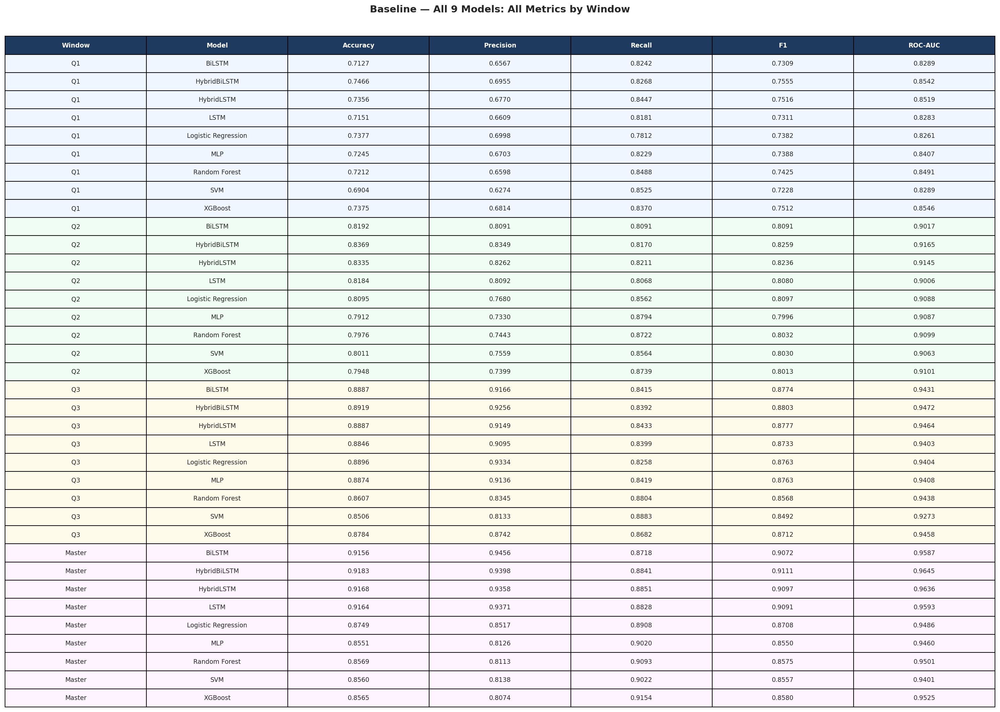

In [59]:
print("  S1-Fig1: Metrics table — all 9 models")
df_s1 = pd.concat([df_base, df_lstm, df_hybrid], ignore_index=True)
fig, ax = plt.subplots(figsize=(20, 14))
ax.axis("off")
tbl_data = df_s1.sort_values(["Window","Model"])[cols_show].copy()
for c in METRICS: tbl_data[c] = tbl_data[c].map(lambda v: f"{v:.4f}")
tbl = ax.table(cellText=tbl_data.values, colLabels=cols_show,
               cellLoc="center", loc="center", bbox=[0,0,1,1])
tbl.auto_set_font_size(False); tbl.set_fontsize(9)
for j in range(len(cols_show)):
    tbl[0,j].set_facecolor("#1E3A5F")
    tbl[0,j].set_text_props(color="white", fontweight="bold")
for i, row in enumerate(tbl_data.itertuples(), 1):
    bg = win_bg.get(row.Window, "white")
    for j in range(len(cols_show)): tbl[i,j].set_facecolor(bg)
fig.suptitle("Baseline — All 9 Models: All Metrics by Window",
             fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout(); plt.show()

### Fig 2 — F1 Grouped Bar per Window

  S1-Fig2: F1 grouped bar — all 9 models, 2 windows per row


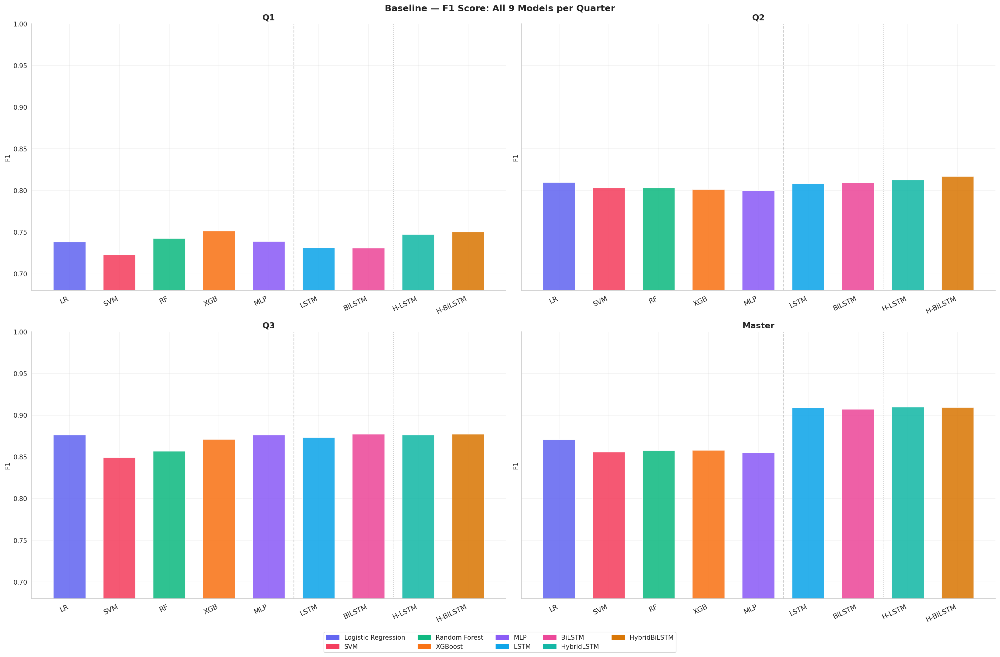

In [60]:
print("  S1-Fig2: F1 grouped bar — all 9 models, 2 windows per row")
line_styles = {"Logistic Regression":"-","SVM":"-","Random Forest":"-",
               "XGBoost":"-","MLP":"-","LSTM":"--","BiLSTM":"--",
               "HybridLSTM":":","HybridBiLSTM":":"}
markers = {"Logistic Regression":"o","SVM":"o","Random Forest":"o",
           "XGBoost":"o","MLP":"o","LSTM":"s","BiLSTM":"s",
           "HybridLSTM":"^","HybridBiLSTM":"^"}
fig, axes = plt.subplots(2, 2, figsize=(22, 14), sharey=True)
axes = axes.flatten()
fig.suptitle("Baseline — F1 Score: All 9 Models per Quarter",
             fontsize=14, fontweight="bold")
for ax, window in zip(axes, WINDOWS):
    vals = [get_val_sec(1, window, m, "F1") for m in MODELS]
    ax.bar(x_all, vals, color=colors_all, alpha=0.87, edgecolor="white", width=0.65)
    ax.set_xticks(x_all)
    ax.set_xticklabels([MODEL_SHORT[m] for m in MODELS], fontsize=11, rotation=25, ha="right")
    ax.set_title(window, fontsize=13, fontweight="bold")
    ax.set_ylabel("F1"); fmt_ax(ax, (0.68, 1.0))
    ax.axvline(4.5, color="gray", lw=1.2, linestyle="--", alpha=0.4)
    ax.axvline(6.5, color="gray", lw=1.2, linestyle=":", alpha=0.4)
fig.legend(handles=[mpatches.Patch(color=MODEL_COLORS[m], label=m) for m in MODELS],
           loc="lower center", ncol=5, fontsize=10, bbox_to_anchor=(0.5, -0.04))
plt.tight_layout(); plt.show()

### Fig 2b — Accuracy Grouped Bar per Window

  S1-Fig2b: Accuracy grouped bar — all 9 models, 2 windows per row


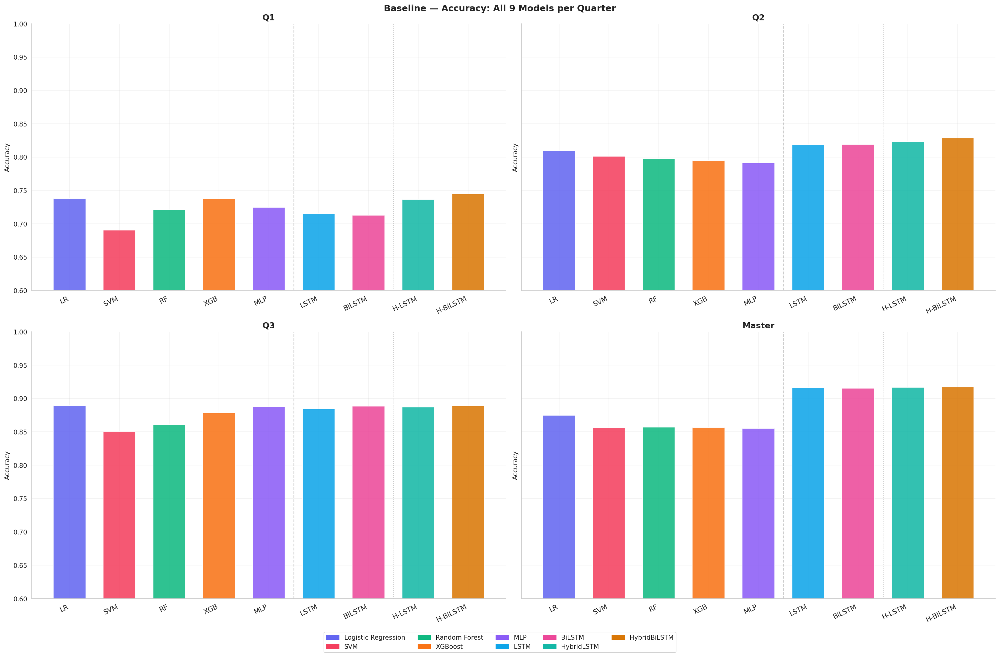

In [61]:
print("  S1-Fig2b: Accuracy grouped bar — all 9 models, 2 windows per row")
fig, axes = plt.subplots(2, 2, figsize=(22, 14), sharey=True)
axes = axes.flatten()
fig.suptitle("Baseline — Accuracy: All 9 Models per Quarter",
             fontsize=14, fontweight="bold")
for ax, window in zip(axes, WINDOWS):
    vals = [get_val_sec(1, window, m, "Accuracy") for m in MODELS]
    ax.bar(x_all, vals, color=colors_all, alpha=0.87, edgecolor="white", width=0.65)
    ax.set_xticks(x_all)
    ax.set_xticklabels([MODEL_SHORT[m] for m in MODELS], fontsize=11, rotation=25, ha="right")
    ax.set_title(window, fontsize=13, fontweight="bold")
    ax.set_ylabel("Accuracy"); fmt_ax(ax, (0.60, 1.0))
    ax.axvline(4.5, color="gray", lw=1.2, linestyle="--", alpha=0.4)
    ax.axvline(6.5, color="gray", lw=1.2, linestyle=":", alpha=0.4)
fig.legend(handles=[mpatches.Patch(color=MODEL_COLORS[m], label=m) for m in MODELS],
           loc="lower center", ncol=5, fontsize=10, bbox_to_anchor=(0.5, -0.04))
plt.tight_layout(); plt.show()

### Fig 3 — ROC-AUC Grouped Bar per Window

  S1-Fig3: ROC-AUC grouped bar — all 9 models, 2 windows per row


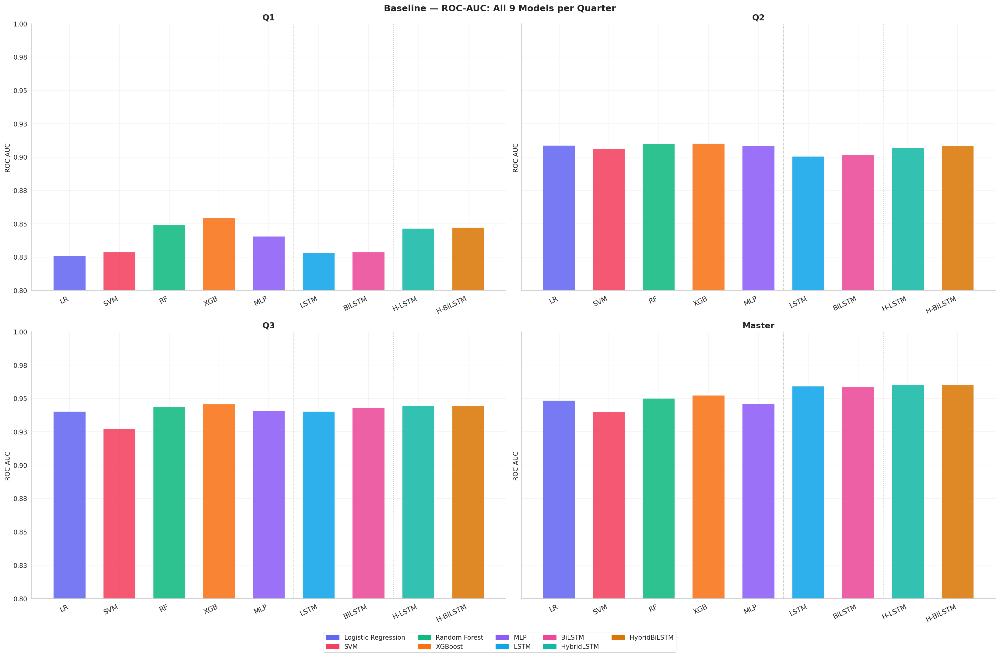

In [62]:
print("  S1-Fig3: ROC-AUC grouped bar — all 9 models, 2 windows per row")
fig, axes = plt.subplots(2, 2, figsize=(22, 14), sharey=True)
axes = axes.flatten()
fig.suptitle("Baseline — ROC-AUC: All 9 Models per Quarter",
             fontsize=14, fontweight="bold")
for ax, window in zip(axes, WINDOWS):
    vals = [get_val_sec(1, window, m, "ROC-AUC") for m in MODELS]
    ax.bar(x_all, vals, color=colors_all, alpha=0.87, edgecolor="white", width=0.65)
    ax.set_xticks(x_all)
    ax.set_xticklabels([MODEL_SHORT[m] for m in MODELS], fontsize=11, rotation=25, ha="right")
    ax.set_title(window, fontsize=13, fontweight="bold")
    ax.set_ylabel("ROC-AUC"); fmt_ax(ax, (0.80, 1.0))
    ax.axvline(4.5, color="gray", lw=1.2, linestyle="--", alpha=0.4)
    ax.axvline(6.5, color="gray", lw=1.2, linestyle=":", alpha=0.4)
fig.legend(handles=[mpatches.Patch(color=MODEL_COLORS[m], label=m) for m in MODELS],
           loc="lower center", ncol=5, fontsize=10, bbox_to_anchor=(0.5, -0.04))
plt.tight_layout(); plt.show()

### Fig 4 — F1 & ROC-AUC Progression Across Quarters

  S1-Fig4: F1 & ROC-AUC progression across quarters


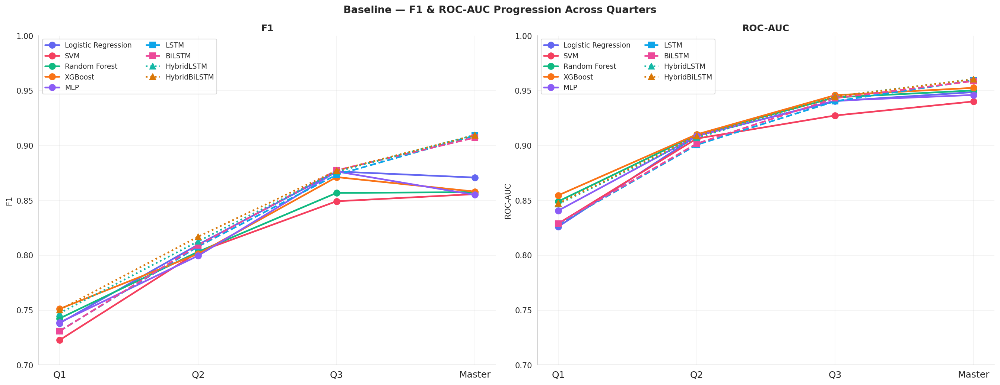

In [63]:
print("  S1-Fig4: F1 & ROC-AUC progression across quarters")
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle("Baseline — F1 & ROC-AUC Progression Across Quarters",
             fontsize=13, fontweight="bold")
for ax, metric in zip(axes, ["F1", "ROC-AUC"]):
    for model in MODELS:
        vals = [get_val_sec(1, w, model, metric) for w in WINDOWS]
        ax.plot(xpos, vals, color=MODEL_COLORS[model], marker=markers[model],
                lw=2.2, ms=8, linestyle=line_styles[model], label=model)
    ax.set_xticks(xpos); ax.set_xticklabels(WINDOWS, fontsize=12)
    ax.set_title(metric, fontsize=12, fontweight="bold"); ax.set_ylabel(metric)
    fmt_ax(ax, ylim=(0.70, 1.0))
    ax.legend(fontsize=9, loc="upper left", ncol=2)
plt.tight_layout(); plt.show()

### Fig 5 — ROC-AUC Heatmap

  S1-Fig5: ROC-AUC heatmap


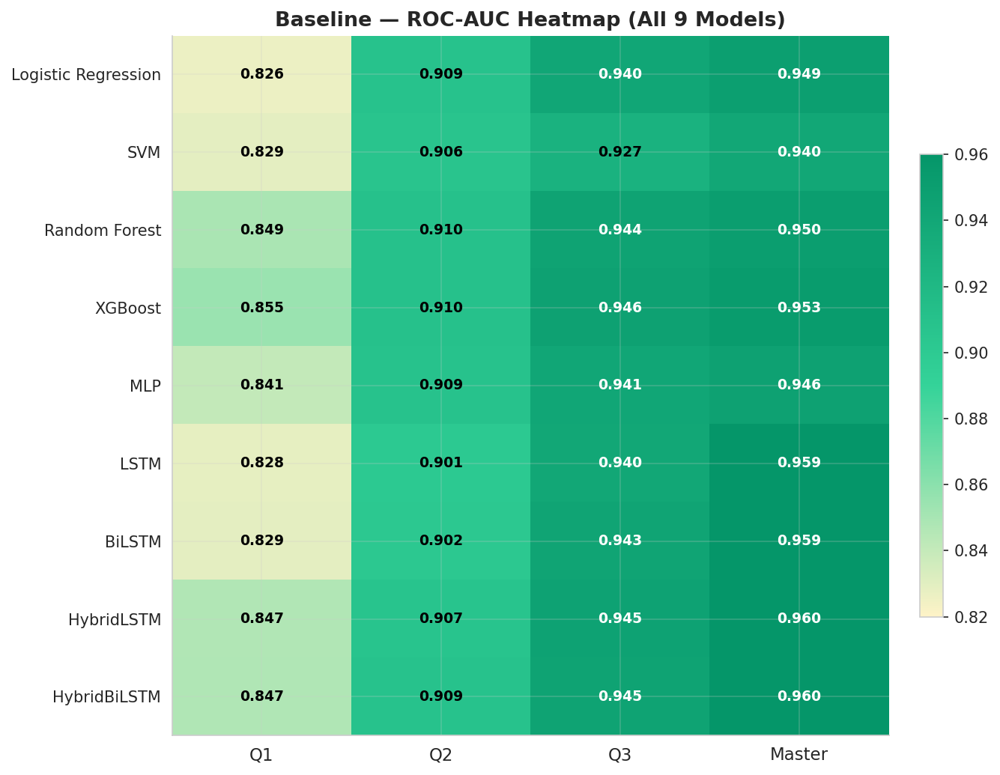

In [64]:
print("  S1-Fig5: ROC-AUC heatmap")
cmap_g = LinearSegmentedColormap.from_list("g", ["#FEF3C7","#34D399","#059669"])
heatmap_data = np.array([[get_val_sec(1,w,m,"ROC-AUC") for w in WINDOWS] for m in MODELS])
fig, ax = plt.subplots(figsize=(9, 7))
im = ax.imshow(heatmap_data, cmap=cmap_g, vmin=0.82, vmax=0.96, aspect="auto")
ax.set_xticks(range(len(WINDOWS))); ax.set_xticklabels(WINDOWS, fontsize=11)
ax.set_yticks(range(len(MODELS))); ax.set_yticklabels(MODELS, fontsize=10)
ax.set_title("Baseline — ROC-AUC Heatmap (All 9 Models)",
             fontsize=13, fontweight="bold")
for i in range(len(MODELS)):
    for j in range(len(WINDOWS)):
        v = heatmap_data[i,j]
        ax.text(j, i, f"{v:.3f}", ha="center", va="center", fontsize=9,
                fontweight="bold", color="white" if v > 0.93 else "black")
plt.colorbar(im, ax=ax, fraction=0.03, pad=0.04)
plt.tight_layout(); plt.show()

### Fig 6 — Confusion Matrices

  S1-Fig6: Confusion matrices


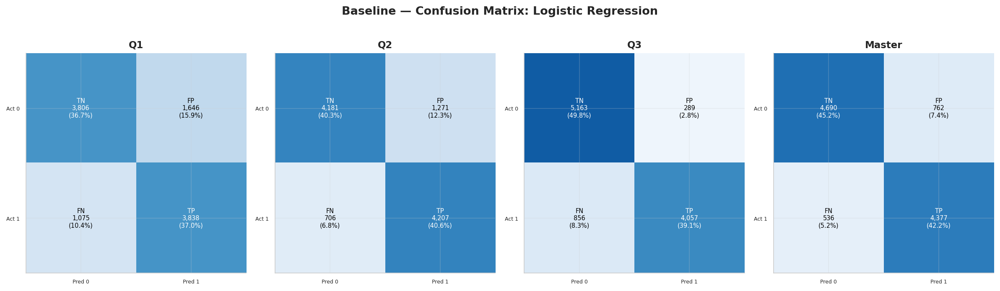

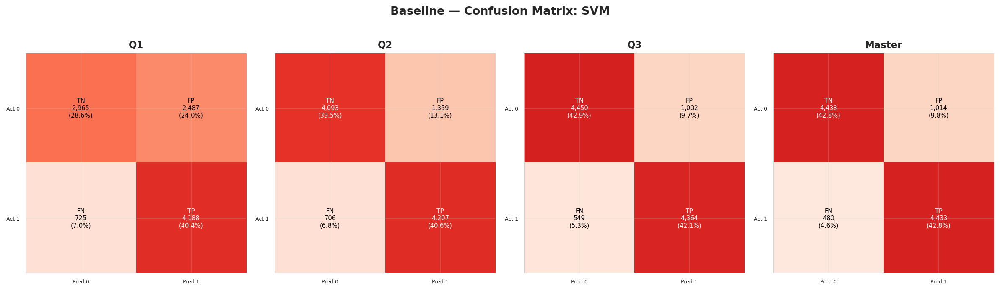

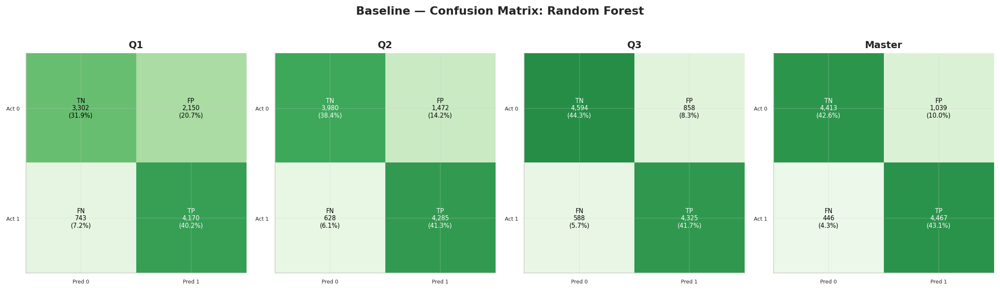

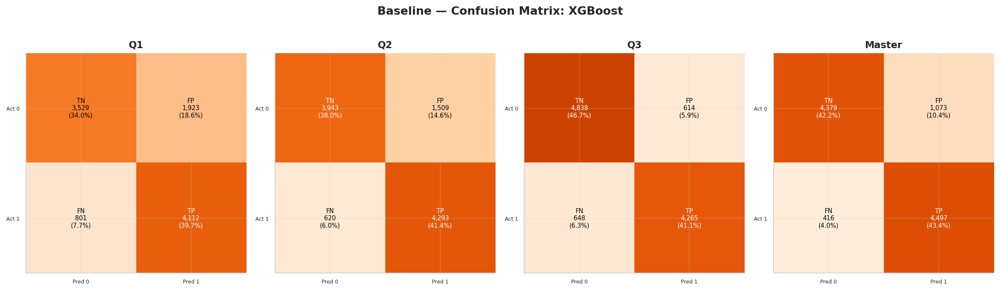

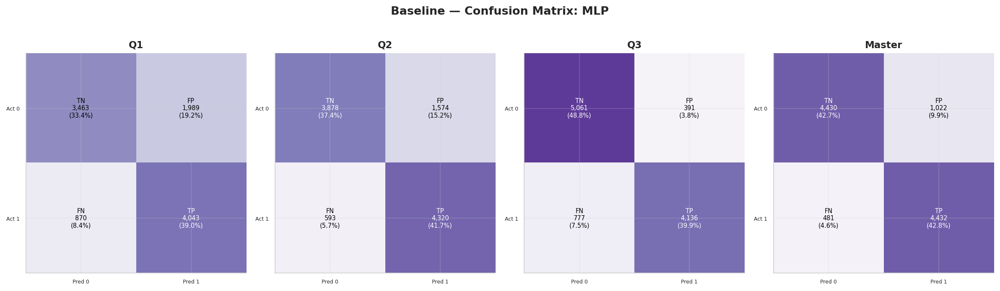

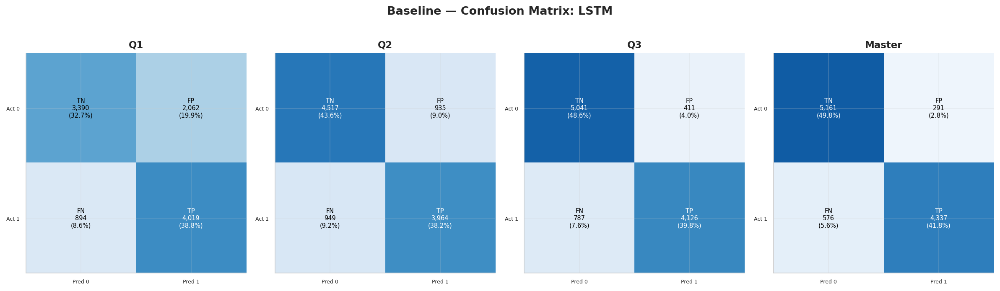

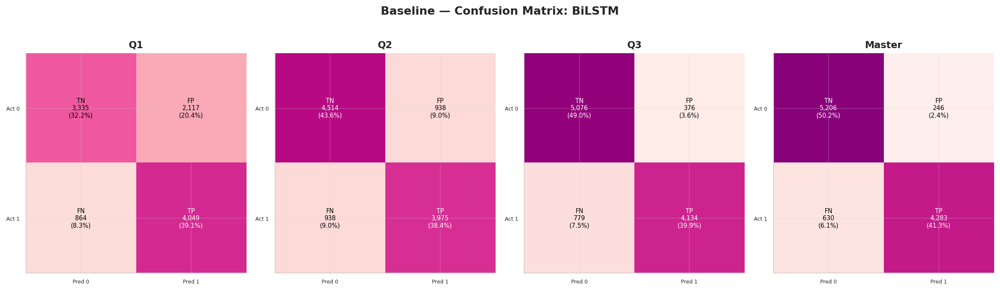

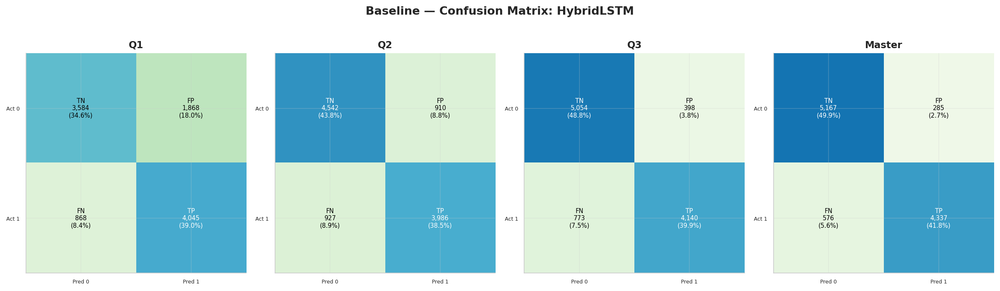

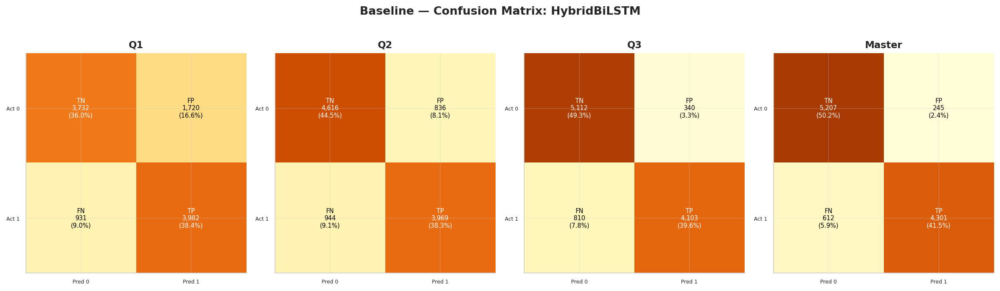

In [65]:
print("  S1-Fig6: Confusion matrices")

cmap_per_model = {
    "Logistic Regression": "Blues",
    "SVM":                 "Reds",
    "Random Forest":       "Greens",
    "XGBoost":             "Oranges",
    "MLP":                 "Purples",
    "LSTM":                "Blues",
    "BiLSTM":              "RdPu",
    "HybridLSTM":          "GnBu",
    "HybridBiLSTM":        "YlOrBr",
}

ALL_MODELS = list(cmap_per_model.keys())

for model in ALL_MODELS:
    n_windows = len(WINDOWS)
    fig, axes_cm = plt.subplots(1, n_windows, figsize=(n_windows * 4, 4.5),
                                squeeze=False)
    fig.suptitle(f"Baseline — Confusion Matrix: {model}",
                 fontsize=13, fontweight="bold", y=1.02)

    for c, window in enumerate(WINDOWS):
        ax = axes_cm[0, c]
        draw_cm(ax,
                get_val_sec(1, window, model, "Accuracy"),
                get_val_sec(1, window, model, "Precision"),
                get_val_sec(1, window, model, "Recall"),
                cmap_per_model[model])
        ax.set_title(window, fontsize=11, fontweight="bold")

    plt.tight_layout()
    plt.show()

### Fig 7 — Radar Charts per Window

  S1-Fig7: Radar charts per window


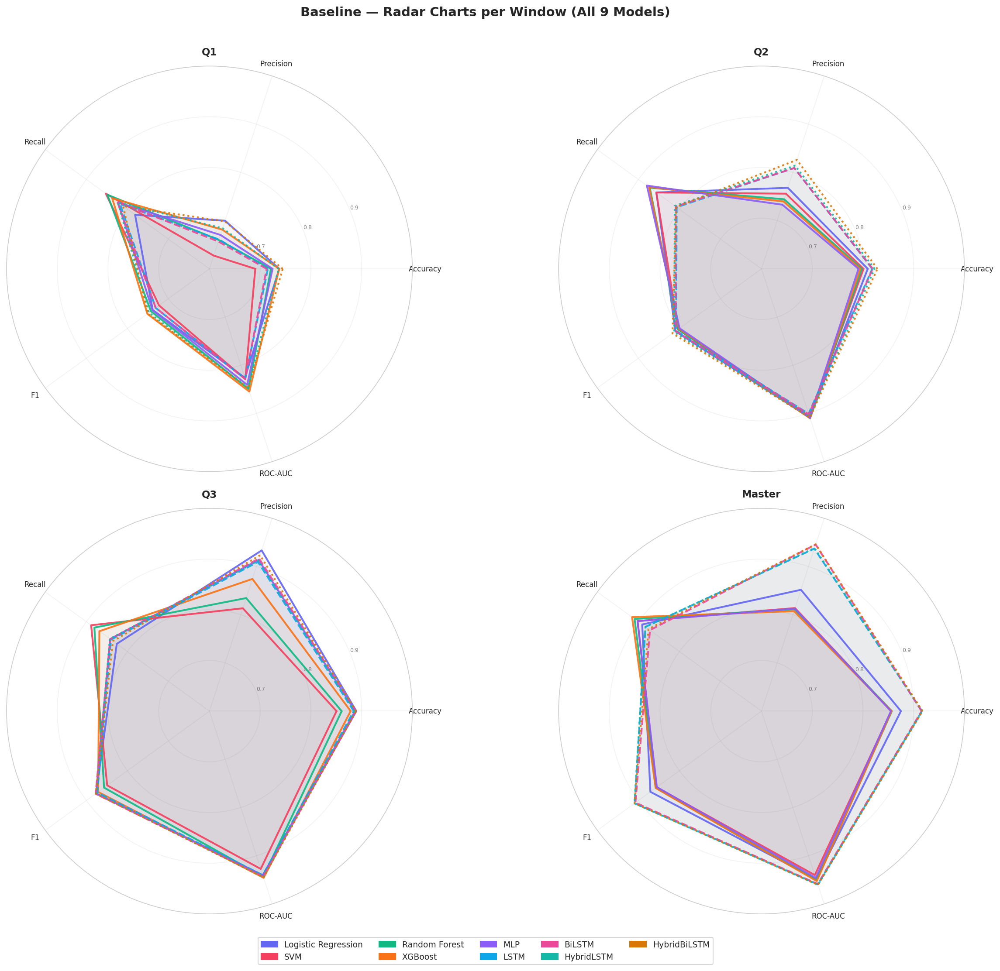

  Section 1 complete.



In [66]:
print("  S1-Fig7: Radar charts per window")
fig, axes_r = plt.subplots(2, 2, figsize=(18, 14), subplot_kw=dict(polar=True))
axes_r = axes_r.flatten()
fig.suptitle("Baseline — Radar Charts per Window (All 9 Models)",
             fontsize=14, fontweight="bold", y=1.01)
for ax, window in zip(axes_r, WINDOWS):
    for model in MODELS:
        vals = [get_val_sec(1,window,model,m) for m in rad_metrics] + \
               [get_val_sec(1,window,model,rad_metrics[0])]
        ax.plot(angles, vals, color=MODEL_COLORS[model], lw=2,
                linestyle=line_styles[model], alpha=0.9)
        ax.fill(angles, vals, color=MODEL_COLORS[model], alpha=0.04)
    ax.set_xticks(angles[:-1]); ax.set_xticklabels(rad_metrics, fontsize=8)
    ax.set_ylim(0.60, 1.0); ax.set_yticks([0.7,0.8,0.9])
    ax.set_yticklabels(["0.7","0.8","0.9"], fontsize=6, color="gray")
    ax.set_title(window, fontsize=11, fontweight="bold", pad=12)
fig.legend(handles=[mpatches.Patch(color=MODEL_COLORS[m], label=m) for m in MODELS],
           loc="lower center", ncol=5, fontsize=9, bbox_to_anchor=(0.5,-0.04))
plt.tight_layout(); plt.show()
print("  Section 1 complete.\n")


## Section 2 — Tuned Cluster-Aware Models

### Fig 1 — Metrics Summary Table

  S2-Fig1: Metrics table — all 9 models


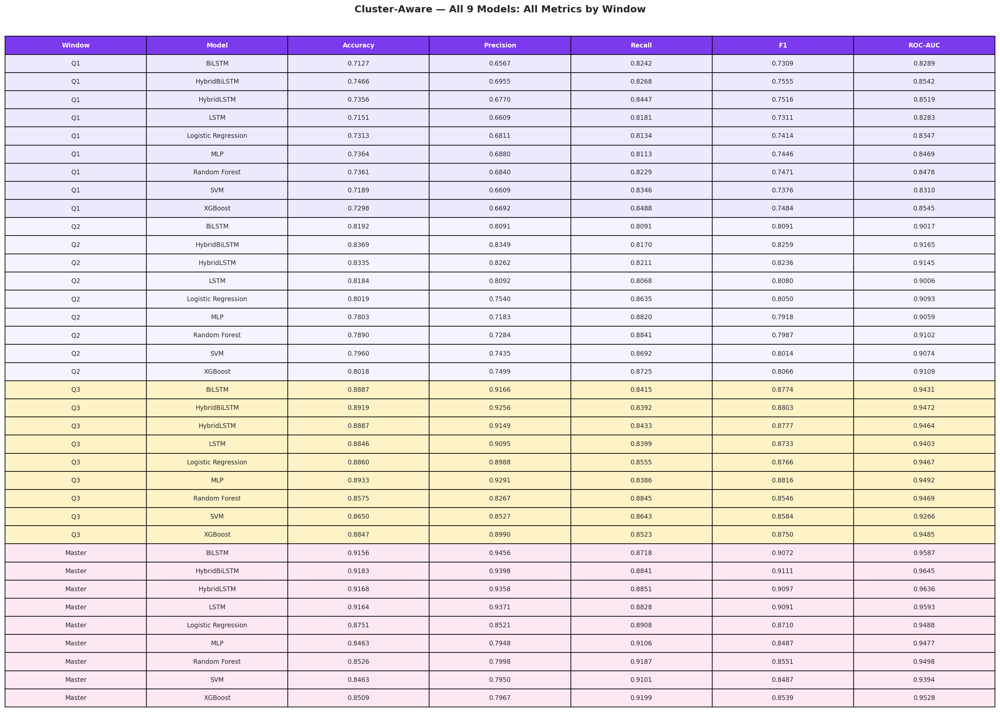

In [67]:
print("  S2-Fig1: Metrics table — all 9 models")
df_s2 = pd.concat([df_clus, df_lstm, df_hybrid], ignore_index=True)
fig, ax = plt.subplots(figsize=(20, 14))
ax.axis("off")
tbl_data = df_s2.sort_values(["Window","Model"])[cols_show].copy()
for c in METRICS: tbl_data[c] = tbl_data[c].map(lambda v: f"{v:.4f}")
tbl = ax.table(cellText=tbl_data.values, colLabels=cols_show,
               cellLoc="center", loc="center", bbox=[0,0,1,1])
tbl.auto_set_font_size(False); tbl.set_fontsize(9)
win_bg2 = {"Q1":"#EDE9FE","Q2":"#F5F3FF","Q3":"#FEF3C7","Master":"#FCE7F3"}
for j in range(len(cols_show)):
    tbl[0,j].set_facecolor("#7C3AED")
    tbl[0,j].set_text_props(color="white", fontweight="bold")
for i, row in enumerate(tbl_data.itertuples(), 1):
    bg = win_bg2.get(row.Window, "white")
    for j in range(len(cols_show)): tbl[i,j].set_facecolor(bg)
fig.suptitle("Cluster-Aware — All 9 Models: All Metrics by Window",
             fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout(); plt.show()

### Fig 2 — F1 Score

  S2-Fig2: F1 grouped bar — all 9 models, 2 windows per row


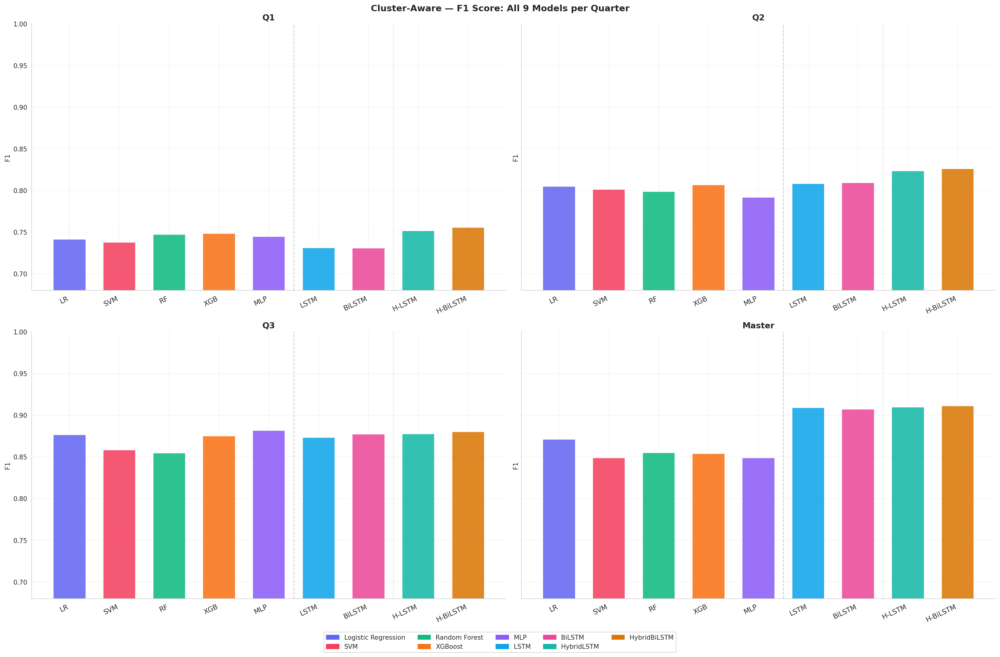

In [68]:
print("  S2-Fig2: F1 grouped bar — all 9 models, 2 windows per row")
fig, axes = plt.subplots(2, 2, figsize=(22, 14), sharey=True)
axes = axes.flatten()
fig.suptitle("Cluster-Aware — F1 Score: All 9 Models per Quarter",
             fontsize=14, fontweight="bold")
for ax, window in zip(axes, WINDOWS):
    vals = [get_val_sec(2, window, m, "F1") for m in MODELS]
    ax.bar(x_all, vals, color=colors_all, alpha=0.87, edgecolor="white", width=0.65)
    ax.set_xticks(x_all)
    ax.set_xticklabels([MODEL_SHORT[m] for m in MODELS], fontsize=11, rotation=25, ha="right")
    ax.set_title(window, fontsize=13, fontweight="bold")
    ax.set_ylabel("F1"); fmt_ax(ax, (0.68, 1.0))
    ax.axvline(4.5, color="gray", lw=1.2, linestyle="--", alpha=0.4)
    ax.axvline(6.5, color="gray", lw=1.2, linestyle=":", alpha=0.4)
fig.legend(handles=[mpatches.Patch(color=MODEL_COLORS[m], label=m) for m in MODELS],
           loc="lower center", ncol=5, fontsize=10, bbox_to_anchor=(0.5, -0.04))
plt.tight_layout(); plt.show()

### Fig 2b — Accuracy Grouped Bar per Window

  S2-Fig2b: Accuracy grouped bar — all 9 models, 2 windows per row


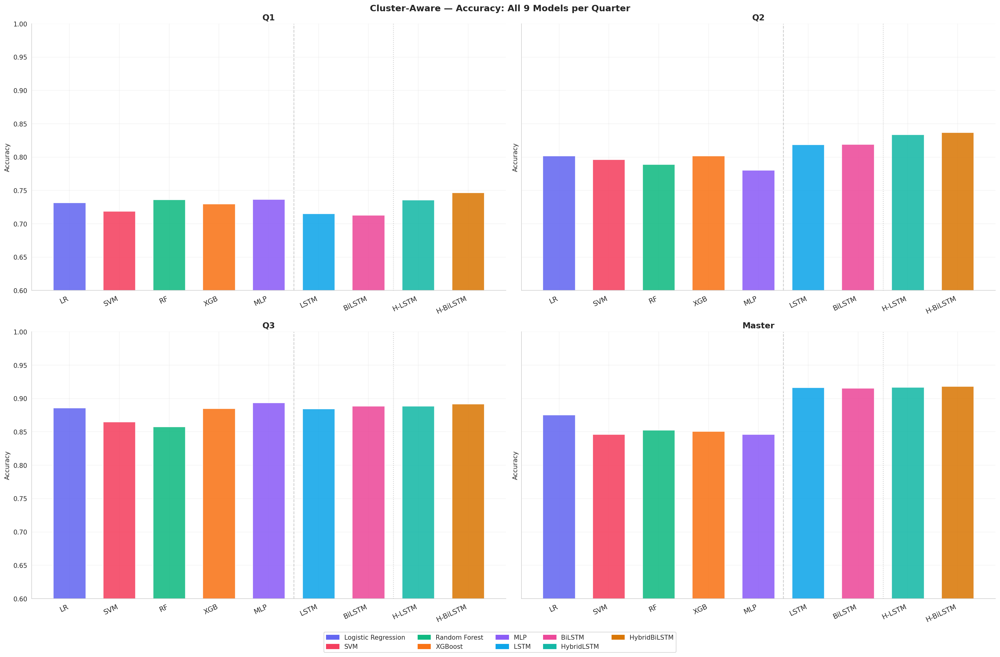

In [69]:
print("  S2-Fig2b: Accuracy grouped bar — all 9 models, 2 windows per row")
fig, axes = plt.subplots(2, 2, figsize=(22, 14), sharey=True)
axes = axes.flatten()
fig.suptitle("Cluster-Aware — Accuracy: All 9 Models per Quarter",
             fontsize=14, fontweight="bold")
for ax, window in zip(axes, WINDOWS):
    vals = [get_val_sec(2, window, m, "Accuracy") for m in MODELS]
    ax.bar(x_all, vals, color=colors_all, alpha=0.87, edgecolor="white", width=0.65)
    ax.set_xticks(x_all)
    ax.set_xticklabels([MODEL_SHORT[m] for m in MODELS], fontsize=11, rotation=25, ha="right")
    ax.set_title(window, fontsize=13, fontweight="bold")
    ax.set_ylabel("Accuracy"); fmt_ax(ax, (0.60, 1.0))
    ax.axvline(4.5, color="gray", lw=1.2, linestyle="--", alpha=0.4)
    ax.axvline(6.5, color="gray", lw=1.2, linestyle=":", alpha=0.4)
fig.legend(handles=[mpatches.Patch(color=MODEL_COLORS[m], label=m) for m in MODELS],
           loc="lower center", ncol=5, fontsize=10, bbox_to_anchor=(0.5, -0.04))
plt.tight_layout(); plt.show()

### Fig 3 — ROC-AUC

  S2-Fig3: ROC-AUC grouped bar — all 9 models, 2 windows per row


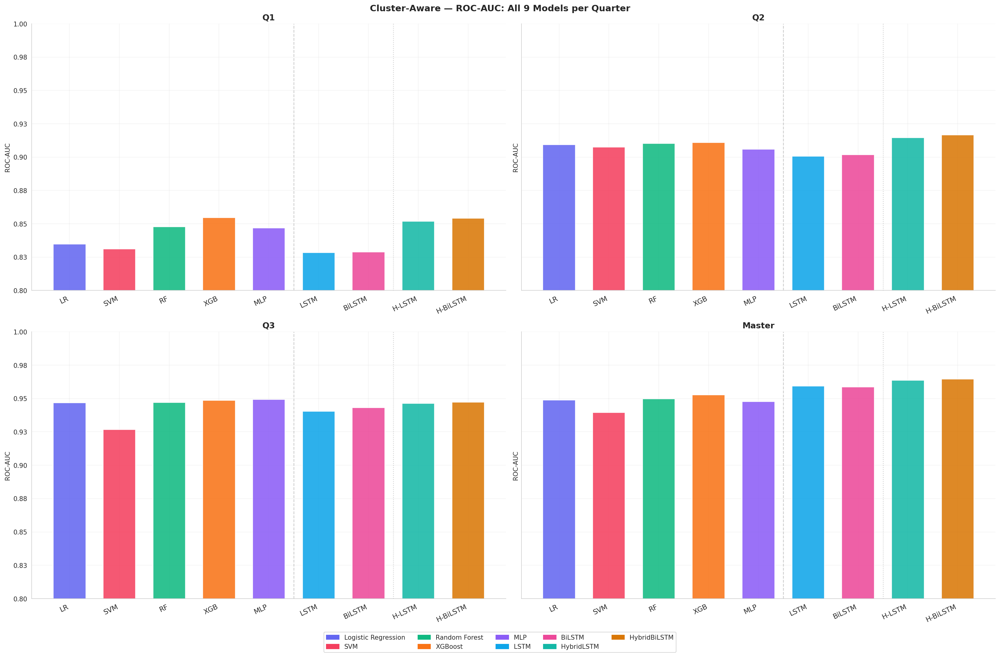

In [70]:
print("  S2-Fig3: ROC-AUC grouped bar — all 9 models, 2 windows per row")
fig, axes = plt.subplots(2, 2, figsize=(22, 14), sharey=True)
axes = axes.flatten()
fig.suptitle("Cluster-Aware — ROC-AUC: All 9 Models per Quarter",
             fontsize=14, fontweight="bold")
for ax, window in zip(axes, WINDOWS):
    vals = [get_val_sec(2, window, m, "ROC-AUC") for m in MODELS]
    ax.bar(x_all, vals, color=colors_all, alpha=0.87, edgecolor="white", width=0.65)
    ax.set_xticks(x_all)
    ax.set_xticklabels([MODEL_SHORT[m] for m in MODELS], fontsize=11, rotation=25, ha="right")
    ax.set_title(window, fontsize=13, fontweight="bold")
    ax.set_ylabel("ROC-AUC"); fmt_ax(ax, (0.80, 1.0))
    ax.axvline(4.5, color="gray", lw=1.2, linestyle="--", alpha=0.4)
    ax.axvline(6.5, color="gray", lw=1.2, linestyle=":", alpha=0.4)
fig.legend(handles=[mpatches.Patch(color=MODEL_COLORS[m], label=m) for m in MODELS],
           loc="lower center", ncol=5, fontsize=10, bbox_to_anchor=(0.5, -0.04))
plt.tight_layout(); plt.show()

### Fig 4 — Progression Line Chart

  S2-Fig4: F1 & ROC-AUC progression across quarters


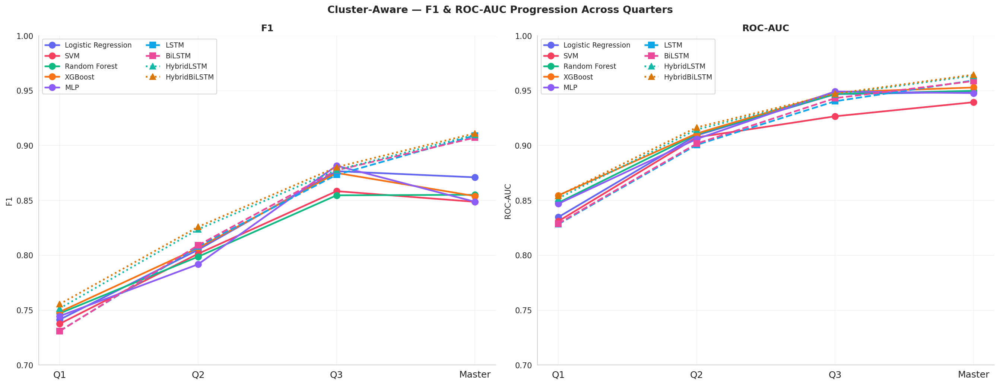

In [71]:
print("  S2-Fig4: F1 & ROC-AUC progression across quarters")
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle("Cluster-Aware — F1 & ROC-AUC Progression Across Quarters",
             fontsize=13, fontweight="bold")
for ax, metric in zip(axes, ["F1", "ROC-AUC"]):
    for model in MODELS:
        vals = [get_val_sec(2, w, model, metric) for w in WINDOWS]
        ax.plot(xpos, vals, color=MODEL_COLORS[model], marker=markers[model],
                lw=2.2, ms=8, linestyle=line_styles[model], label=model)
    ax.set_xticks(xpos); ax.set_xticklabels(WINDOWS, fontsize=12)
    ax.set_title(metric, fontsize=12, fontweight="bold"); ax.set_ylabel(metric)
    fmt_ax(ax, ylim=(0.70, 1.0))
    ax.legend(fontsize=9, loc="upper left", ncol=2)
plt.tight_layout(); plt.show()

### Fig 5 — ROC-AUC Heatmap

  S2-Fig5: ROC-AUC heatmap


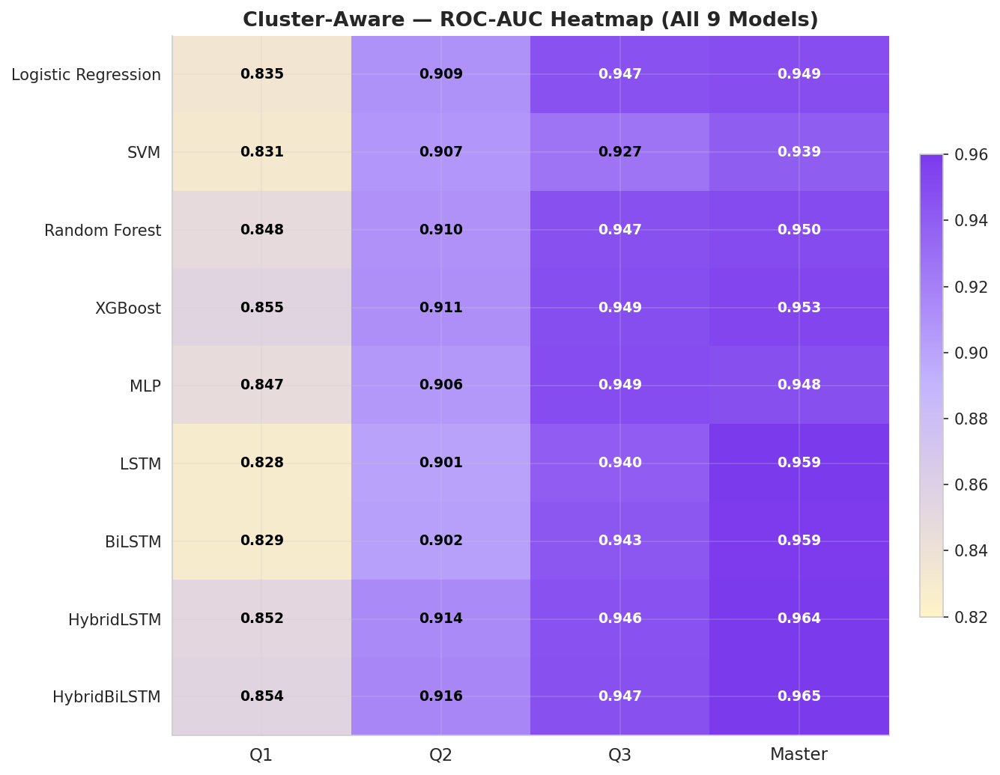

In [72]:
print("  S2-Fig5: ROC-AUC heatmap")
cmap_p = LinearSegmentedColormap.from_list("p", ["#FEF3C7","#C4B5FD","#7C3AED"])
heatmap_data2 = np.array([[get_val_sec(2,w,m,"ROC-AUC") for w in WINDOWS] for m in MODELS])
fig, ax = plt.subplots(figsize=(9, 7))
im = ax.imshow(heatmap_data2, cmap=cmap_p, vmin=0.82, vmax=0.96, aspect="auto")
ax.set_xticks(range(len(WINDOWS))); ax.set_xticklabels(WINDOWS, fontsize=11)
ax.set_yticks(range(len(MODELS))); ax.set_yticklabels(MODELS, fontsize=10)
ax.set_title("Cluster-Aware — ROC-AUC Heatmap (All 9 Models)",
             fontsize=13, fontweight="bold")
for i in range(len(MODELS)):
    for j in range(len(WINDOWS)):
        v = heatmap_data2[i,j]
        ax.text(j, i, f"{v:.3f}", ha="center", va="center", fontsize=9,
                fontweight="bold", color="white" if v > 0.93 else "black")
plt.colorbar(im, ax=ax, fraction=0.03, pad=0.04)
plt.tight_layout(); plt.show()

### Fig 6 — Confusion Matrices

In [73]:
df_hybrid["Model"] = df_hybrid["Model"].str.replace("_CAF", "", regex=False).str.strip()

  S2-Fig6: Confusion matrices


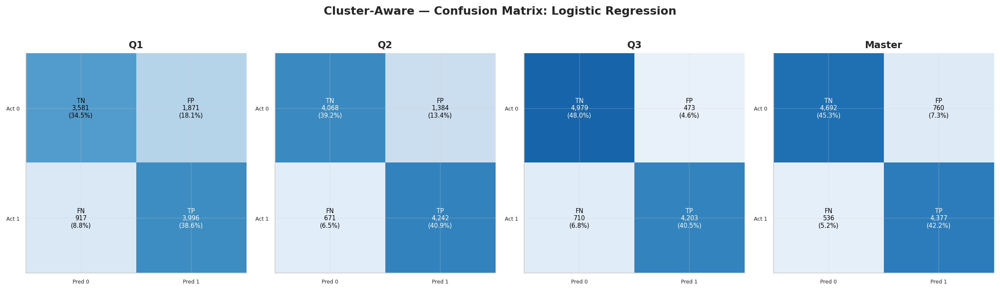

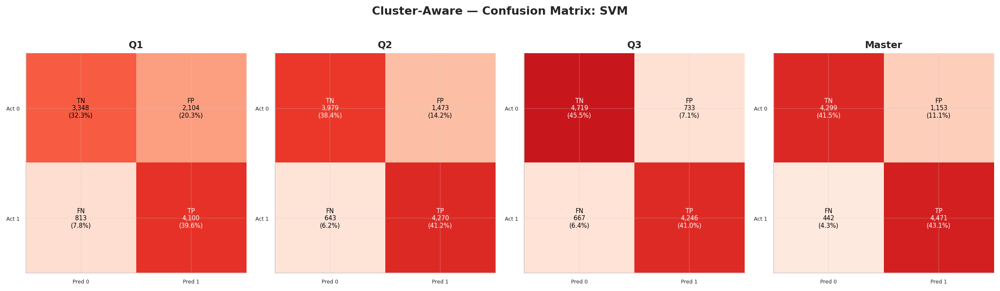

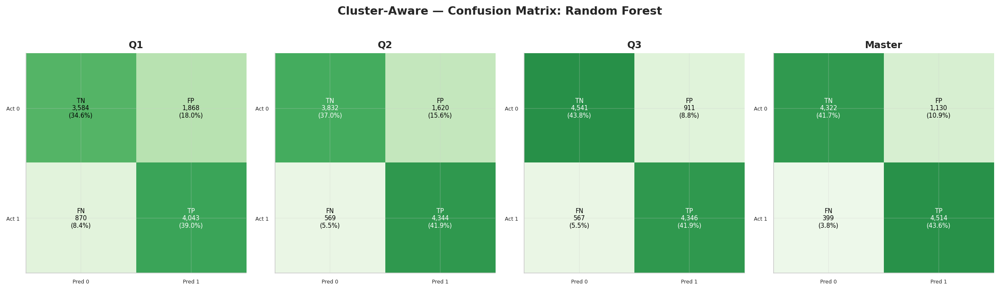

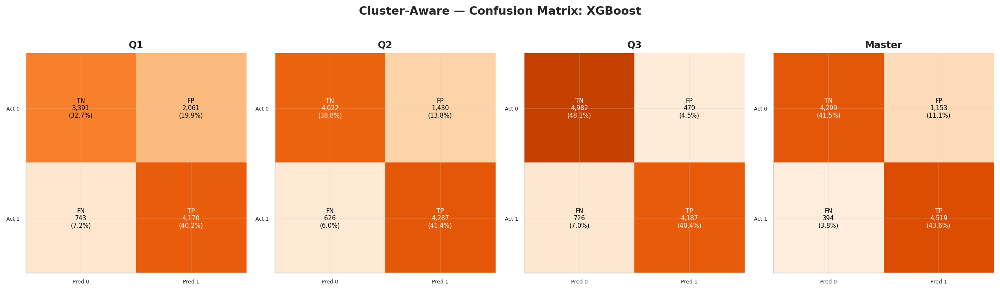

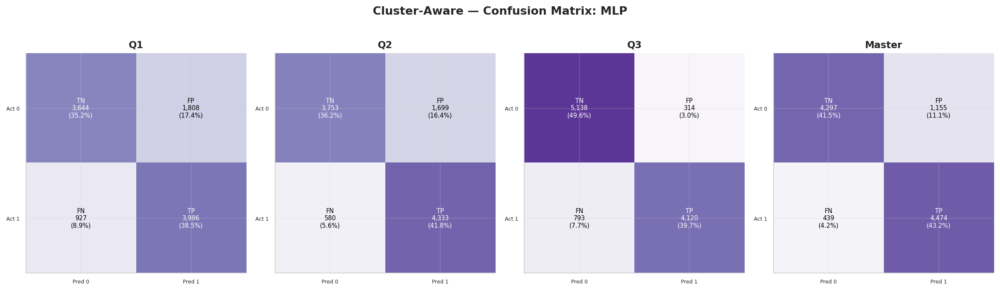

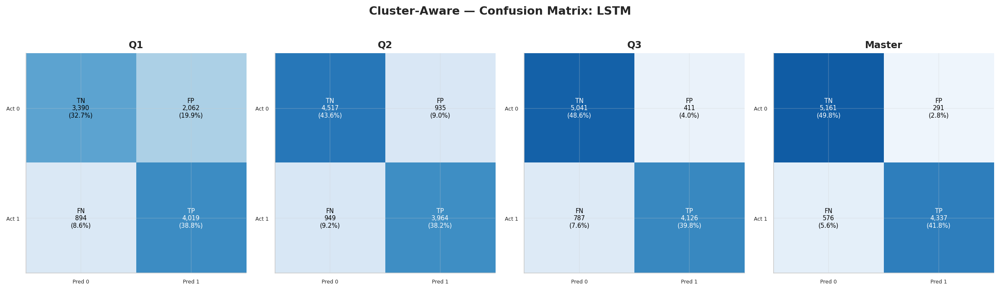

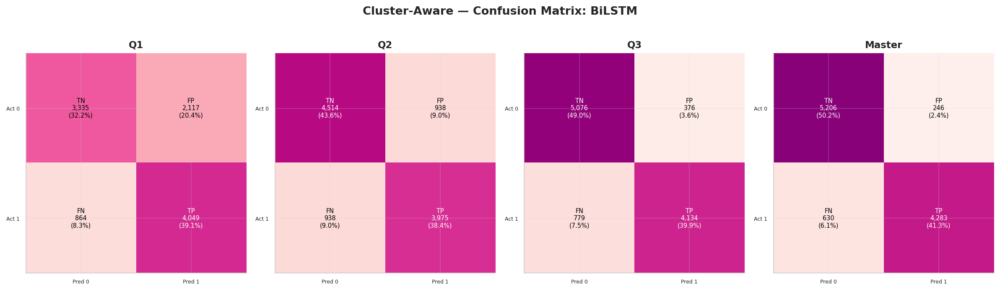

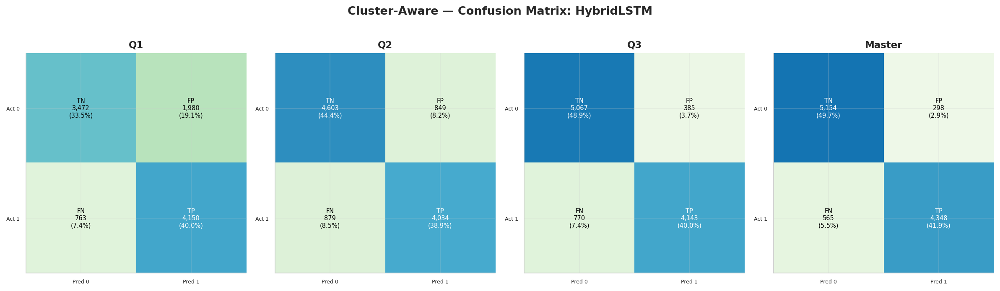

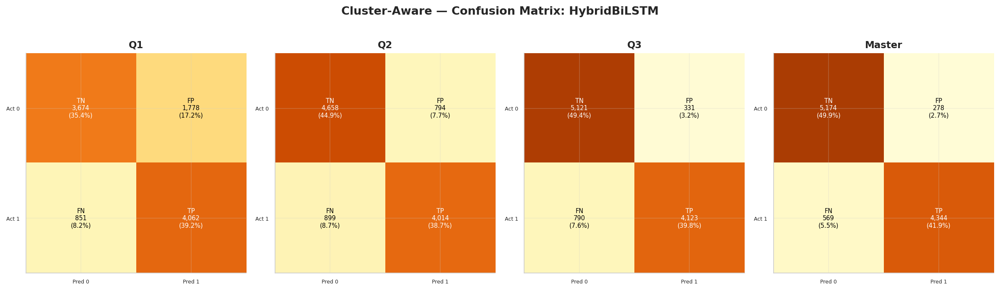

In [74]:
print("  S2-Fig6: Confusion matrices")

for model in ALL_MODELS:
    n_windows = len(WINDOWS)
    fig, axes_cm = plt.subplots(1, n_windows, figsize=(n_windows * 4, 4.5),
                                squeeze=False)
    fig.suptitle(f"Cluster-Aware — Confusion Matrix: {model}",
                 fontsize=13, fontweight="bold", y=1.02)

    for c, window in enumerate(WINDOWS):
        ax = axes_cm[0, c]
        draw_cm(ax,
                get_val_sec(2, window, model, "Accuracy"),
                get_val_sec(2, window, model, "Precision"),
                get_val_sec(2, window, model, "Recall"),
                cmap_per_model[model])
        ax.set_title(window, fontsize=11, fontweight="bold")

    plt.tight_layout()
    plt.show()

### Fig 7 — Radar Charts

  S2-Fig7: Radar charts per window


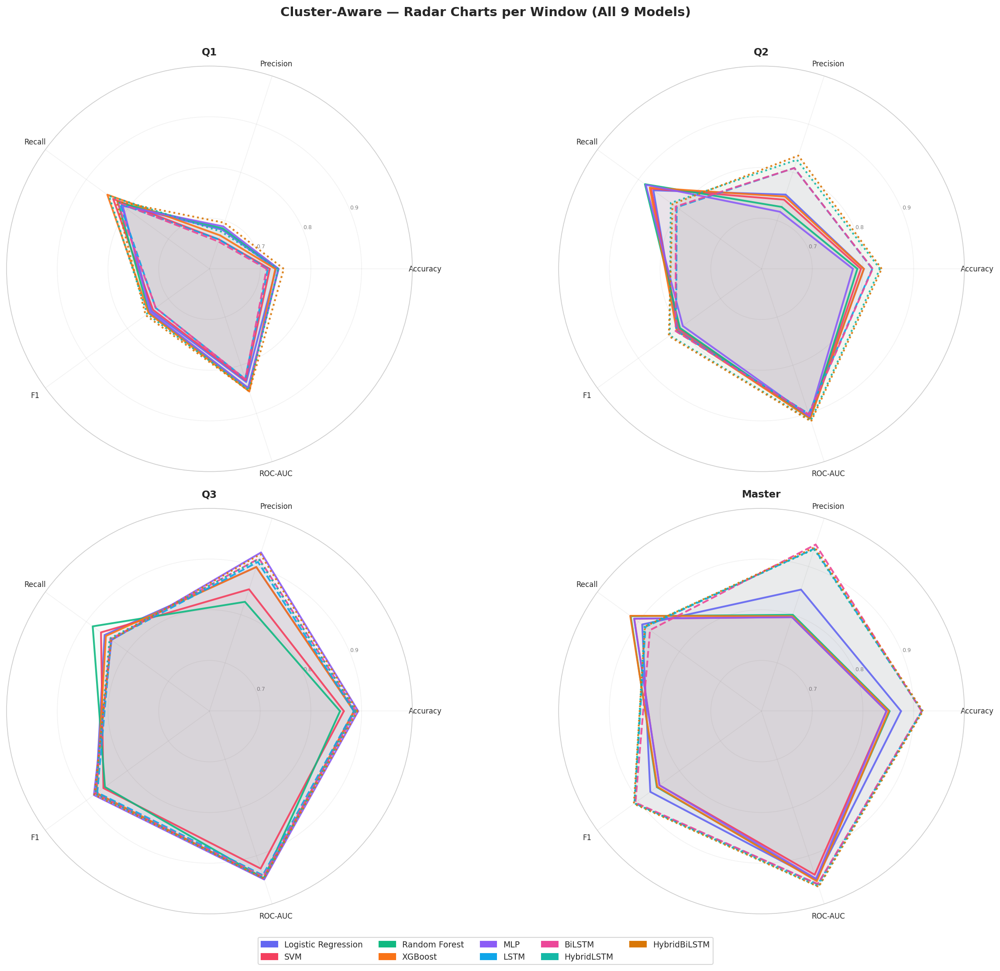

  Section 2 complete.



In [75]:
print("  S2-Fig7: Radar charts per window")
fig, axes_r = plt.subplots(2, 2, figsize=(18, 14), subplot_kw=dict(polar=True))
axes_r = axes_r.flatten()
fig.suptitle("Cluster-Aware — Radar Charts per Window (All 9 Models)",
             fontsize=14, fontweight="bold", y=1.01)
for ax, window in zip(axes_r, WINDOWS):
    for model in MODELS:
        vals = [get_val_sec(2,window,model,m) for m in rad_metrics] + \
               [get_val_sec(2,window,model,rad_metrics[0])]
        ax.plot(angles, vals, color=MODEL_COLORS[model], lw=2,
                linestyle=line_styles[model], alpha=0.9)
        ax.fill(angles, vals, color=MODEL_COLORS[model], alpha=0.04)
    ax.set_xticks(angles[:-1]); ax.set_xticklabels(rad_metrics, fontsize=8)
    ax.set_ylim(0.60, 1.0); ax.set_yticks([0.7,0.8,0.9])
    ax.set_yticklabels(["0.7","0.8","0.9"], fontsize=6, color="gray")
    ax.set_title(window, fontsize=11, fontweight="bold", pad=12)
fig.legend(handles=[mpatches.Patch(color=MODEL_COLORS[m], label=m) for m in MODELS],
           loc="lower center", ncol=5, fontsize=9, bbox_to_anchor=(0.5,-0.04))
plt.tight_layout(); plt.show()
print("  Section 2 complete.\n")

## Section 3 — Baseline vs Cluster-Aware


### Fig 1 — F1: Baseline vs Cluster-Aware

  S3-Fig1: F1 side-by-side comparison


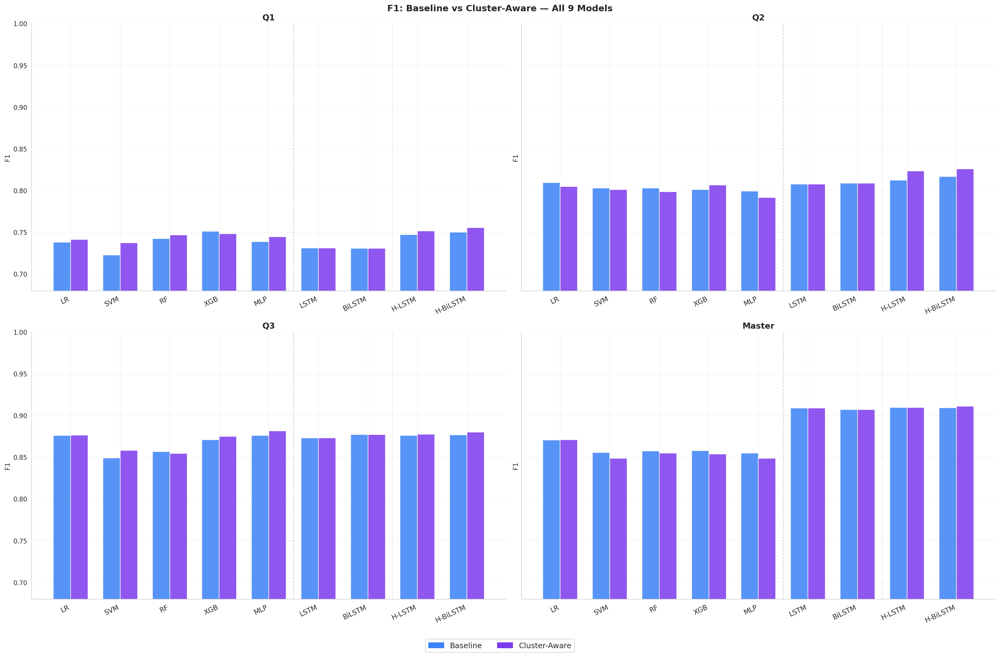

In [76]:
print("  S3-Fig1: F1 side-by-side comparison")
width2 = 0.35
patches_bc = [mpatches.Patch(color=BASE_COL, label="Baseline"),
              mpatches.Patch(color=CLUS_COL, label="Cluster-Aware")]
fig, axes = plt.subplots(2, 2, figsize=(22, 14), sharey=True)
axes = axes.flatten()
fig.suptitle("F1: Baseline vs Cluster-Aware — All 9 Models",
             fontsize=14, fontweight="bold")
for ax, window in zip(axes, WINDOWS):
    b_vals = [get_val_sec(1, window, m, "F1") for m in MODELS]
    c_vals = [get_val_sec(2, window, m, "F1") for m in MODELS]
    ax.bar(x_all - width2/2, b_vals, width2, color=BASE_COL,  alpha=0.85, edgecolor="white")
    ax.bar(x_all + width2/2, c_vals, width2, color=CLUS_COL, alpha=0.85, edgecolor="white")
    ax.set_xticks(x_all)
    ax.set_xticklabels([MODEL_SHORT[m] for m in MODELS], fontsize=11, rotation=25, ha="right")
    ax.set_title(window, fontsize=13, fontweight="bold")
    ax.set_ylabel("F1"); fmt_ax(ax, (0.68, 1.0))
    ax.axvline(4.5, color="gray", lw=1, linestyle="--", alpha=0.4)
    ax.axvline(6.5, color="gray", lw=1, linestyle=":", alpha=0.4)
fig.legend(handles=patches_bc, loc="lower center", ncol=2,
           fontsize=12, bbox_to_anchor=(0.5, -0.04))
plt.tight_layout(); plt.show()

### Fig 1b — Accuracy : Baseline vs Cluster-Aware

  S3-Fig1b: Accuracy side-by-side comparison


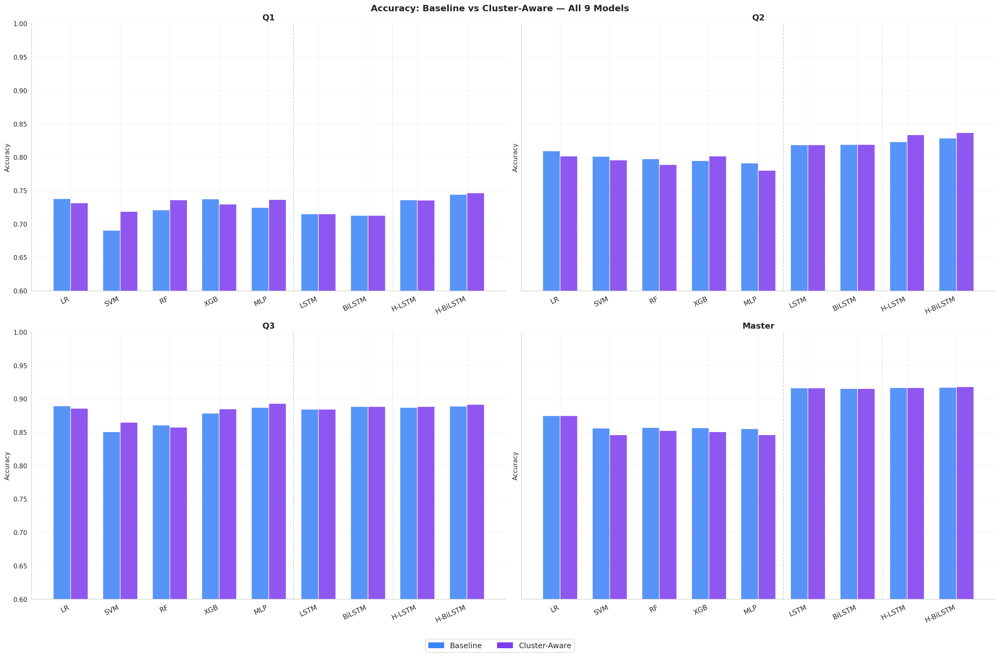

In [77]:
print("  S3-Fig1b: Accuracy side-by-side comparison")
width2 = 0.35
patches_bc = [mpatches.Patch(color=BASE_COL, label="Baseline"),
              mpatches.Patch(color=CLUS_COL, label="Cluster-Aware")]
fig, axes = plt.subplots(2, 2, figsize=(22, 14), sharey=True)
axes = axes.flatten()
fig.suptitle("Accuracy: Baseline vs Cluster-Aware — All 9 Models",
             fontsize=14, fontweight="bold")
for ax, window in zip(axes, WINDOWS):
    b_vals = [get_val_sec(1, window, m, "Accuracy") for m in MODELS]
    c_vals = [get_val_sec(2, window, m, "Accuracy") for m in MODELS]
    ax.bar(x_all - width2/2, b_vals, width2, color=BASE_COL,  alpha=0.85, edgecolor="white")
    ax.bar(x_all + width2/2, c_vals, width2, color=CLUS_COL, alpha=0.85, edgecolor="white")
    ax.set_xticks(x_all)
    ax.set_xticklabels([MODEL_SHORT[m] for m in MODELS], fontsize=11, rotation=25, ha="right")
    ax.set_title(window, fontsize=13, fontweight="bold")
    ax.set_ylabel("Accuracy"); fmt_ax(ax, (0.60, 1.0))
    ax.axvline(4.5, color="gray", lw=1, linestyle="--", alpha=0.4)
    ax.axvline(6.5, color="gray", lw=1, linestyle=":", alpha=0.4)
fig.legend(handles=patches_bc, loc="lower center", ncol=2,
           fontsize=12, bbox_to_anchor=(0.5, -0.04))
plt.tight_layout(); plt.show()

### Fig 2 — ROC-AUC: Baseline vs Cluster-Aware

  S3-Fig2: ROC-AUC side-by-side comparison


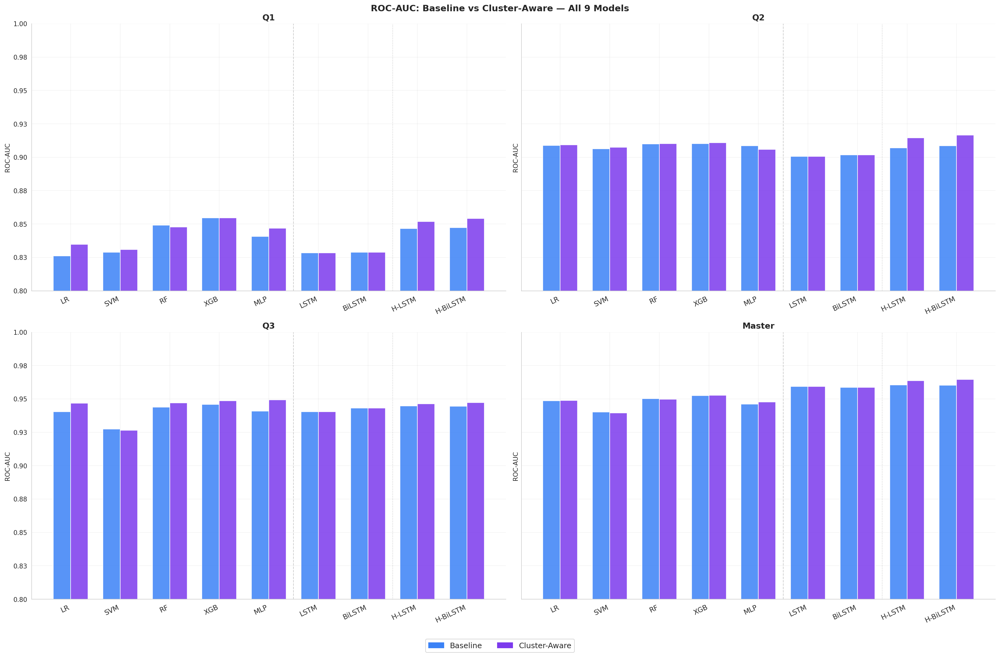

In [78]:
print("  S3-Fig2: ROC-AUC side-by-side comparison")
fig, axes = plt.subplots(2, 2, figsize=(22, 14), sharey=True)
axes = axes.flatten()
fig.suptitle("ROC-AUC: Baseline vs Cluster-Aware — All 9 Models",
             fontsize=14, fontweight="bold")
for ax, window in zip(axes, WINDOWS):
    b_vals = [get_val_sec(1, window, m, "ROC-AUC") for m in MODELS]
    c_vals = [get_val_sec(2, window, m, "ROC-AUC") for m in MODELS]
    ax.bar(x_all - width2/2, b_vals, width2, color=BASE_COL,  alpha=0.85, edgecolor="white")
    ax.bar(x_all + width2/2, c_vals, width2, color=CLUS_COL, alpha=0.85, edgecolor="white")
    ax.set_xticks(x_all)
    ax.set_xticklabels([MODEL_SHORT[m] for m in MODELS], fontsize=11, rotation=25, ha="right")
    ax.set_title(window, fontsize=13, fontweight="bold")
    ax.set_ylabel("ROC-AUC"); fmt_ax(ax, (0.80, 1.0))
    ax.axvline(4.5, color="gray", lw=1, linestyle="--", alpha=0.4)
    ax.axvline(6.5, color="gray", lw=1, linestyle=":", alpha=0.4)
fig.legend(handles=patches_bc, loc="lower center", ncol=2,
           fontsize=12, bbox_to_anchor=(0.5, -0.04))
plt.tight_layout(); plt.show()

### Fig 3 — Delta Heatmap (Cluster − Baseline)

  S3-Fig3: Delta heatmap — Cluster minus Baseline (tabular models)


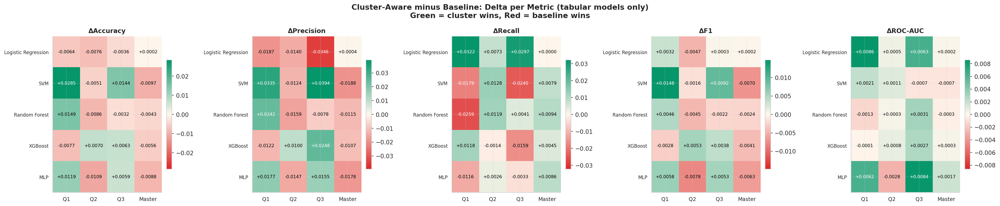

In [79]:
print("  S3-Fig3: Delta heatmap — Cluster minus Baseline (tabular models)")
MODELS_TAB = ["Logistic Regression","SVM","Random Forest","XGBoost","MLP"]
div_cmap = LinearSegmentedColormap.from_list("div", [RED,"#FFF7ED",GREEN])
fig, axes = plt.subplots(1, len(METRICS), figsize=(24, 5))
fig.suptitle("Cluster-Aware minus Baseline: Delta per Metric (tabular models only)\n"
             "Green = cluster wins, Red = baseline wins",
             fontsize=13, fontweight="bold")
for ax, metric in zip(axes, METRICS):
    delta = np.array([[gv(df_clus,w,m,metric) - gv(df_base,w,m,metric)
                       for w in WINDOWS] for m in MODELS_TAB])
    lim = max(abs(delta.max()), abs(delta.min()), 0.003)
    im  = ax.imshow(delta, cmap=div_cmap, vmin=-lim, vmax=lim, aspect="auto")
    ax.set_xticks(range(len(WINDOWS))); ax.set_xticklabels(WINDOWS, fontsize=9)
    ax.set_yticks(range(len(MODELS_TAB))); ax.set_yticklabels(MODELS_TAB, fontsize=8)
    ax.set_title(f"Δ{metric}", fontsize=11, fontweight="bold")
    for i in range(len(MODELS_TAB)):
        for j in range(len(WINDOWS)):
            v = delta[i,j]
            ax.text(j, i, f"{v:+.4f}", ha="center", va="center", fontsize=7.5,
                    color="white" if abs(v)>lim*0.55 else "black")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.tight_layout(); plt.show()

### Fig 4 — Per-Model Line Charts

  S3-Fig4: Per-model line chart — Baseline vs Cluster (tabular models)


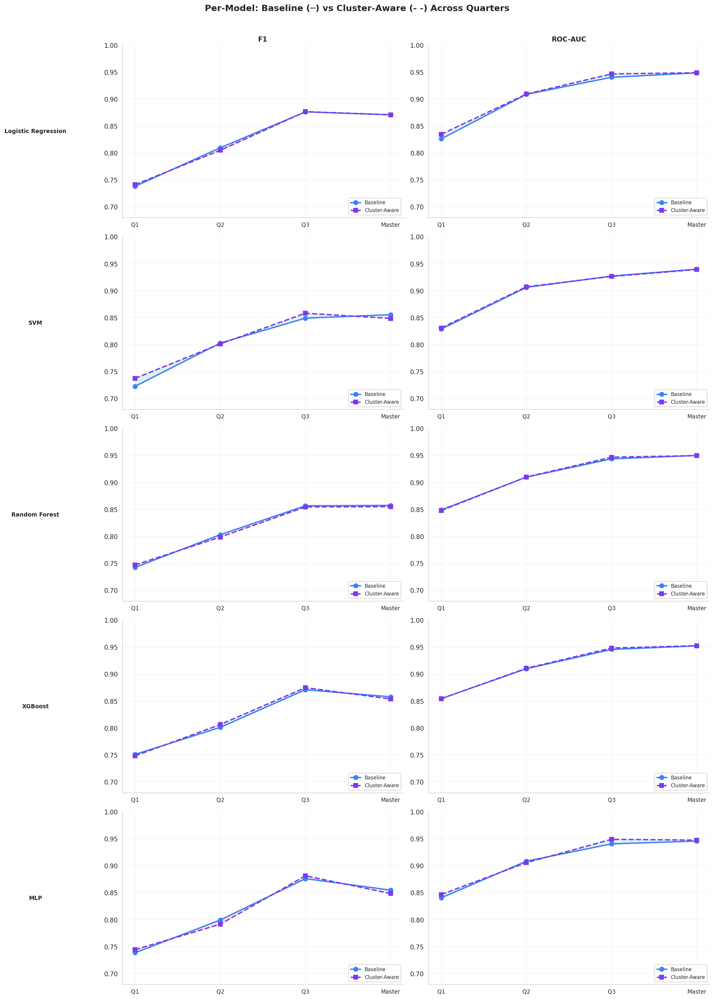

In [80]:
print("  S3-Fig4: Per-model line chart — Baseline vs Cluster (tabular models)")
fig, axes = plt.subplots(len(MODELS_TAB), 2, figsize=(16, 22))
fig.suptitle("Per-Model: Baseline (─) vs Cluster-Aware (- -) Across Quarters",
             fontsize=14, fontweight="bold", y=1.01)
for row, model in enumerate(MODELS_TAB):
    for col, metric in enumerate(["F1","ROC-AUC"]):
        ax = axes[row, col]
        b_vals = [gv(df_base, w, model, metric) for w in WINDOWS]
        c_vals = [gv(df_clus, w, model, metric) for w in WINDOWS]
        ax.plot(xpos, b_vals, color=BASE_COL,  marker="o", lw=2.2, ms=7, label="Baseline")
        ax.plot(xpos, c_vals, color=CLUS_COL, marker="s", lw=2.2, ms=7,
                linestyle="--", label="Cluster-Aware")
        ax.fill_between(xpos, b_vals, c_vals,
                        color=GREEN if np.mean(c_vals)>=np.mean(b_vals) else RED, alpha=0.12)
        ax.set_xticks(xpos); ax.set_xticklabels(WINDOWS, fontsize=9)
        fmt_ax(ax, (0.68, 1.0))
        if col==0: ax.set_ylabel(model, fontsize=9, fontweight="bold",
                                 rotation=0, labelpad=110, va="center")
        if row==0: ax.set_title(metric, fontsize=11, fontweight="bold")
        ax.legend(fontsize=8, loc="lower right")
plt.tight_layout(); plt.show()

### Fig 5 — Best Score per Group

  S3-Fig5: Best score per group across quarters


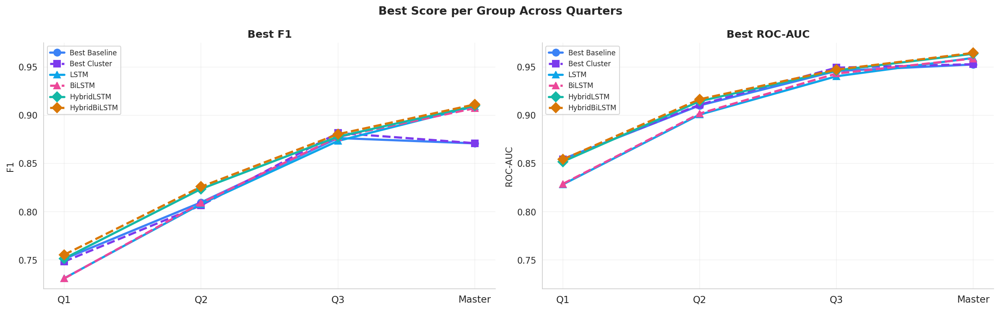

In [81]:
print("  S3-Fig5: Best score per group across quarters")
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle("Best Score per Group Across Quarters",
             fontsize=13, fontweight="bold")
for ax, metric in zip(axes, ["F1","ROC-AUC"]):
    b_best   = [df_base[df_base.Window==w][metric].max()   for w in WINDOWS]
    c_best   = [df_clus[df_clus.Window==w][metric].max()   for w in WINDOWS]
    l_lstm   = [gv(df_lstm,  w, "LSTM",         metric) for w in WINDOWS]
    l_bi     = [gv(df_lstm,  w, "BiLSTM",       metric) for w in WINDOWS]
    l_hy     = [gv(df_hybrid,w, "HybridLSTM",   metric) for w in WINDOWS]
    l_hybi   = [gv(df_hybrid,w, "HybridBiLSTM", metric) for w in WINDOWS]
    ax.plot(xpos, b_best, color=BASE_COL,           marker="o", lw=2.5, ms=8, label="Best Baseline")
    ax.plot(xpos, c_best, color=CLUS_COL,           marker="s", lw=2.5, ms=8, label="Best Cluster", linestyle="--")
    ax.plot(xpos, l_lstm, color=MODEL_COLORS["LSTM"],       marker="^", lw=2.5, ms=8, label="LSTM")
    ax.plot(xpos, l_bi,   color=MODEL_COLORS["BiLSTM"],     marker="^", lw=2.5, ms=8, label="BiLSTM", linestyle="--")
    ax.plot(xpos, l_hy,   color=MODEL_COLORS["HybridLSTM"], marker="D", lw=2.5, ms=8, label="HybridLSTM")
    ax.plot(xpos, l_hybi, color=MODEL_COLORS["HybridBiLSTM"],marker="D",lw=2.5, ms=8, label="HybridBiLSTM", linestyle="--")
    ax.set_xticks(xpos); ax.set_xticklabels(WINDOWS, fontsize=11)
    ax.set_title(f"Best {metric}", fontsize=12, fontweight="bold")
    ax.set_ylabel(metric); fmt_ax(ax, (0.72, 0.975))
    ax.legend(fontsize=8, loc="upper left")
plt.tight_layout(); plt.show()

### Fig 6 — Win / Tie / Loss Tally

  S3-Fig6: Win / Tie / Loss tally


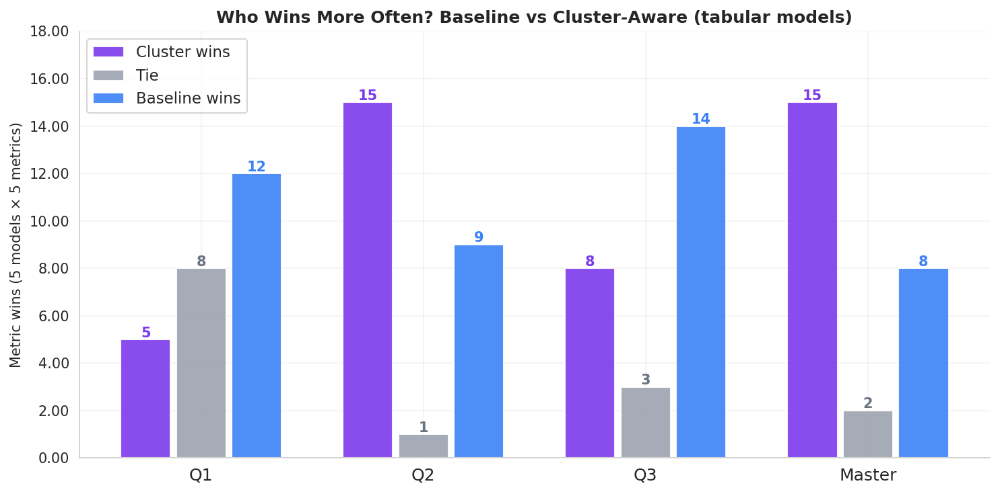

In [82]:
print("  S3-Fig6: Win / Tie / Loss tally")
records = []
for window in WINDOWS:
    for model in MODELS_TAB:
        for metric in METRICS:
            bv = gv(df_base, window, model, metric)
            cv = gv(df_clus, window, model, metric)
            d  = cv - bv
            records.append({"Window":window,"Model":model,"Metric":metric,
                             "Winner":"Cluster" if d>0.001 else "Baseline" if d<-0.001 else "Tie"})
rec_df  = pd.DataFrame(records)
summary = rec_df.groupby(["Window","Winner"]).size().unstack(fill_value=0)
for col in ["Cluster","Baseline","Tie"]:
    if col not in summary.columns: summary[col] = 0
summary = summary[["Cluster","Tie","Baseline"]]
fig, ax = plt.subplots(figsize=(10, 5))
w_bar = 0.25; x_w = np.arange(len(WINDOWS))
ax.bar(x_w-w_bar, summary["Cluster"],  w_bar*0.9, color=CLUS_COL,  label="Cluster wins",  alpha=0.9)
ax.bar(x_w,        summary["Tie"],      w_bar*0.9, color="#9CA3AF", label="Tie",            alpha=0.9)
ax.bar(x_w+w_bar,  summary["Baseline"],w_bar*0.9, color=BASE_COL,  label="Baseline wins", alpha=0.9)
for i, (ci,ti,bi) in enumerate(zip(summary["Cluster"],summary["Tie"],summary["Baseline"])):
    ax.text(i-w_bar, ci+0.1, str(ci), ha="center", fontsize=10, fontweight="bold", color=CLUS_COL)
    ax.text(i,        ti+0.1, str(ti), ha="center", fontsize=10, fontweight="bold", color="#6B7280")
    ax.text(i+w_bar,  bi+0.1, str(bi), ha="center", fontsize=10, fontweight="bold", color=BASE_COL)
ax.set_xticks(x_w); ax.set_xticklabels(WINDOWS, fontsize=12)
ax.set_ylabel("Metric wins (5 models × 5 metrics)", fontsize=10)
ax.set_title("Who Wins More Often? Baseline vs Cluster-Aware (tabular models)",
             fontsize=12, fontweight="bold")
ax.legend(fontsize=11); fmt_ax(ax, (0, summary.values.max()+3))
plt.tight_layout(); plt.show()

### Fig 7 — Final Winner Summary

S3-Fig7: Final winner summary


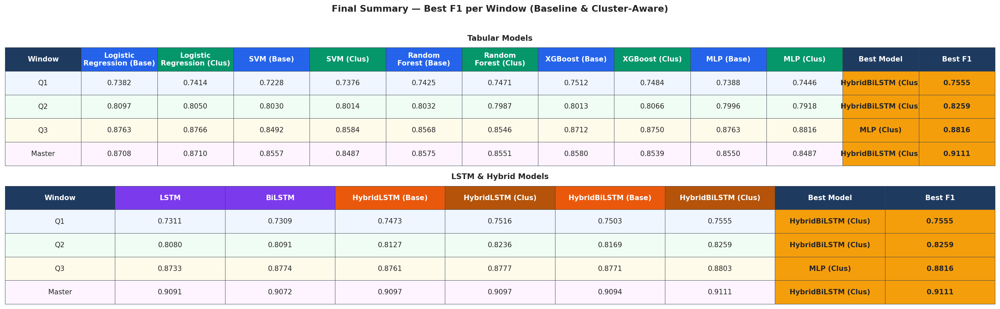

In [83]:
print("S3-Fig7: Final winner summary")

def make_summary_table(ax, sum_df, title, header_colors):
    ax.axis("off")
    tbl = ax.table(
        cellText=sum_df.values,
        colLabels=sum_df.columns,
        cellLoc="center",
        loc="center",
        bbox=[0, 0, 1, 1]
    )
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(10)
    tbl.scale(1, 2.2)

    for j, col in enumerate(sum_df.columns):
        tbl[0, j].set_facecolor(header_colors.get(col, "#1E3A5F"))
        tbl[0, j].set_text_props(color="white", fontweight="bold")

    for i in range(1, len(sum_df) + 1):
        bg = win_bg.get(sum_df.iloc[i - 1]["Window"], "white")
        for j in range(len(sum_df.columns)):
            tbl[i, j].set_facecolor(bg)
        # highlight best F1 columns
        for j in [len(sum_df.columns) - 1, len(sum_df.columns) - 2]:
            tbl[i, j].set_facecolor("#F59E0B")
            tbl[i, j].set_text_props(fontweight="bold")

    for key, cell in tbl.get_celld().items():
        cell.set_edgecolor("#374151")
        cell.set_linewidth(0.5)

    ax.set_title(title, fontsize=11, fontweight="bold", pad=10)

tab_rows, deep_rows = [], []

for window in WINDOWS:
    tab_row  = {"Window": window}
    deep_row = {"Window": window}

    for m in MODELS_TAB:
        tab_row[f"{m} (Base)"] = gv(df_base, window, m, "F1")
        tab_row[f"{m} (Clus)"] = gv(df_clus, window, m, "F1")

    for m in ["LSTM", "BiLSTM"]:
        deep_row[m] = gv(df_lstm, window, m, "F1")

    for m in ["HybridLSTM", "HybridBiLSTM"]:
        deep_row[f"{m} (Base)"] = gv(df_hybrid_base, window, m, "F1")
        deep_row[f"{m} (Clus)"] = gv(df_hybrid, window, m, "F1")

    all_vals = {**{k: v for k, v in tab_row.items() if k != "Window"},
                **{k: v for k, v in deep_row.items() if k != "Window"}}
    best_key = max(all_vals, key=lambda k: all_vals[k] if not pd.isna(all_vals[k]) else -1)
    best_f1  = f"{all_vals[best_key]:.4f}"

    tab_row["Best Model"]  = best_key
    tab_row["Best F1"]     = best_f1
    deep_row["Best Model"] = best_key
    deep_row["Best F1"]    = best_f1

    tab_rows.append(tab_row)
    deep_rows.append(deep_row)

def fmt_df(rows):
    df = pd.DataFrame(rows)
    df.columns = [c.replace("Logistic Regression", "Logistic\nRegression")
                   .replace("Random Forest", "Random\nForest") 
                  for c in df.columns]
    num_cols = [c for c in df.columns if c not in ["Window", "Best Model", "Best F1"]]
    for c in num_cols:
        df[c] = df[c].map(lambda v: f"{v:.4f}" if not pd.isna(v) else "—")
    return df

tab_df  = fmt_df(tab_rows)
deep_df = fmt_df(deep_rows)

tab_colors = {"Window": "#1E3A5F", "Best Model": "#1E3A5F", "Best F1": "#1E3A5F"}
for m in MODELS_TAB:
    wrapped = m.replace("Logistic Regression", "Logistic\nRegression").replace("Random Forest", "Random\nForest")
    tab_colors[f"{wrapped} (Base)"] = "#2563EB"
    tab_colors[f"{wrapped} (Clus)"] = "#059669"

deep_colors = {"Window": "#1E3A5F", "Best Model": "#1E3A5F", "Best F1": "#1E3A5F",
               "LSTM": "#7C3AED", "BiLSTM": "#7C3AED"}
for m in ["HybridLSTM", "HybridBiLSTM"]:
    deep_colors[f"{m} (Base)"] = "#EA580C"
    deep_colors[f"{m} (Clus)"] = "#B45309"

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 6))
fig.suptitle("Final Summary — Best F1 per Window (Baseline & Cluster-Aware)",
             fontsize=13, fontweight="bold", y=1.02)

make_summary_table(ax1, tab_df,  "Tabular Models",       tab_colors)
make_summary_table(ax2, deep_df, "LSTM & Hybrid Models", deep_colors)

plt.tight_layout()
plt.show()

### Accuracy Trend Graph

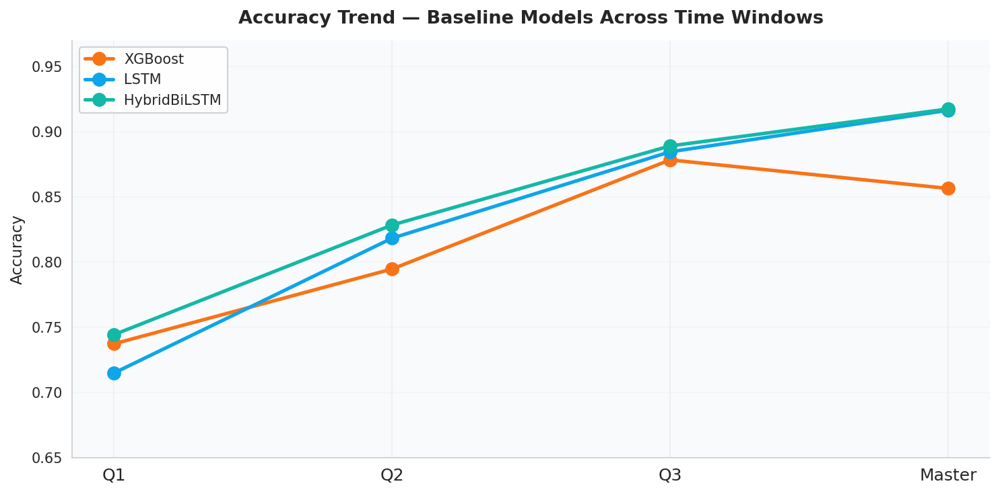

In [84]:
TREND_MODELS  = ["XGBoost", "LSTM", "HybridBiLSTM"]
TREND_COLORS  = {"XGBoost": "#F97316", "LSTM": "#0EA5E9", "HybridBiLSTM": "#14B8A6"}
x = np.arange(len(WINDOWS))

# pull accuracy for section 1 (baseline)
bl_acc = {}
for m in TREND_MODELS:
    vals = [get_val_sec(1, w, m, "Accuracy") for w in WINDOWS]
    if not all(np.isnan(v) for v in vals):
        bl_acc[m] = vals

fig, ax = plt.subplots(figsize=(10, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("#F8FAFC")
ax.grid(axis="y", color="#E2E8F0", linewidth=0.8, zorder=0)
ax.set_axisbelow(True)

for model, vals in bl_acc.items():
    col = TREND_COLORS[model]
    ax.plot(x, vals, marker="o", markersize=9, linewidth=2.5,
            color=col, label=model, zorder=3)

ax.set_xticks(x)
ax.set_xticklabels(WINDOWS, fontsize=12)
ax.set_ylim(0.65, 0.97)
ax.set_ylabel("Accuracy", fontsize=11)
ax.set_title("Accuracy Trend — Baseline Models Across Time Windows",
             fontsize=13, fontweight="bold", pad=12)
ax.legend(fontsize=10, framealpha=0.9)
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.show()

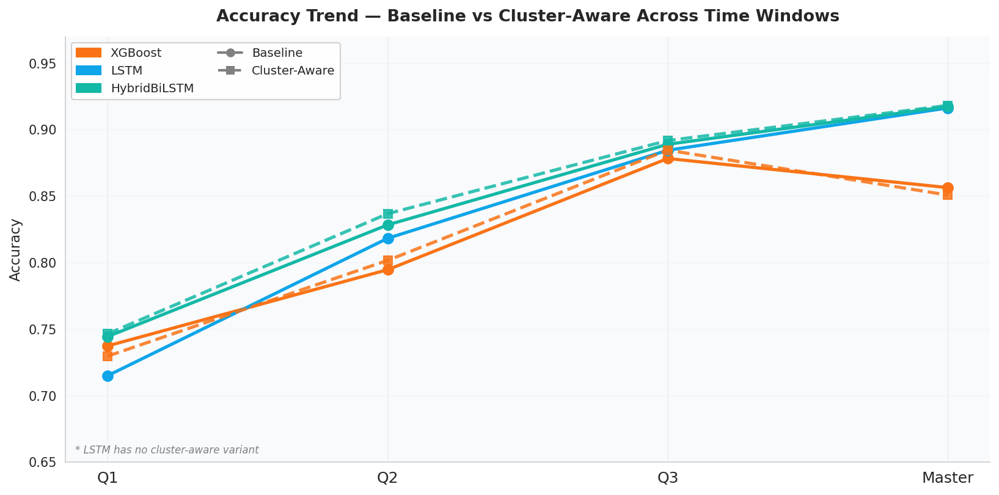

In [85]:
TREND_MODELS = ["XGBoost", "LSTM", "HybridBiLSTM"]
HAS_CLUSTER  = ["XGBoost", "HybridBiLSTM"]   # LSTM has no cluster variant
TREND_COLORS = {"XGBoost": "#F97316", "LSTM": "#0EA5E9", "HybridBiLSTM": "#14B8A6"}
x = np.arange(len(WINDOWS))

bl_acc, ca_acc = {}, {}
for m in TREND_MODELS:
    v_bl = [get_val_sec(1, w, m, "Accuracy") for w in WINDOWS]
    if not all(np.isnan(v) for v in v_bl):
        bl_acc[m] = v_bl

for m in HAS_CLUSTER:                         # only pull cluster for these two
    v_ca = [get_val_sec(2, w, m, "Accuracy") for w in WINDOWS]
    if not all(np.isnan(v) for v in v_ca):
        ca_acc[m] = v_ca

fig, ax = plt.subplots(figsize=(11, 5.5))
fig.patch.set_facecolor("white")
ax.set_facecolor("#F8FAFC")
ax.grid(axis="y", color="#E2E8F0", linewidth=0.8, zorder=0)
ax.set_axisbelow(True)

for model, vals in bl_acc.items():
    col = TREND_COLORS[model]
    ax.plot(x, vals, marker="o", markersize=8, linewidth=2.5,
            color=col, linestyle="-", zorder=3)

for model, vals in ca_acc.items():
    col = TREND_COLORS[model]
    ax.plot(x, vals, marker="s", markersize=7, linewidth=2.5,
            color=col, linestyle="--", zorder=3, alpha=0.85)

ax.set_xticks(x)
ax.set_xticklabels(WINDOWS, fontsize=12)
ax.set_ylim(0.65, 0.97)
ax.set_ylabel("Accuracy", fontsize=11)
ax.set_title("Accuracy Trend — Baseline vs Cluster-Aware Across Time Windows",
             fontsize=13, fontweight="bold", pad=12)

handles = [mpatches.Patch(color=TREND_COLORS[m], label=m) for m in TREND_MODELS]
handles += [
    plt.Line2D([0],[0], color="grey", linewidth=2, linestyle="-",
               marker="o", markersize=6, label="Baseline"),
    plt.Line2D([0],[0], color="grey", linewidth=2, linestyle="--",
               marker="s", markersize=6, label="Cluster-Aware"),
]
ax.annotate("* LSTM has no cluster-aware variant",
            xy=(0.01, 0.02), xycoords="axes fraction",
            fontsize=8, color="grey", style="italic")
ax.legend(handles=handles, fontsize=9.5, ncol=2, framealpha=0.9, loc="upper left")
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.show()


####   Explainability of Top Performing model

Course quarter cutoffs: Q1=10  Q2=20  Q3=30  Master=39 weeks

BEST MODEL PER WINDOW:
  Baseline  Q1     → XGBoost                   AUC=0.8546
  Baseline  Q2     → Random Forest             AUC=0.9099
  Baseline  Q3     → HybridLSTM                AUC=0.9447
  Baseline  Master → HybridBiLSTM              AUC=0.9603
  Cluster   Q1     → HybridBiLSTM              AUC=0.8542
  Cluster   Q2     → HybridBiLSTM              AUC=0.9165
  Cluster   Q3     → MLP                       AUC=0.9492
  Cluster   Master → HybridBiLSTM              AUC=0.9645

───────────────────────────────────────────────────────
  Baseline Q1  →  XGBoost  AUC=0.8546
───────────────────────────────────────────────────────
  ✓ top feature: n_submissions_Q1  (27 total)

───────────────────────────────────────────────────────
  Baseline Q2  →  Random Forest  AUC=0.9099
───────────────────────────────────────────────────────
  ✓ top feature: AP_Q2_missing  (27 total)

─────────────────────────────────────────────────────

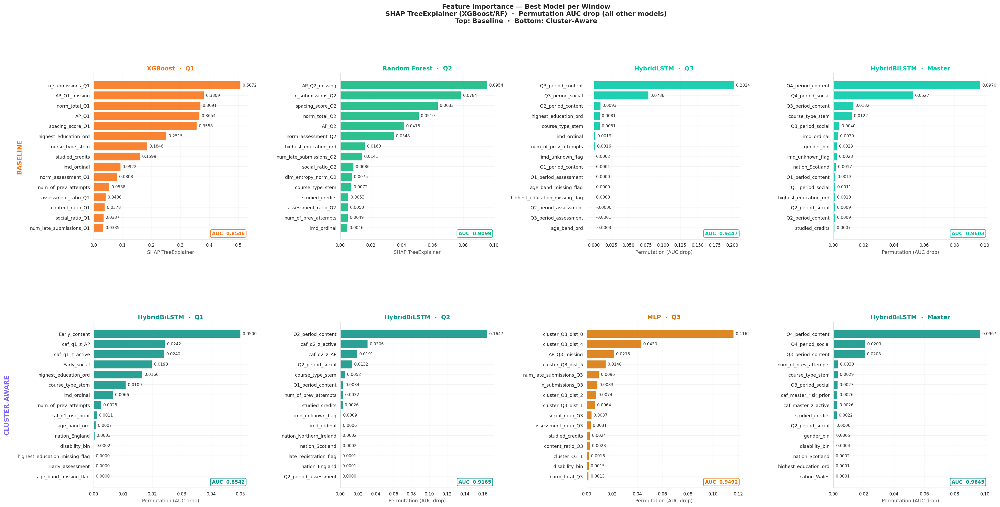

In [ ]:
#feature importance

# single RNG source
import shap


RNG = np.random.default_rng(42)
torch.manual_seed(42)

TARGET      = "target_at_risk"
AUC_TIE_TOL = 0.002
TOP_N       = 15
N_BG        = 50
MAX_EXPLAIN = 200
N_REPEATS   = 5
KEYS        = ["id_student","code_module","code_presentation"]

TABULAR_MODELS = {"XGBoost","MLP","Random Forest","Logistic Regression","SVM"}
TREE_MODELS    = {"XGBoost","Random Forest"}
SEQ_MODELS     = {"LSTM","BiLSTM","HybridLSTM","HybridBiLSTM"}

WINDOWS_BASELINE = {
    "Q1":{"train":ml_Q1_train,"test":ml_Q1_test},
    "Q2":{"train":ml_Q2_train,"test":ml_Q2_test},
    "Q3":{"train":ml_Q3_train,"test":ml_Q3_test},
    "Master":{"train":ml_master_train,"test":ml_master_test},
}
WINDOWS_CAF = {
    "Q1":{"train":ml_Q1_train_caf,"test":ml_Q1_test_caf},
    "Q2":{"train":ml_Q2_train_caf,"test":ml_Q2_test_caf},
    "Q3":{"train":ml_Q3_train_caf,"test":ml_Q3_test_caf},
    "Master":{"train":ml_master_train_caf,"test":ml_master_test_caf},
}
SELECTED_FEATURES_CLUSTER_AWARE_FINAL = SELECTED_FEATURES

shap.initjs()

Q1_END  = int(course_windows["q1_end"].max())
Q2_END  = int(course_windows["q2_end"].max())
Q3_END  = int(course_windows["q3_end"].max())
Q4_END  = int(course_windows["q4_end"].max())

print(f"Course quarter cutoffs: Q1={Q1_END}  Q2={Q2_END}  "
      f"Q3={Q3_END}  Master={Q4_END} weeks")

# temporal grouping per window using actual cutoffs
TEMPORAL_GROUPS = {
    "Q1": [
        ("Early", 0, Q1_END),
    ],
    "Q2": [
        ("Q1_period", 0,      Q1_END),
        ("Q2_period", Q1_END, Q2_END),
    ],
    "Q3": [
        ("Q1_period", 0,      Q1_END),
        ("Q2_period", Q1_END, Q2_END),
        ("Q3_period", Q2_END, Q3_END),
    ],
    "Master": [
        ("Q1_period", 0,      Q1_END),
        ("Q2_period", Q1_END, Q2_END),
        ("Q3_period", Q2_END, Q3_END),
        ("Q4_period", Q3_END, Q4_END),
    ],
}

# load csv's
def _load(path):
    df = pd.read_csv(path, usecols=lambda c: c in
                     ["Window","Model","ROC-AUC","Accuracy","Best_Params"])
    df["Model"] = df["Model"].str.replace("_tuned","",regex=False)\
                             .str.replace("_CAF","",regex=False).str.strip()
    return df

df_b  = _load("results_tuned_baseline.csv")
df_c  = _load("results_tuned_caf.csv")
df_l  = _load("results_tuned_lstm_models.csv")
df_hb = _load("results_tuned_hybrid_models.csv")
df_hc = _load("results_tuned_hybrid_caf_models.csv")

# Best model per window
def best_model(dfs, window):
    rows = []
    for df in dfs:
        sub = df[df.Window==window].dropna(subset=["ROC-AUC","Accuracy"])
        for _,r in sub.iterrows():
            rows.append({"model":r.Model,
                         "auc":float(r["ROC-AUC"]),
                         "acc":float(r.Accuracy)})
    if not rows: raise ValueError(f"No results for {window}")
    rows = sorted(rows, key=lambda x:(x["auc"],x["acc"]), reverse=True)
    best = rows[0]
    if len(rows)>1 and abs(rows[0]["auc"]-rows[1]["auc"]) < AUC_TIE_TOL:
        best = max(rows[:2], key=lambda x: x["acc"])
    return best["model"], round(best["auc"],4)

PANELS = {}
for exp, dfs in [
    ("Baseline", [df_b, df_l, df_hb]),
    ("Cluster",  [df_c, df_hc]),
]:
    for window in ["Q1","Q2","Q3","Master"]:
        model, auc = best_model(dfs, window)
        PANELS[(exp,window)] = {"model":model,"auc":auc}

print("\nBEST MODEL PER WINDOW:")
for (exp,win),v in PANELS.items():
    print(f"  {exp:9s} {win:6s} → {v['model']:25s} AUC={v['auc']:.4f}")

# Param loader
_DEF = {"hidden_size":64,"num_layers":2,"dropout":0.3,
        "static_hidden_dim":32,"clf_hidden_dim":64,
        "lr":1e-3,"batch_size":256,"weight_decay":1e-4}

def get_params(model, window, experiment):
    if "Hybrid" in model and experiment=="Cluster": df = df_hc
    elif "Hybrid" in model:                         df = df_hb
    elif model in {"LSTM","BiLSTM"}:                df = df_l
    elif experiment=="Cluster":                     df = df_c
    else:                                           df = df_b
    for name in [f"{model}_tuned",model,
                 f"{model}_CAF_tuned",f"{model}_CAF"]:
        row = df[(df.Model==name)&(df.Window==window)]
        if len(row):
            raw = row.iloc[0].get("Best_Params",None)
            if raw is not None and pd.notna(raw):
                try: return ast.literal_eval(str(raw))
                except: pass
    return _DEF.copy()

# Tabular data
def get_tabular_data(window, experiment):
    if experiment=="Baseline":
        features = SELECTED_FEATURES_BASE[window]
        train_df = WINDOWS_BASELINE[window]["train"]
        test_df  = WINDOWS_BASELINE[window]["test"]
    else:
        features = SELECTED_FEATURES_CLUSTER_AWARE_FINAL[window]
        train_df = WINDOWS_CAF[window]["train"]
        test_df  = WINDOWS_CAF[window]["test"]
    Xtr = train_df[features].fillna(0).values
    Xte = test_df[features].fillna(0).values
    ytr = train_df[TARGET].astype(int).values
    yte = test_df[TARGET].astype(int).values
    spw = (ytr==0).sum()/max((ytr==1).sum(),1)
    return Xtr, Xte, ytr, yte, list(features), spw

# Build tabular model
def build_tabular(model_name, window, experiment):
    Xtr, Xte, ytr, yte, features, spw = get_tabular_data(window, experiment)
    params = get_params(model_name, window, experiment)
    clfs = {
        "XGBoost": XGBClassifier(scale_pos_weight=spw,eval_metric="auc",
                                  random_state=42,n_jobs=-1,verbosity=0),
        "MLP": MLPClassifier(early_stopping=True,validation_fraction=0.1,
                              random_state=42),
        "Random Forest": RandomForestClassifier(class_weight="balanced",
                                                 random_state=42,n_jobs=-1),
        "Logistic Regression": LogisticRegression(class_weight="balanced",
                                                   max_iter=1000,random_state=42),
        "SVM": SVC(kernel="rbf",class_weight="balanced",
                   probability=True,random_state=42),
    }
    pipe = Pipeline([("scaler",RobustScaler()),("clf",clfs[model_name])])
    if params: pipe.set_params(**params)
    pipe.fit(Xtr, ytr)
    return pipe, Xtr, Xte, ytr, yte, features

# Sequence data 
def get_seq_data(window, experiment):
    q_end_col, global_max_wk = {
        "Q1":     ("q1_end", Q1_END),
        "Q2":     ("q2_end", Q2_END),
        "Q3":     ("q3_end", Q3_END),
        "Master": ("q4_end", Q4_END),
    }[window]

    X_tr_seq = build_sequences_masked(ml_seq_train, global_max_wk, q_end_col)
    X_te_seq = build_sequences_masked(ml_seq_test,  global_max_wk, q_end_col)
    y_tr     = ml_seq_train[TARGET].astype(int).values
    y_te     = ml_seq_test[TARGET].astype(int).values

    # actual quarter cutoffs for temporal grouping
    dim_names = ["content","assessment","social"]
    groups = []
    for period_name, wk_start, wk_end in TEMPORAL_GROUPS[window]:
        for dim_idx, dim_name in enumerate(dim_names):
            groups.append((
                f"{period_name}_{dim_name}",
                wk_start,
                min(wk_end, global_max_wk),
                dim_idx
            ))

    print(f"    seq shape: {X_tr_seq.shape}")
    print(f"    temporal groups: {[g[0] for g in groups]}")

    return X_tr_seq, X_te_seq, y_tr, y_te, groups

#  Build neural model 
def build_neural(model_name, window, experiment):
    params = get_params(model_name, window, experiment)
    X_tr_seq, X_te_seq, y_tr, y_te, groups = get_seq_data(
        window, experiment)

    n_dims = X_tr_seq.shape[2]  # 3: content, assessment, social

    sc_seq = RobustScaler().fit(X_tr_seq.reshape(-1, n_dims))
    X_tr_s = sc_seq.transform(
        X_tr_seq.reshape(-1, n_dims)).reshape(X_tr_seq.shape)
    X_te_s = sc_seq.transform(
        X_te_seq.reshape(-1, n_dims)).reshape(X_te_seq.shape)

    is_hybrid = "Hybrid" in model_name

    if is_hybrid:
        if experiment == "Baseline":
            static_cols = HYBRID_STATIC_BASE
            X_sta_tr    = ml_seq_train_h[static_cols].fillna(0).values
            X_sta_te    = ml_seq_test_h[static_cols].fillna(0).values
        else:
            static_cols = HYBRID_STATIC_CAF[window]
            extra = [c for c in static_cols
                     if c not in ml_seq_train_h.columns]
            tr_df = ml_seq_train_h.copy()
            te_df = ml_seq_test_h.copy()
            if extra:
                src_tr = WINDOWS_CAF[window]["train"]
                src_te = WINDOWS_CAF[window]["test"]
                tr_df  = tr_df.merge(
                    src_tr[KEYS+extra].drop_duplicates(KEYS),
                    on=KEYS, how="left")
                te_df  = te_df.merge(
                    src_te[KEYS+extra].drop_duplicates(KEYS),
                    on=KEYS, how="left")
            for c in static_cols:
                if c not in tr_df.columns: tr_df[c] = 0.
                if c not in te_df.columns: te_df[c] = 0.
            X_sta_tr = tr_df[static_cols].fillna(0).values
            X_sta_te = te_df[static_cols].fillna(0).values

        sc_sta   = RobustScaler().fit(X_sta_tr)
        X_sta_tr = sc_sta.transform(X_sta_tr)
        X_sta_te = sc_sta.transform(X_sta_te)

        assert len(X_sta_tr)==len(X_tr_s), \
            f"Train mismatch: seq={len(X_tr_s)} static={len(X_sta_tr)}"
        assert len(X_sta_te)==len(X_te_s), \
            f"Test mismatch: seq={len(X_te_s)} static={len(X_sta_te)}"

        model = HybridLSTM(
            seq_input_size    = n_dims,
            static_input_size = len(static_cols),
            hidden_size       = params.get("hidden_size",      64),
            num_layers        = params.get("num_layers",         2),
            dropout           = params.get("dropout",          0.3),
            bidirectional     = (model_name=="HybridBiLSTM"),
            static_hidden_dim = params.get("static_hidden_dim", 32),
            clf_hidden_dim    = params.get("clf_hidden_dim",    64),
        )
    else:
        X_sta_tr    = None
        X_sta_te    = None
        sc_sta      = None
        static_cols = []
        model = LSTMModel(
            input_size     = n_dims,
            hidden_size    = params.get("hidden_size",   64),
            num_layers     = params.get("num_layers",     2),
            dropout        = params.get("dropout",       0.3),
            bidirectional  = (model_name=="BiLSTM"),
            clf_hidden_dim = params.get("clf_hidden_dim", 64),
        )

    pw   = torch.tensor([(y_tr==0).sum()/max((y_tr==1).sum(),1)],
                         dtype=torch.float32)
    crit = nn.BCEWithLogitsLoss(pos_weight=pw)
    opt  = torch.optim.Adam(model.parameters(),
                             lr=params.get("lr",1e-3),
                             weight_decay=params.get("weight_decay",1e-4))

    idx      = np.arange(len(y_tr))
    tri, vli = train_test_split(idx,test_size=0.15,
                                random_state=42,stratify=y_tr)
    Xt_seq = torch.tensor(X_tr_s, dtype=torch.float32)
    yt     = torch.tensor(y_tr,   dtype=torch.float32)
    if is_hybrid:
        Xt_sta = torch.tensor(X_sta_tr, dtype=torch.float32)

    best_st, best_auc, wait = None, -np.inf, 0
    bs = params.get("batch_size", 256)

    for ep in range(100):
        model.train()
        if is_hybrid:
            for xb_seq,xb_sta,yb in DataLoader(
                TensorDataset(Xt_seq[tri],Xt_sta[tri],yt[tri]),
                batch_size=bs, shuffle=True
            ):
                opt.zero_grad()
                out = model(xb_seq,xb_sta).squeeze(-1)
                crit(out,yb).backward()
                nn.utils.clip_grad_norm_(model.parameters(),1.)
                opt.step()
        else:
            for xb,yb in DataLoader(
                TensorDataset(Xt_seq[tri],yt[tri]),
                batch_size=bs, shuffle=True
            ):
                opt.zero_grad()
                out = model(xb)
                if isinstance(out,tuple): out=out[0]
                crit(out,yb).backward()
                nn.utils.clip_grad_norm_(model.parameters(),1.)
                opt.step()

        model.eval()
        with torch.no_grad():
            if is_hybrid:
                logits = model(Xt_seq[vli],Xt_sta[vli]).squeeze(-1)
            else:
                logits = model(Xt_seq[vli])
                if isinstance(logits,tuple): logits=logits[0]
            probs = torch.sigmoid(logits).numpy().ravel()

        va = roc_auc_score(y_tr[vli],probs)
        if va > best_auc:
            best_auc = va
            best_st  = {k:v.clone() for k,v in model.state_dict().items()}
            wait = 0
        else:
            wait += 1
        if wait >= 10: break

    model.load_state_dict(best_st)
    print(f"    val_auc={best_auc:.4f}  ep={ep+1}")

    return (model, sc_seq, sc_sta,
            X_tr_s, X_te_s,
            X_sta_tr, X_sta_te,
            y_tr, y_te,
            groups, list(static_cols), is_hybrid)

# SHAP TreeExplainer on SCALED features 
# model was trained on scaled data so SHAP must also use scaled input
def shap_tree(pipe, Xte, features):
    idx       = RNG.choice(len(Xte), min(MAX_EXPLAIN,len(Xte)), replace=False)
    # scale to match training distribution
    X_explain = pipe.named_steps["scaler"].transform(Xte[idx])

    exp = shap.TreeExplainer(pipe.named_steps["clf"])
    sv  = exp.shap_values(X_explain)
    if isinstance(sv,list): sv=sv[1]
    elif sv.ndim==3:        sv=sv[:,:,1]

    return pd.Series(np.abs(sv).mean(0), index=features)\
             .sort_values(ascending=False)

# Permutation for tabular non-tree 
def permutation_importance_tabular(pipe, Xte, yte, features):
    idx  = RNG.choice(len(Xte), min(MAX_EXPLAIN,len(Xte)), replace=False)
    Xte  = Xte[idx]
    yte  = yte[idx]

    base_auc    = roc_auc_score(yte, pipe.predict_proba(Xte)[:,1])
    importances = {}

    for i, feat in enumerate(features):
        drops = []
        for _ in range(N_REPEATS):
            Xte_perm      = Xte.copy()
            perm_idx      = RNG.permutation(len(Xte))
            Xte_perm[:,i] = Xte_perm[perm_idx,i]
            perm_auc      = roc_auc_score(yte,
                                pipe.predict_proba(Xte_perm)[:,1])
            drops.append(base_auc - perm_auc)
        importances[feat] = np.mean(drops)

    return pd.Series(importances).sort_values(ascending=False)

# Permutation for neural 
def permutation_importance_neural(model, sc_seq, sc_sta,
                                   X_te_seq_s, X_te_sta_s,
                                   yte, groups, sta_feats,
                                   is_hybrid):
    idx        = RNG.choice(len(X_te_seq_s),
                            min(MAX_EXPLAIN,len(X_te_seq_s)), replace=False)
    X_te_seq_s = X_te_seq_s[idx]
    yte        = yte[idx]
    if X_te_sta_s is not None:
        X_te_sta_s = X_te_sta_s[idx]

    def predict(X_seq_s, X_sta_s=None):
        model.eval()
        Xt_seq = torch.tensor(X_seq_s, dtype=torch.float32)
        with torch.no_grad():
            if is_hybrid and X_sta_s is not None:
                Xt_sta = torch.tensor(X_sta_s, dtype=torch.float32)
                logits = model(Xt_seq,Xt_sta).squeeze(-1)
            else:
                logits = model(Xt_seq)
                if isinstance(logits,tuple): logits=logits[0]
            return torch.sigmoid(logits).numpy().ravel()

    base_auc    = roc_auc_score(yte, predict(X_te_seq_s, X_te_sta_s))
    importances = {}
    n_samples   = X_te_seq_s.shape[0]

    # actual quarter cutoffs used in groups
    for feat_name, wk_start, wk_end, dim_idx in groups:
        drops = []
        for _ in range(N_REPEATS):
            X_perm   = X_te_seq_s.copy()
            perm_idx = RNG.permutation(n_samples)
            X_perm[:,wk_start:wk_end,dim_idx] = \
                X_perm[perm_idx,wk_start:wk_end,dim_idx]
            perm_auc = roc_auc_score(yte, predict(X_perm, X_te_sta_s))
            drops.append(base_auc - perm_auc)
        importances[feat_name] = np.mean(drops)

    if is_hybrid and X_te_sta_s is not None:
        for i, feat in enumerate(sta_feats):
            drops = []
            for _ in range(N_REPEATS):
                X_sta_perm      = X_te_sta_s.copy()
                perm_idx        = RNG.permutation(n_samples)
                X_sta_perm[:,i] = X_sta_perm[perm_idx,i]
                perm_auc = roc_auc_score(yte,
                               predict(X_te_seq_s, X_sta_perm))
                drops.append(base_auc - perm_auc)
            importances[feat] = np.mean(drops)

    return pd.Series(importances).sort_values(ascending=False)

# Compute importance 
imp = {}

for (exp,window),info in PANELS.items():
    model_name = info["model"]
    auc        = info["auc"]
    print(f"\n{'─'*55}")
    print(f"  {exp} {window}  →  {model_name}  AUC={auc}")
    print(f"{'─'*55}")

    if model_name in TABULAR_MODELS:
        pipe, Xtr, Xte, ytr, yte, features = build_tabular(
            model_name, window, exp)

        if model_name in TREE_MODELS:
            fi     = shap_tree(pipe, Xte, features)
            method = "SHAP TreeExplainer"
        else:
            fi     = permutation_importance_tabular(
                pipe, Xte, yte, features)
            method = "Permutation (AUC drop)"

    else:
        (model, sc_seq, sc_sta,
         X_tr_s, X_te_s,
         X_sta_tr, X_sta_te,
         ytr, yte,
         groups, sta_feats, is_hybrid) = build_neural(
             model_name, window, exp)

        fi     = permutation_importance_neural(
            model, sc_seq, sc_sta,
            X_te_s, X_sta_te,
            yte, groups, sta_feats, is_hybrid
        )
        method = "Permutation (AUC drop)"

    imp[(exp,window)] = {
        "fi":fi,
        "model":model_name,
        "auc":auc,
        "method":method
    }
    print(f"  ✓ top feature: {fi.index[0]}  ({len(fi)} total)")

print("\n✓ All 8 done")

# plot
COLORS = {
    ("Baseline","XGBoost"):            "#F97316",
    ("Baseline","Random Forest"):      "#10B981",
    ("Baseline","HybridBiLSTM"):       "#00C9A7",
    ("Baseline","HybridLSTM"):         "#00C9A7",
    ("Baseline","LSTM"):               "#0EA5E9",
    ("Baseline","BiLSTM"):             "#EC4899",
    ("Baseline","MLP"):                "#F59E0B",
    ("Baseline","Logistic Regression"):"#6366F1",
    ("Baseline","SVM"):                "#F43F5E",
    ("Cluster","XGBoost"):             "#7C6AF7",
    ("Cluster","Random Forest"):       "#059669",
    ("Cluster","HybridBiLSTM"):        "#0D9488",
    ("Cluster","HybridLSTM"):          "#0D9488",
    ("Cluster","MLP"):                 "#D97706",
    ("Cluster","Logistic Regression"): "#4F46E5",
    ("Cluster","SVM"):                 "#BE123C",
}

windows  = ["Q1","Q2","Q3","Master"]
exp_list = ["Baseline","Cluster"]

fig, axes = plt.subplots(2,4,figsize=(30,14),
                          gridspec_kw={"hspace":0.5,"wspace":0.6})
fig.suptitle(
    "Feature Importance — Best Model per Window\n"
    "SHAP TreeExplainer (XGBoost/RF)  ·  "
    "Permutation AUC drop (all other models)\n"
    "Top: Baseline  ·  Bottom: Cluster-Aware",
    fontsize=12, fontweight="bold", y=1.01
)
axes[0][0].set_ylabel("BASELINE",      fontsize=12,fontweight="bold",
                       color="#F97316",labelpad=14)
axes[1][0].set_ylabel("CLUSTER-AWARE", fontsize=12,fontweight="bold",
                       color="#7C6AF7",labelpad=14)

for row_idx,exp in enumerate(exp_list):
    for col_idx,window in enumerate(windows):
        ax     = axes[row_idx][col_idx]
        data   = imp[(exp,window)]
        fi     = data["fi"].head(TOP_N)
        mname  = data["model"]
        auc    = data["auc"]
        method = data["method"]
        col    = COLORS.get((exp,mname),"#94A3B8")
        n      = len(fi)

        ax.barh(range(n), fi.values[::-1],
                color=col, alpha=0.88,
                edgecolor="white", linewidth=0.4)
        ax.set_yticks(range(n))
        ax.set_yticklabels(fi.index[::-1], fontsize=8.5)
        ax.set_xlabel(method, fontsize=9, color="#555")
        ax.set_title(f"{mname}  ·  {window}",
                     fontsize=11, fontweight="bold", color=col, pad=6)

        x_max = max(fi.values.max(), 1e-6)
        for i,v in enumerate(fi.values[::-1]):
            ax.text(v+x_max*0.015, i, f"{v:.4f}",
                    va="center", fontsize=7.5, color="#333")

        ax.text(0.98,0.02, f"AUC  {auc:.4f}",
                transform=ax.transAxes, fontsize=9,
                color=col, ha="right", va="bottom", fontweight="bold",
                bbox=dict(boxstyle="round,pad=0.3",fc="white",
                          alpha=0.9,ec=col,lw=1.2))

        ax.spines[["top","right"]].set_visible(False)
        ax.spines["left"].set_color("#DDD")
        ax.spines["bottom"].set_color("#DDD")
        ax.tick_params(axis="x",labelsize=8)
        ax.set_axisbelow(True)
        ax.grid(axis="x",color="#EBEBEB",linewidth=0.7)

plt.tight_layout()
plt.show()

## Recommendation Pipeline

In [ ]:
# Intervention catalogue

import numpy as np
import pandas as pd
from scipy.stats import pointbiserialr, f_oneway

# A1 — Intervention catalogue

INTERVENTION_CATALOGUE = {

    #  Assessment behaviour 
    "AP_full": {
        "title":     "Submit Assessments Earlier",
        "detail":    (
            "Your submission timing score is {student_val:.2f} vs {peer_val:.2f} for "
            "passing students in your cluster. Submitting earlier gives you time to "
            "review feedback before the next task."
        ),
        "category":  "assessment",
        "tier":      1,
        "vle_types": ["quiz", "externalquiz", "questionnaire"],
    },
    "num_late_submissions": {
        "title":     "Reduce Late Submissions",
        "detail":    (
            "You have {student_val:.0f} late submission(s); successful peers average "
            "{peer_val:.1f}. Submitting even one day early reduces stress and "
            "protects your grade."
        ),
        "category":  "assessment",
        "tier":      1,
        "vle_types": ["quiz", "externalquiz", "questionnaire"],
    },
    "assessment_ratio_norm": {
        "title":     "Practise More Assessment Activities",
        "detail":    (
            "Assessment activities make up {student_pct:.0f}% of your engagement "
            "vs {peer_pct:.0f}% for peers who passed. Regular quiz and self-test "
            "practice strengthens recall and identifies gaps early."
        ),
        "category":  "assessment",
        "tier":      1,
        "vle_types": ["quiz", "externalquiz", "questionnaire"],
    },

    # Content engagement 
    "content_ratio_norm": {
        "title":     "Engage More With Course Content",
        "detail":    (
            "Only {student_pct:.0f}% of your activity is on course materials vs "
            "{peer_pct:.0f}% for passing students. Prioritise readings and core "
            "resources before attempting assessments."
        ),
        "category":  "content",
        "tier":      1,
        "vle_types": ["oucontent", "resource", "url", "page", "subpage",
                      "homepage", "folder", "glossary", "htmlactivity"],
    },

    #  Consistency / self-regulation 
    "active_weeks_ratio_norm": {
        "title":     "Study More Consistently",
        "detail":    (
            "You were active in {student_pct:.0f}% of course weeks. Passing students "
            "in your group averaged {peer_pct:.0f}%. Logging in regularly — even for "
            "short sessions — outperforms occasional long ones."
        ),
        "category":  "consistency",
        "tier":      1,
        "vle_types": [],
    },
    "spacing_score_full": {
        "title":     "Spread Your Study Sessions",
        "detail":    (
            "Your spacing score is {student_val:.2f} vs {peer_val:.2f} for successful "
            "peers. Clustering all activity into a few days reduces retention. Aim for "
            "shorter, evenly distributed sessions each week."
        ),
        "category":  "consistency",
        "tier":      1,
        "vle_types": [],
    },

    # Social engagement 
    "social_ratio_norm": {
        "title":     "Participate in Discussions",
        "detail":    (
            "Forum and collaborative tool usage is {student_pct:.0f}% of your activity "
            "vs {peer_pct:.0f}% for peers who passed. Posting a question or reply "
            "once a week consistently improves learning outcomes."
        ),
        "category":  "social",
        "tier":      1,
        "vle_types": ["forumng", "ouwiki", "oucollaborate", "ouelluminate",
                      "dataplus", "sharedsubpage"],
    },
}

#  Quarter variants — generated programmatically 
_Q_TEMPLATES = {
    "AP": {
        "title_tpl":  "Submit Earlier ({q})",
        "detail_tpl": (
            "Your submission timing this quarter ({student_val:.2f}) is below "
            "the peer average ({peer_val:.2f}). Earlier submissions give you time "
            "to act on feedback before the next quarter."
        ),
        "category":  "assessment",
        "vle_types": ["quiz", "externalquiz", "questionnaire"],
    },
    "num_late_submissions": {
        "title_tpl":  "Reduce Late Submissions ({q})",
        "detail_tpl": (
            "You have {student_val:.0f} late submission(s) this quarter; peers "
            "who passed averaged {peer_val:.1f}."
        ),
        "category":  "assessment",
        "vle_types": ["quiz", "externalquiz", "questionnaire"],
    },
    "active_weeks_ratio": {
        "title_tpl":  "Study More Consistently ({q})",
        "detail_tpl": (
            "You were active in {student_pct:.0f}% of weeks this quarter. "
            "Passing students averaged {peer_pct:.0f}%. Short regular sessions "
            "beat occasional long ones."
        ),
        "category":  "consistency",
        "vle_types": [],
    },
    "spacing_score": {
        "title_tpl":  "Spread Your Sessions ({q})",
        "detail_tpl": (
            "Your spacing score this quarter is {student_val:.2f} vs "
            "{peer_val:.2f}. Distribute study time more evenly across the weeks."
        ),
        "category":  "consistency",
        "vle_types": [],
    },
    "content_ratio": {
        "title_tpl":  "Engage With Course Content ({q})",
        "detail_tpl": (
            "{student_pct:.0f}% of your activity this quarter is on course "
            "content vs {peer_pct:.0f}% for passing students."
        ),
        "category":  "content",
        "vle_types": ["oucontent", "resource", "url", "page", "subpage",
                      "homepage", "folder", "glossary", "htmlactivity"],
    },
    "assessment_ratio": {
        "title_tpl":  "Practise Assessments ({q})",
        "detail_tpl": (
            "Assessment activity is {student_pct:.0f}% of your engagement this "
            "quarter vs {peer_pct:.0f}% for peers who passed."
        ),
        "category":  "assessment",
        "vle_types": ["quiz", "externalquiz", "questionnaire"],
    },
    "social_ratio": {
        "title_tpl":  "Join the Discussion ({q})",
        "detail_tpl": (
            "Forum and collaborative usage is {student_pct:.0f}% of your activity "
            "this quarter vs {peer_pct:.0f}% for peers who passed."
        ),
        "category":  "social",
        "vle_types": ["forumng", "ouwiki", "oucollaborate"],
    },
}

for _base, _cfg in _Q_TEMPLATES.items():
    for _q in ["Q1", "Q2", "Q3", "Q4"]:
        INTERVENTION_CATALOGUE[f"{_base}_{_q}"] = {
            "title":     _cfg["title_tpl"].format(q=_q),
            "detail":    _cfg["detail_tpl"],
            "category":  _cfg["category"],
            "tier":      1,
            "vle_types": _cfg["vle_types"],
        }

_GENERIC_ENTRY = {
    "title":     "Improve {feature}",
    "detail":    (
        "Your value ({student_val:.2f}) is below the peer benchmark ({peer_val:.2f}). "
        "Closing this gap is associated with better outcomes in your learning group."
    ),
    "category":  "general",
    "tier":      1,
    "vle_types": [],
}

# A2 — Feature direction sets

HIGHER_IS_BETTER = {
    "active_weeks_ratio_norm", "spacing_score_full", "AP_full",
    "content_ratio_norm", "assessment_ratio_norm", "social_ratio_norm",
    *{f"active_weeks_ratio_{q}" for q in ["Q1","Q2","Q3","Q4"]},
    *{f"spacing_score_{q}"      for q in ["Q1","Q2","Q3","Q4"]},
    *{f"AP_{q}"                 for q in ["Q1","Q2","Q3","Q4"]},
    *{f"content_ratio_{q}"      for q in ["Q1","Q2","Q3","Q4"]},
    *{f"social_ratio_{q}"       for q in ["Q1","Q2","Q3","Q4"]},
    *{f"assessment_ratio_{q}"   for q in ["Q1","Q2","Q3","Q4"]},
}

LOWER_IS_BETTER = {
    "num_late_submissions",
    *{f"num_late_submissions_{q}" for q in ["Q1","Q2","Q3","Q4"]},
}

# A3 — VLE category - activity_type mapping (for hybrid resource layer)

CATEGORY_TO_VLE = {
    "assessment":  {"quiz", "externalquiz", "questionnaire"},
    "content":     {"oucontent", "resource", "url", "page", "subpage",
                    "homepage", "folder", "glossary", "htmlactivity"},
    "social":      {"forumng", "ouwiki", "oucollaborate", "ouelluminate",
                    "dataplus", "sharedsubpage"},
    "consistency": set(),   # behavioural — no specific resource type
}

VLE_DISPLAY_NAMES = {
    "quiz":          "Practice Quiz",
    "externalquiz":  "External Quiz",
    "questionnaire": "Questionnaire",
    "oucontent":     "Course Content",
    "resource":      "Resource Document",
    "url":           "External Link",
    "page":          "Course Page",
    "subpage":       "Sub-page",
    "forumng":       "Discussion Forum",
    "ouwiki":        "Collaborative Wiki",
    "oucollaborate": "Collaboration Tool",
    "htmlactivity":  "Interactive Activity",
    "folder":        "Resource Folder",
    "glossary":      "Glossary",
}

# A4 — Tier escalation
#
#  Tier 1: Automated nudge      — low/medium risk, 1–2 gaps
#  Tier 2: Semi-personalised    — confirmed risk OR 3+ gaps in high-risk cluster
#  Tier 3: Human escalation     — confirmed risk + late quarter + many/severe gaps

def assign_intervention_tier(at_risk_flag, n_gaps, quarter, cluster_risk_rate):
    """
    Parameters
    ----------
    at_risk_flag      : int   — 1=at-risk, 0=safe, -1=unknown
    n_gaps            : int   — number of meaningful behavioural gaps
    quarter           : str   — "Q1"|"Q2"|"Q3"|"Q4"|"master"
    cluster_risk_rate : float — % at-risk in cluster (0–100)

    Returns (tier: int, label: str, rationale: str)
    """
    high_risk_cluster = cluster_risk_rate >= 50.0
    many_gaps         = n_gaps >= 3
    late_quarter      = quarter in ("Q3", "Q4", "master")
    confirmed_risk    = (at_risk_flag == 1)

    if confirmed_risk and late_quarter and (many_gaps or high_risk_cluster):
        return (
            3,
            "Human Escalation",
            "High risk with persistent gaps at a late course stage. "
            "Advisor outreach or one-to-one support recommended.",
        )
    if confirmed_risk or (many_gaps and high_risk_cluster):
        return (
            2,
            "Semi-Personalised Support",
            "Multiple behavioural gaps or elevated cluster risk. "
            "A targeted message from the support team is recommended.",
        )
    return (
        1,
        "Automated Nudge",
        "Early or single-behaviour gap. "
        "Automated reminder or study planning prompt is appropriate.",
    )


# A5 — Quarter context descriptors

QUARTER_CONTEXT = {
    "Q1": {
        "label":      "Quarter 1 — Early Course",
        "focus":      "Habit formation and initial engagement.",
        "guidance":   "High uncertainty — use low-cost nudges only.",
        "confidence": "low",
    },
    "Q2": {
        "label":      "Quarter 2 — Primary Checkpoint ★",
        "focus":      "Main intervention window.",
        "guidance":   "Best balance of evidence and time to act. Recommended deployment point.",
        "confidence": "medium",
    },
    "Q3": {
        "label":      "Quarter 3 — Refinement Checkpoint",
        "focus":      "Escalate if weak patterns from Q2 persist.",
        "guidance":   "Escalation is appropriate for unresolved gaps.",
        "confidence": "high",
    },
    "Q4": {
        "label":      "Quarter 4 — Late Course",
        "focus":      "Diagnostic and support continuation.",
        "guidance":   "Limited recovery time — escalate persistent cases.",
        "confidence": "high",
    },
    "master": {
        "label":      "Full Course View",
        "focus":      "Complete behavioural profile across all weeks.",
        "guidance":   "Use for retrospective analysis and full-course support.",
        "confidence": "high",
    },
}

In [ ]:
# Compute feature importance weights

def _compute_risk_correlation_weights(df, feature_cols, target_col="target_at_risk"):
    """
    Point-biserial |correlation| of each feature with the binary risk label.
    Answers: does this behaviour actually relate to academic risk?
    Returns {feature: normalised_weight}.
    """
    weights = {}
    y = df[target_col].values
    for feat in feature_cols:
        x = pd.to_numeric(df[feat], errors="coerce").fillna(0.0).values
        if x.std() < 1e-9:
            weights[feat] = 0.0
            continue
        corr, _        = pointbiserialr(y, x)
        weights[feat]  = abs(corr)
    total = sum(weights.values()) + 1e-9
    return {k: v / total for k, v in weights.items()}


def _compute_cluster_separability_weights(df, feature_cols, cluster_col):
    """
    ANOVA F-statistic of each feature across clusters.
    Answers: does this behaviour define how students are grouped?
    Returns {feature: normalised_weight}.
    """
    weights = {}
    for feat in feature_cols:
        groups = [grp[feat].dropna().values for _, grp in df.groupby(cluster_col)]
        groups = [g for g in groups if len(g) > 1]
        if len(groups) < 2:
            weights[feat] = 0.0
            continue
        f_stat, _      = f_oneway(*groups)
        weights[feat]  = max(float(f_stat), 0.0)
    total = sum(weights.values()) + 1e-9
    return {k: v / total for k, v in weights.items()}


def _apply_redundancy_penalty(weights, df, feature_cols, threshold=0.75):
    """
    Damp the weight of any feature that is highly correlated with a
    higher-weighted feature. Prevents near-identical behaviours from
    producing duplicate recommendations at the top of the list.
    Applied AFTER compositing, not before.
    """
    available   = [f for f in feature_cols if f in df.columns]
    corr_matrix = df[available].corr().abs()
    penalised   = weights.copy()
    seen        = set()

    for feat, _ in sorted(weights.items(), key=lambda x: x[1], reverse=True):
        if feat in seen:
            continue
        seen.add(feat)
        for other in available:
            if other == feat or other in seen:
                continue
            if corr_matrix.loc[feat, other] > threshold:
                penalised[other] *= (1.0 - corr_matrix.loc[feat, other])
                seen.add(other)

    total = sum(penalised.values()) + 1e-9
    return {k: v / total for k, v in penalised.items()}


def compute_feature_weights(
    df,
    feature_cols,
    cluster_col,
    target_col           = "target_at_risk",
    alpha                = 0.50,   # risk correlation    → relevance
    beta                 = 0.30,   # cluster separability → structural signal
    gamma                = 0.20,   # uniform baseline     → interpretability floor
    redundancy_threshold = 0.75,
):
    """
    Composite feature importance weights.  No supervised model required.

    Formula
    -------
    w_raw = alpha  * |corr(feature, risk_label)|
          + beta   * norm(ANOVA_F(feature | cluster))
          + gamma  * 1/n_features          ← prevents any weight reaching zero

    Redundancy penalty is applied AFTER normalisation.

    Returns
    -------
    weights   : dict {feature: float}  (sum ≈ 1)
    weight_df : pd.DataFrame  — full breakdown for inspection / reporting
    """
    feature_cols = [f for f in feature_cols if f in df.columns]
    n = len(feature_cols)
    if n == 0:
        return {}, pd.DataFrame()

    w_risk    = _compute_risk_correlation_weights(df, feature_cols, target_col)
    w_cluster = _compute_cluster_separability_weights(df, feature_cols, cluster_col)
    w_uniform = {f: 1.0 / n for f in feature_cols}

    composite = {
        f: (
              alpha  * w_risk.get(f, 0.0)
            + beta   * w_cluster.get(f, 0.0)
            + gamma  * w_uniform.get(f, 0.0)
        )
        for f in feature_cols
    }
    total     = sum(composite.values()) + 1e-9
    composite = {k: v / total for k, v in composite.items()}
    composite = _apply_redundancy_penalty(composite, df, feature_cols, redundancy_threshold)

    weight_df = pd.DataFrame({
        "feature":              feature_cols,
        "risk_correlation":     [round(w_risk.get(f, 0.0), 4)    for f in feature_cols],
        "cluster_separability": [round(w_cluster.get(f, 0.0), 4) for f in feature_cols],
        "composite_weight":     [round(composite.get(f, 0.0), 4) for f in feature_cols],
    }).sort_values("composite_weight", ascending=False).reset_index(drop=True)

    return composite, weight_df

### 1. Core recommendation logic

In [ ]:
# Render interventions and compare students with peer benchmarks

# C1 — Template renderer

def _render_intervention(feature, student_val, peer_val):
    """
    Inject values into the catalogue entry for a given feature.
    Returns (title, detail, category, vle_types).
    Falls back to _GENERIC_ENTRY for unknown features.
    """
    entry = INTERVENTION_CATALOGUE.get(feature)
    if entry is None:
        entry = {
            **_GENERIC_ENTRY,
            "title": _GENERIC_ENTRY["title"].format(feature=feature),
        }
    fmt = dict(
        student_val = student_val,
        peer_val    = peer_val,
        student_pct = student_val * 100,
        peer_pct    = peer_val    * 100,
        feature     = feature,
    )
    try:
        title  = entry["title"].format(**fmt)
        detail = entry["detail"].format(**fmt)
    except (KeyError, ValueError):
        title  = entry.get("title", feature)
        detail = f"Your value ({student_val:.2f}) vs peer average ({peer_val:.2f})."
    return title, detail, entry.get("category", "general"), entry.get("vle_types", [])


# C2 — Hybrid resource recommendation layer

def build_hybrid_resource_recommendations(
    weak_categories,
    cluster_id,
    ml_train_df,
    vle_df,
    cluster_col,
    top_n = 3,
):

    if vle_df is None or len(vle_df) == 0 or not weak_categories:
        return []

    target_types = set()
    for cat in weak_categories:
        target_types |= CATEGORY_TO_VLE.get(cat, set())
    if not target_types:
        return []

    # Content-based: how many resources of each relevant type exist?
    vle_meta    = vle_df[["id_site", "activity_type"]].drop_duplicates()
    type_counts = (
        vle_meta[vle_meta["activity_type"].isin(target_types)]
        .groupby("activity_type")["id_site"]
        .nunique()
        .reset_index()
        .rename(columns={"id_site": "n_available"})
        .sort_values("n_available", ascending=False)
    )
    if type_counts.empty:
        return []

    # Collaborative: count of successful peers in this cluster (context label)
    n_peers = int(ml_train_df[
        (ml_train_df[cluster_col]      == cluster_id) &
        (ml_train_df["target_at_risk"] == 0)
    ].shape[0])

    recs = []
    for _, row in type_counts.head(top_n).iterrows():
        act_type   = row["activity_type"]
        n_avail    = int(row["n_available"])
        display    = VLE_DISPLAY_NAMES.get(act_type, act_type.title())
        source_cat = next(
            (c for c, types in CATEGORY_TO_VLE.items() if act_type in types), "general"
        )
        recs.append({
            "activity_type": act_type,
            "display_name":  display,
            "category":      source_cat,
            "n_available":   n_avail,
            "rationale": (
                f"Successful students in your cluster ({n_peers} peers) engage with "
                f"{display} resources. {n_avail} item(s) of this type are available "
                f"in your course."
            ),
        })
    return recs


# C3 — Core recommendation generator

def generate_recommendations(
    student_row,
    ml_train_df,
    feature_cols,
    cluster_col,
    weights,
    quarter           = "master",
    top_n             = 5,
    min_gap_threshold = 0.01,
    vle_df            = None,
):
    feature_cols = [
        f for f in feature_cols
        if f in ml_train_df.columns and f in student_row.index
    ]
    cluster_id   = int(student_row[cluster_col])
    at_risk_flag = int(student_row.get("target_at_risk", -1))

    # Steps 1–2: peer group
    cluster_mask    = ml_train_df[cluster_col] == cluster_id
    successful_mask = ml_train_df["target_at_risk"] == 0
    peers           = ml_train_df[cluster_mask & successful_mask]
    peer_fallback   = len(peers) < 5
    if peer_fallback:
        peers = ml_train_df[successful_mask]
    peer_means = peers[feature_cols].mean()

    # Steps 3–6: gap computation and ranking
    gaps = []
    for feat in feature_cols:
        student_val = float(student_row[feat])
        peer_val    = float(peer_means[feat])
        w           = weights.get(feat, 1.0 / max(len(feature_cols), 1))

        if feat in HIGHER_IS_BETTER:
            raw_gap = peer_val - student_val
        elif feat in LOWER_IS_BETTER:
            raw_gap = student_val - peer_val
        else:
            raw_gap = abs(peer_val - student_val)

        if raw_gap < min_gap_threshold:
            continue

        title, detail, category, _ = _render_intervention(feat, student_val, peer_val)
        gaps.append({
            "feature":      feat,
            "title":        title,
            "detail":       detail,
            "category":     category,
            "student_val":  round(student_val, 3),
            "peer_val":     round(peer_val, 3),
            "raw_gap":      round(raw_gap, 3),
            "weight":       round(w, 4),
            "weighted_gap": round(raw_gap * w, 4),
            "priority":     0,
        })

    gaps.sort(key=lambda x: x["weighted_gap"], reverse=True)
    top_gaps = gaps[:top_n]
    for rank, g in enumerate(top_gaps, start=1):
        g["priority"] = rank

    # Step 7: cluster metadata + tier
    cluster_all = ml_train_df[cluster_mask]
    risk_rate   = round(float(cluster_all["target_at_risk"].mean()) * 100, 1)

    cluster_meta = {
        "cluster_id":         cluster_id,
        "cluster_size":       len(cluster_all),
        "n_peers_used":       len(peers),
        "cluster_risk_rate":  risk_rate,
        "peer_fallback_used": peer_fallback,
    }

    tier, tier_label, tier_rationale = assign_intervention_tier(
        at_risk_flag      = at_risk_flag,
        n_gaps            = len(top_gaps),
        quarter           = quarter,
        cluster_risk_rate = risk_rate,
    )
    for g in top_gaps:
        g["tier"] = tier

    tier_info = {
        "tier":           tier,
        "tier_label":     tier_label,
        "tier_rationale": tier_rationale,
        "quarter_ctx":    QUARTER_CONTEXT.get(quarter, QUARTER_CONTEXT["master"]),
    }

    # Step 8: hybrid resource suggestions
    weak_categories = list({g["category"] for g in top_gaps})
    resource_recs   = build_hybrid_resource_recommendations(
        weak_categories = weak_categories,
        cluster_id      = cluster_id,
        ml_train_df     = ml_train_df,
        vle_df          = vle_df,
        cluster_col     = cluster_col,
        top_n           = 3,
    )

    peer_profile = {f: round(float(peer_means[f]), 3) for f in feature_cols}
    return top_gaps, peer_profile, cluster_meta, resource_recs, tier_info


# C4 — End-to-end report builder

def build_recommendation_report(
    student_id,
    code_module,
    code_presentation,
    ml_train_df,
    ml_live_df,
    feature_cols,
    cluster_col,
    weights,
    quarter = "master",
    top_n   = 5,
    vle_df  = None,
):
    mask = (
        (ml_live_df["id_student"]        == student_id) &
        (ml_live_df["code_module"]        == code_module) &
        (ml_live_df["code_presentation"]  == code_presentation)
    )
    matches = ml_live_df[mask]
    if matches.empty:
        return {
            "error": (
                f"Student {student_id} not found in "
                f"{code_module} / {code_presentation}."
            )
        }

    student_row = matches.iloc[0]
    at_risk     = int(student_row.get("target_at_risk", -1))

    recs, peer_profile, cluster_meta, resource_recs, tier_info = generate_recommendations(
        student_row   = student_row,
        ml_train_df   = ml_train_df,
        feature_cols  = feature_cols,
        cluster_col   = cluster_col,
        weights       = weights,
        quarter       = quarter,
        top_n         = top_n,
        vle_df        = vle_df,
    )

    return {
        "student_id":        student_id,
        "code_module":       code_module,
        "code_presentation": code_presentation,
        "at_risk":           at_risk,
        "cluster_meta":      cluster_meta,
        "peer_profile":      peer_profile,
        "recommendations":   recs,
        "resource_recs":     resource_recs,
        "tier_info":         tier_info,
        "n_recs":            len(recs),
    }


# QUARTER - FEATURE/CLUSTER MAPPING  (shared by all wrappers)

QUARTER_MAP = {
    "master": {
        "train_attr":   "ml_master_train",
        "test_attr":    "ml_master_test",
        "feats_attr":   "CLUSTERING_FEATURES",
        "cluster_col":  "cluster_master_id",
    },
    "Q1": {"train_attr": "ml_Q1_train", "test_attr": "ml_Q1_test",
           "feats_attr": "Q1", "cluster_col": "cluster_Q1_id"},
    "Q2": {"train_attr": "ml_Q2_train", "test_attr": "ml_Q2_test",
           "feats_attr": "Q2", "cluster_col": "cluster_Q2_id"},
    "Q3": {"train_attr": "ml_Q3_train", "test_attr": "ml_Q3_test",
           "feats_attr": "Q3", "cluster_col": "cluster_Q3_id"},
    "Q4": {"train_attr": "ml_Q4_train", "test_attr": "ml_Q4_test",
           "feats_attr": "Q4", "cluster_col": "cluster_Q4_id"},
}


def _resolve_quarter_tables(quarter, ml_master_train, ml_master_test,
                            ml_Q1_train, ml_Q1_test,
                            ml_Q2_train, ml_Q2_test,
                            ml_Q3_train, ml_Q3_test,
                            ml_Q4_train, ml_Q4_test,
                            CLUSTERING_FEATURES, CLUSTER_FEATURES_Q):
    tables = {
        "master": (ml_master_train, ml_master_test, CLUSTERING_FEATURES, "cluster_master_id"),
        "Q1":     (ml_Q1_train,     ml_Q1_test,     CLUSTER_FEATURES_Q["Q1"], "cluster_Q1_id"),
        "Q2":     (ml_Q2_train,     ml_Q2_test,     CLUSTER_FEATURES_Q["Q2"], "cluster_Q2_id"),
        "Q3":     (ml_Q3_train,     ml_Q3_test,     CLUSTER_FEATURES_Q["Q3"], "cluster_Q3_id"),
        "Q4":     (ml_Q4_train,     ml_Q4_test,     CLUSTER_FEATURES_Q["Q4"], "cluster_Q4_id"),
    }
    if quarter not in tables:
        raise ValueError(f"quarter must be one of {list(tables.keys())}, got '{quarter}'")
    return tables[quarter]
     

### 2. Translation and Dashboard Layer

In [ ]:
# Translate internal labels into plain English

# TRANSLATION LAYER
# Single source of truth for all user-facing text.
# Maps internal feature names, tier codes, and quarter keys to plain English.
# The dashboard never reads raw feature names or cluster IDs.

import numpy as np
import pandas as pd

FEATURE_TO_ISSUE = {
    "AP_full": "Late assessment preparation",
    "AP_Q1": "Late assessment preparation",
    "AP_Q2": "Late assessment preparation",
    "AP_Q3": "Late assessment preparation",
    "AP_Q4": "Late assessment preparation",
    "num_late_submissions": "Frequent late submissions",
    "num_late_submissions_Q1": "Frequent late submissions",
    "num_late_submissions_Q2": "Frequent late submissions",
    "num_late_submissions_Q3": "Frequent late submissions",
    "num_late_submissions_Q4": "Frequent late submissions",
    "assessment_ratio_norm": "Low assessment practice",
    "assessment_ratio_Q1": "Low assessment practice",
    "assessment_ratio_Q2": "Low assessment practice",
    "assessment_ratio_Q3": "Low assessment practice",
    "assessment_ratio_Q4": "Low assessment practice",
    "content_ratio_norm": "Low engagement with course materials",
    "content_ratio_Q1": "Low engagement with course materials",
    "content_ratio_Q2": "Low engagement with course materials",
    "content_ratio_Q3": "Low engagement with course materials",
    "content_ratio_Q4": "Low engagement with course materials",
    "spacing_score_full": "Irregular study pattern",
    "spacing_score_Q1": "Irregular study pattern",
    "spacing_score_Q2": "Irregular study pattern",
    "spacing_score_Q3": "Irregular study pattern",
    "spacing_score_Q4": "Irregular study pattern",
    "active_weeks_ratio_norm": "Low study consistency",
    "active_weeks_ratio_Q1": "Low study consistency",
    "active_weeks_ratio_Q2": "Low study consistency",
    "active_weeks_ratio_Q3": "Low study consistency",
    "active_weeks_ratio_Q4": "Low study consistency",
    "social_ratio_norm": "Low participation in discussions",
    "social_ratio_Q1": "Low participation in discussions",
    "social_ratio_Q2": "Low participation in discussions",
    "social_ratio_Q3": "Low participation in discussions",
    "social_ratio_Q4": "Low participation in discussions",
}

ISSUE_TO_AREA = {
    "Late assessment preparation":          "Assessment behaviour",
    "Frequent late submissions":            "Assessment behaviour",
    "Low assessment practice":              "Assessment behaviour",
    "Low engagement with course materials": "Use of course materials",
    "Irregular study pattern":              "Study regularity",
    "Low study consistency":                "Study consistency",
    "Low participation in discussions":     "Participation",
}

ISSUE_TO_REC_CARD = {
    "Late assessment preparation": {
        "title":          "Submit assessments earlier",
        "explanation":    (
            "Your assessments are being submitted close to or after the deadline. "
            "Students who submit earlier tend to perform better overall."
        ),
        "why_it_matters": (
            "Submitting early gives you time to review feedback and act on it "
            "before your next assessment."
        ),
        "action": (
            "Set a personal deadline 2-3 days before the official one. "
            "Start your work as soon as it is released."
        ),
    },
    "Frequent late submissions": {
        "title":          "Reduce late submissions",
        "explanation":    (
            "You have submitted work after the deadline more than once. "
            "Late submissions put pressure on your grades and your learning."
        ),
        "why_it_matters": (
            "Submitting on time is one of the strongest habits among students "
            "who pass this course."
        ),
        "action": (
            "Use a weekly planner to map out all deadlines at the start of each "
            "month. Aim to finish each piece of work one day early."
        ),
    },
    "Low assessment practice": {
        "title":          "Practise more with quizzes and self-tests",
        "explanation":    (
            "You are spending a smaller share of your study time on practice "
            "assessments compared with students who are doing well."
        ),
        "why_it_matters": (
            "Regular self-testing strengthens memory and helps you spot gaps "
            "in your understanding early enough to fix them."
        ),
        "action": (
            "Spend at least 20 minutes each week on the available quizzes, "
            "even when they are not graded."
        ),
    },
    "Low engagement with course materials": {
        "title":          "Engage more with course content",
        "explanation":    (
            "You are using course reading materials, videos, and resources "
            "less than most students who pass this course."
        ),
        "why_it_matters": (
            "Reading and engaging with core materials before assessments "
            "builds the foundation needed to answer questions well."
        ),
        "action": (
            "Before each assessed activity, revisit the relevant course pages "
            "and work through any provided resources."
        ),
    },
    "Irregular study pattern": {
        "title":          "Spread your study across the week",
        "explanation":    (
            "Your study activity is concentrated into a few bursts rather than "
            "being spread consistently across the course."
        ),
        "why_it_matters": (
            "Short, regular sessions improve long-term retention far more than "
            "last-minute cramming."
        ),
        "action": (
            "Aim for sessions of 30-60 minutes on most days of the week, "
            "rather than one long session only before deadlines."
        ),
    },
    "Low study consistency": {
        "title":          "Log in and study more regularly",
        "explanation":    (
            "You have been inactive for several weeks during the course. "
            "Students who pass tend to engage in most course weeks."
        ),
        "why_it_matters": (
            "Even small amounts of regular engagement keep the material fresh "
            "and prevent large knowledge gaps from forming."
        ),
        "action": (
            "Set a recurring reminder to check the course at least three times "
            "per week, even for a short 15-minute session."
        ),
    },
    "Low participation in discussions": {
        "title":          "Participate in course discussions",
        "explanation":    (
            "Your use of forums and collaborative tools is lower than that of "
            "students who are performing well."
        ),
        "why_it_matters": (
            "Discussing ideas with peers deepens understanding and often reveals "
            "concepts you may have missed from the materials."
        ),
        "action": (
            "Post one question or reply in the forum each week. "
            "A short, thoughtful response is more valuable than saying nothing."
        ),
    },
}

_GENERIC_REC_CARD = {
    "title":          "Focus on this area",
    "explanation":    "Your activity in this area is below that of students who are doing well.",
    "why_it_matters": "Closing this gap is associated with better course outcomes.",
    "action":         "Review the course materials in this area and increase your engagement.",
}

TIER_LABELS = {
    1: {
        "short":            "On Track",
        "colour_key":       "green",
        "student_message":  (
            "You are doing well overall. Keep up your current habits and consider "
            "the suggestions below to maintain your progress."
        ),
        "instructor_note":  "Low-intensity automated reminder is appropriate.",
        "admin_label":      "Light support",
    },
    2: {
        "short":            "Needs Attention",
        "colour_key":       "amber",
        "student_message":  (
            "Some areas of your study behaviour need attention. Acting on the "
            "recommendations below soon will make a real difference to your outcome."
        ),
        "instructor_note":  "Targeted personal message or study guide is recommended.",
        "admin_label":      "Targeted support",
    },
    3: {
        "short":            "Urgent Support",
        "colour_key":       "red",
        "student_message":  (
            "Your study behaviour shows several areas of concern at this stage. "
            "Please reach out to your tutor or student support team as soon as possible."
        ),
        "instructor_note":  "Direct one-to-one outreach or meeting is recommended.",
        "admin_label":      "Urgent support",
    },
}

QUARTER_CONTEXT = {
    "Q1": {
        "label":      "Early Stage (Q1)",
        "note":       "Early signal - lower confidence. Light-touch nudges are appropriate.",
        "guidance":   (
            "Focus on building good habits now. Small actions at this stage "
            "have the greatest long-term effect."
        ),
        "confidence": "low",
    },
    "Q2": {
        "label":      "Main Checkpoint (Q2) *",
        "note":       "Primary intervention stage - best balance of evidence and time to act.",
        "guidance":   (
            "This is the most important point to act. Students who improve their "
            "behaviour at Q2 have strong chances of finishing well."
        ),
        "confidence": "medium",
    },
    "Q3": {
        "label":      "Refinement Stage (Q3)",
        "note":       "Escalation stage - act quickly if issues from Q2 persist.",
        "guidance":   (
            "If issues flagged at Q2 have not been addressed, now is the time "
            "to seek direct support."
        ),
        "confidence": "high",
    },
    "Q4": {
        "label":      "Late Stage (Q4)",
        "note":       "Late-stage monitoring - limited time remaining to recover.",
        "guidance":   (
            "Recovery is still possible. Focus your remaining time on the "
            "highest-priority recommendations."
        ),
        "confidence": "high",
    },
    "master": {
        "label":      "Full Course View",
        "note":       "Retrospective full-course summary.",
        "guidance":   "This view reflects behaviour across the whole course.",
        "confidence": "high",
    },
}

ISSUE_TO_INSTRUCTOR_ACTION = {
    "Late assessment preparation": (
        "Send an assessment reminder and encourage students to start work "
        "as soon as it is released."
    ),
    "Frequent late submissions": (
        "Highlight all upcoming deadlines and share a simple deadline planning template."
    ),
    "Low assessment practice": (
        "Release a practice quiz prompt or self-test activity this week."
    ),
    "Low engagement with course materials": (
        "Post an announcement linking to the key resources most students are not engaging with."
    ),
    "Irregular study pattern": (
        "Share a short pacing guide - shorter, regular sessions beat concentrated cramming."
    ),
    "Low study consistency": (
        "Send a re-engagement message to students who have been inactive for two or more weeks."
    ),
    "Low participation in discussions": (
        "Post a targeted discussion prompt in the forum to encourage peer interaction."
    ),
}

RESOURCE_DISPLAY = {
    "quiz":          {"label": "Practice Quiz",        "icon": "quiz"},
    "externalquiz":  {"label": "External Quiz",        "icon": "quiz"},
    "questionnaire": {"label": "Self-assessment",      "icon": "checklist"},
    "oucontent":     {"label": "Course Content",       "icon": "book"},
    "resource":      {"label": "Resource Document",    "icon": "document"},
    "url":           {"label": "External Link",        "icon": "link"},
    "page":          {"label": "Course Page",          "icon": "book"},
    "subpage":       {"label": "Course Section",       "icon": "book"},
    "forumng":       {"label": "Discussion Forum",     "icon": "chat"},
    "ouwiki":        {"label": "Collaborative Wiki",   "icon": "edit"},
    "oucollaborate": {"label": "Collaboration Tool",   "icon": "people"},
    "htmlactivity":  {"label": "Interactive Activity", "icon": "screen"},
    "folder":        {"label": "Resource Folder",      "icon": "folder"},
    "glossary":      {"label": "Glossary",             "icon": "book"},
}

BEHAVIOUR_TILE_CONFIG = [
    {
        "key": "study_consistency", "label": "Study Consistency",
        "features": ["active_weeks_ratio_norm", "active_weeks_ratio_Q1",
                     "active_weeks_ratio_Q2", "active_weeks_ratio_Q3", "active_weeks_ratio_Q4"],
        "good": 0.70, "moderate": 0.40, "higher_better": True,
    },
    {
        "key": "assessment_prep", "label": "Assessment Preparation",
        "features": ["AP_full", "AP_Q1", "AP_Q2", "AP_Q3", "AP_Q4"],
        "good": 0.65, "moderate": 0.35, "higher_better": True,
    },
    {
        "key": "content_engagement", "label": "Content Engagement",
        "features": ["content_ratio_norm", "content_ratio_Q1", "content_ratio_Q2",
                     "content_ratio_Q3", "content_ratio_Q4"],
        "good": 0.50, "moderate": 0.25, "higher_better": True,
    },
    {
        "key": "participation", "label": "Participation",
        "features": ["social_ratio_norm", "social_ratio_Q1", "social_ratio_Q2",
                     "social_ratio_Q3", "social_ratio_Q4"],
        "good": 0.10, "moderate": 0.03, "higher_better": True,
    },
    {
        "key": "study_regularity", "label": "Study Regularity",
        "features": ["spacing_score_full", "spacing_score_Q1", "spacing_score_Q2",
                     "spacing_score_Q3", "spacing_score_Q4"],
        "good": 0.65, "moderate": 0.35, "higher_better": True,
    },
    {
        "key": "submission_timeliness", "label": "Submission Timeliness",
        "features": ["num_late_submissions", "num_late_submissions_Q1",
                     "num_late_submissions_Q2", "num_late_submissions_Q3",
                     "num_late_submissions_Q4"],
        "good": 0.5, "moderate": 1.5, "higher_better": False,
    },
]

# Translation helpers

def _issue_label(feature):
    return FEATURE_TO_ISSUE.get(feature, feature.replace("_", " ").title())

def _rec_card(issue):
    return ISSUE_TO_REC_CARD.get(issue, _GENERIC_REC_CARD)

def _support_level(tier):
    return TIER_LABELS.get(int(tier), TIER_LABELS[1])

def _tile_status(value, cfg):
    if cfg["higher_better"]:
        if value >= cfg["good"]:     return "Good"
        if value >= cfg["moderate"]: return "Moderate"
        return "Needs improvement"
    else:
        if value <= cfg["good"]:     return "Good"
        if value <= cfg["moderate"]: return "Moderate"
        return "Needs improvement"

def _build_behaviour_tiles(student_row, feature_cols):
    available = set(feature_cols) & set(student_row.index)
    tiles = []
    for cfg in BEHAVIOUR_TILE_CONFIG:
        matched = [f for f in cfg["features"] if f in available]
        if not matched:
            continue
        val = float(student_row[matched[0]])
        tiles.append({
            "key":    cfg["key"],
            "label":  cfg["label"],
            "status": _tile_status(val, cfg),
            "value":  round(val, 3),
        })
    return tiles

In [ ]:
# Build student dashboard data

# STUDENT DASHBOARD DATA

def get_student_dashboard_data(
    student_id, code_module, code_presentation,
    ml_train_df, ml_live_df, feature_cols, cluster_col, weights,
    quarter="Q2", top_n=5, vle_df=None, all_quarter_summaries=None,
):
    """
    Returns everything needed to render the student dashboard.
    All output is in plain language.

    Returns dict with keys:
        found, error, student_id, code_module, code_presentation,
        quarter_ctx, support_level, status_message,
        recommendations, behaviour_tiles, quarter_trend, resource_suggestions
    """
    mask = (
        (ml_live_df["id_student"]       == student_id) &
        (ml_live_df["code_module"]       == code_module) &
        (ml_live_df["code_presentation"] == code_presentation)
    )
    match = ml_live_df[mask]
    if match.empty:
        return {"found": False, "error": (
            f"Student {student_id} was not found in {code_module} / {code_presentation}."
        )}

    student_row = match.iloc[0]

    recs_raw, _, cluster_meta, resource_recs_raw, tier_info = generate_recommendations(
        student_row=student_row, ml_train_df=ml_train_df,
        feature_cols=feature_cols, cluster_col=cluster_col,
        weights=weights, quarter=quarter, top_n=top_n, vle_df=vle_df,
    )

    tier        = tier_info["tier"]
    support     = _support_level(tier)
    quarter_ctx = QUARTER_CONTEXT.get(quarter, QUARTER_CONTEXT["master"])

    recommendations = []
    for r in recs_raw:
        issue = _issue_label(r["feature"])
        card  = _rec_card(issue)
        recommendations.append({
            "priority":       r["priority"],
            "issue_label":    issue,
            "area":           ISSUE_TO_AREA.get(issue, "Study behaviour"),
            "title":          card["title"],
            "explanation":    card["explanation"],
            "why_it_matters": card["why_it_matters"],
            "action":         card["action"],
        })

    behaviour_tiles = _build_behaviour_tiles(student_row, feature_cols)

    quarter_trend = []
    if all_quarter_summaries:
        for q in ["Q1", "Q2", "Q3", "Q4", "master"]:
            q_sum = all_quarter_summaries.get(q)
            if q_sum is None:
                continue
            q_mask = (
                (q_sum["id_student"]       == student_id) &
                (q_sum["code_module"]       == code_module) &
                (q_sum["code_presentation"] == code_presentation)
            )
            q_row = q_sum[q_mask]
            if q_row.empty:
                continue
            q_row  = q_row.iloc[0]
            q_tier = int(q_row.get("tier", 1))
            q_sup  = _support_level(q_tier)
            quarter_trend.append({
                "quarter":       q,
                "label":         QUARTER_CONTEXT[q]["label"],
                "support_level": q_sup["short"],
                "colour_key":    q_sup["colour_key"],
                "n_issues":      int(q_row.get("n_recs", 0)),
            })

    resource_suggestions = []
    for r in resource_recs_raw:
        meta = RESOURCE_DISPLAY.get(r["activity_type"], {})
        resource_suggestions.append({
            "label":   meta.get("label", r["display_name"]),
            "icon":    meta.get("icon",  "book"),
            "n_items": r["n_available"],
            "note":    f"{r['n_available']} item(s) of this type are available in your course.",
        })

    return {
        "found":                True,
        "error":                None,
        "student_id":           student_id,
        "code_module":          code_module,
        "code_presentation":    code_presentation,
        "quarter_ctx":          quarter_ctx,
        "support_level":        support,
        "status_message":       support["student_message"],
        "recommendations":      recommendations,
        "behaviour_tiles":      behaviour_tiles,
        "quarter_trend":        quarter_trend,
        "resource_suggestions": resource_suggestions,
    }

In [ ]:
# Build instructor dashboard data

# INSTRUCTOR DASHBOARD DATA

def get_instructor_dashboard_data(
    code_module, code_presentation,
    ml_train_df, ml_live_df, feature_cols, cluster_col, weights,
    quarter="Q2", top_n=5, vle_df=None, precomputed=None,
):
    """
    Returns everything needed to render the instructor dashboard.

    Returns dict with keys:
        found, error, code_module, code_presentation, quarter_ctx,
        summary_cards, support_distribution, common_issues,
        student_action_table, teaching_actions, summary_df, gap_df
    """
    quarter_ctx = QUARTER_CONTEXT.get(quarter, QUARTER_CONTEXT["master"])

    live_mask = (
        (ml_live_df["code_module"]       == code_module) &
        (ml_live_df["code_presentation"] == code_presentation)
    )
    cohort_df = ml_live_df[live_mask]
    if cohort_df.empty:
        return {"found": False, "error": (
            f"No students found for {code_module} / {code_presentation}."
        )}

    if precomputed is not None:
        summary_df, gap_df = precomputed
        summary_df = summary_df[
            (summary_df["code_module"]       == code_module) &
            (summary_df["code_presentation"] == code_presentation)
        ].copy()
        gap_df = gap_df[gap_df["id_student"].isin(summary_df["id_student"])].copy()
    else:
        summary_df, gap_df = _evaluate_cohort(
            ml_train_df=ml_train_df, ml_live_df=cohort_df,
            feature_cols=feature_cols, cluster_col=cluster_col,
            weights=weights, quarter=quarter, top_n=top_n, vle_df=vle_df,
        )

    if summary_df.empty:
        return {"found": False, "error": "No data could be generated for this cohort."}

    n           = len(summary_df)
    n_on_track  = int((summary_df["tier"] == 1).sum())
    n_attention = int((summary_df["tier"] == 2).sum())
    n_urgent    = int((summary_df["tier"] == 3).sum())
    top_issue   = (gap_df["issue_label"].mode().iloc[0]
                   if not gap_df.empty else "No issues detected")

    summary_cards = {
        "n_students":    n,
        "n_on_track":    n_on_track,
        "n_attention":   n_attention,
        "n_urgent":      n_urgent,
        "pct_on_track":  round(100 * n_on_track  / max(n, 1), 1),
        "pct_attention": round(100 * n_attention / max(n, 1), 1),
        "pct_urgent":    round(100 * n_urgent    / max(n, 1), 1),
        "top_issue":     top_issue,
        "stage_note":    quarter_ctx["note"],
        "stage_guidance":quarter_ctx["guidance"],
    }

    support_distribution = [
        {"support_level": "On Track",       "count": n_on_track,
         "pct": round(100 * n_on_track  / max(n, 1), 1), "colour_key": "green"},
        {"support_level": "Needs Attention","count": n_attention,
         "pct": round(100 * n_attention / max(n, 1), 1), "colour_key": "amber"},
        {"support_level": "Urgent Support", "count": n_urgent,
         "pct": round(100 * n_urgent    / max(n, 1), 1), "colour_key": "red"},
    ]

    common_issues = []
    if not gap_df.empty:
        ic = (
            gap_df.groupby("issue_label")
            .agg(n_students=("id_student", "nunique"),
                 avg_priority=("priority", "mean"))
            .reset_index()
            .sort_values("n_students", ascending=False)
            .reset_index(drop=True)
        )
        for _, row in ic.iterrows():
            common_issues.append({
                "issue":      row["issue_label"],
                "area":       ISSUE_TO_AREA.get(row["issue_label"], "Study behaviour"),
                "n_students": int(row["n_students"]),
                "pct":        round(100 * row["n_students"] / max(n, 1), 1),
                "urgency":    "High" if row["avg_priority"] <= 1.5 else "Medium",
            })

    action_rows = []
    for _, row in summary_df.sort_values("tier", ascending=False).iterrows():
        sg     = gap_df[gap_df["id_student"] == row["id_student"]]
        issues = sg.sort_values("priority")["issue_label"].tolist()
        main   = issues[0] if len(issues) > 0 else "None identified"
        second = issues[1] if len(issues) > 1 else "—"
        action_rows.append({
            "student_id":          row["id_student"],
            "support_level":       row["support_level"],
            "main_issue":          main,
            "second_issue":        second,
            "suggested_action":    ISSUE_TO_INSTRUCTOR_ACTION.get(
                                       main, "Review student engagement."),
            "recommended_contact": _support_level(int(row["tier"]))["instructor_note"],
        })
    student_action_table = pd.DataFrame(action_rows)

    teaching_actions = []
    for item in common_issues[:5]:
        issue = item["issue"]
        teaching_actions.append({
            "issue":      issue,
            "area":       item["area"],
            "n_students": item["n_students"],
            "pct":        item["pct"],
            "urgency":    item["urgency"],
            "action":     ISSUE_TO_INSTRUCTOR_ACTION.get(
                              issue, "Review engagement in this area."),
        })

    return {
        "found":                True,
        "error":                None,
        "code_module":          code_module,
        "code_presentation":    code_presentation,
        "quarter_ctx":          quarter_ctx,
        "summary_cards":        summary_cards,
        "support_distribution": support_distribution,
        "common_issues":        common_issues,
        "student_action_table": student_action_table,
        "teaching_actions":     teaching_actions,
        "summary_df":           summary_df,
        "gap_df":               gap_df,
    }

In [ ]:
# Evaluate recommendations across a cohort

# COHORT EVALUATION LOOP  (internal)
# Runs generate_recommendations over every student in ml_live_df.
# Returns plain-language summary_df and gap_df.
# Used by instructor, admin, and evaluation functions.

def _evaluate_cohort(
    ml_train_df, ml_live_df, feature_cols, cluster_col,
    weights, quarter, top_n, vle_df=None,
):
    rows, gaps = [], []
    for _, student_row in ml_live_df.iterrows():
        recs, _, cluster_meta, resource_recs_raw, tier_info = generate_recommendations(
            student_row  = student_row,
            ml_train_df  = ml_train_df,
            feature_cols = feature_cols,
            cluster_col  = cluster_col,
            weights      = weights,
            quarter      = quarter,
            top_n        = top_n,
            vle_df       = vle_df,
        )
        at_risk    = int(student_row.get("target_at_risk", -1))
        tier       = tier_info["tier"]
        top1_feat  = recs[0]["feature"] if recs else None
        top1_issue = _issue_label(top1_feat) if top1_feat else None

        rows.append({
            "id_student":        student_row["id_student"],
            "code_module":       student_row["code_module"],
            "code_presentation": student_row["code_presentation"],
            "at_risk":           at_risk,
            "tier":              tier,
            "support_level":     _support_level(tier)["short"],
            "n_recs":            len(recs),
            "top1_issue":        top1_issue,
            "top1_area":         ISSUE_TO_AREA.get(top1_issue, "") if top1_issue else "",
            "peer_fallback":     cluster_meta.get("peer_fallback_used", False),
        })
        for r in recs:
            issue = _issue_label(r["feature"])
            gaps.append({
                "id_student":        student_row["id_student"],
                "code_module":       student_row["code_module"],
                "code_presentation": student_row["code_presentation"],
                "at_risk":           at_risk,
                "issue_label":       issue,
                "area":              ISSUE_TO_AREA.get(issue, "Study behaviour"),
                "priority":          r["priority"],
                "weighted_gap":      r["weighted_gap"],
            })
    return pd.DataFrame(rows), pd.DataFrame(gaps)

In [ ]:
# Build administrator dashboard data

# ADMINISTRATOR DASHBOARD DATA

def get_admin_dashboard_data(
    ml_train_df, ml_live_df, feature_cols, cluster_col, weights,
    quarter="Q2", top_n=5, vle_df=None,
    precomputed=None, quarter_trend_data=None,
):
    """
    Returns everything needed to render the administrator dashboard.

    Returns dict with keys:
        found, error, quarter_ctx, portfolio_overview,
        module_ranking, issue_by_module, intervention_workload,
        quarter_trend, priority_action_table, summary_df, gap_df
    """
    quarter_ctx = QUARTER_CONTEXT.get(quarter, QUARTER_CONTEXT["master"])

    if precomputed is not None:
        summary_df, gap_df = precomputed
    else:
        summary_df, gap_df = _evaluate_cohort(
            ml_train_df=ml_train_df, ml_live_df=ml_live_df,
            feature_cols=feature_cols, cluster_col=cluster_col,
            weights=weights, quarter=quarter, top_n=top_n, vle_df=vle_df,
        )

    if summary_df.empty:
        return {"found": False, "error": "No data available."}

    n           = len(summary_df)
    n_on_track  = int((summary_df["tier"] == 1).sum())
    n_attention = int((summary_df["tier"] == 2).sum())
    n_urgent    = int((summary_df["tier"] == 3).sum())

    portfolio_overview = {
        "total_students":  n,
        "n_on_track":      n_on_track,
        "n_attention":     n_attention,
        "n_urgent":        n_urgent,
        "pct_on_track":    round(100 * n_on_track  / max(n, 1), 1),
        "pct_attention":   round(100 * n_attention / max(n, 1), 1),
        "pct_urgent":      round(100 * n_urgent    / max(n, 1), 1),
        "n_modules":       summary_df["code_module"].nunique(),
        "n_presentations": summary_df["code_presentation"].nunique(),
        "stage_note":      quarter_ctx["note"],
    }

    mod_rows = []
    for (mod, pres), grp in summary_df.groupby(["code_module", "code_presentation"]):
        ng = len(grp)
        t1 = int((grp["tier"] == 1).sum())
        t2 = int((grp["tier"] == 2).sum())
        t3 = int((grp["tier"] == 3).sum())
        g_sub     = gap_df[gap_df["id_student"].isin(grp["id_student"])]
        dom_issue = g_sub["issue_label"].mode().iloc[0] if not g_sub.empty else "—"
        urgent_pct = round(100 * t3 / max(ng, 1), 1)
        attn_pct   = round(100 * t2 / max(ng, 1), 1)
        priority = (
            "Critical" if urgent_pct > 10 else
            "High"     if urgent_pct > 5 or attn_pct > 30 else
            "Medium"   if attn_pct > 15 else "Low"
        )
        mod_rows.append({
            "module":           mod,
            "presentation":     pres,
            "students":         ng,
            "on_track_pct":     round(100 * t1 / max(ng, 1), 1),
            "attention_pct":    attn_pct,
            "urgent_pct":       urgent_pct,
            "n_urgent":         t3,
            "n_attention":      t2,
            "dominant_issue":   dom_issue,
            "dominant_area":    ISSUE_TO_AREA.get(dom_issue, "Study behaviour"),
            "support_priority": priority,
        })

    module_ranking = (
        pd.DataFrame(mod_rows)
        .sort_values("urgent_pct", ascending=False)
        .reset_index(drop=True)
    )

    if not gap_df.empty:
        issue_by_module = (
            gap_df.groupby(["code_module", "area"])
            .agg(n_students=("id_student", "nunique"))
            .reset_index()
            .pivot_table(index="code_module", columns="area",
                         values="n_students", fill_value=0)
            .reset_index()
        )
    else:
        issue_by_module = pd.DataFrame()

    wl_rows = []
    for (mod, pres), grp in summary_df.groupby(["code_module", "code_presentation"]):
        ng = len(grp)
        t1 = int((grp["tier"] == 1).sum())
        t2 = int((grp["tier"] == 2).sum())
        t3 = int((grp["tier"] == 3).sum())
        wl_rows.append({
            "module":           mod,
            "presentation":     pres,
            "students":         ng,
            "light_support":    t1,
            "targeted_support": t2,
            "urgent_support":   t3,
            "light_pct":        round(100 * t1 / max(ng, 1), 1),
            "targeted_pct":     round(100 * t2 / max(ng, 1), 1),
            "urgent_pct":       round(100 * t3 / max(ng, 1), 1),
        })
    intervention_workload = (
        pd.DataFrame(wl_rows)
        .sort_values("urgent_pct", ascending=False)
        .reset_index(drop=True)
    )

    quarter_trend = []
    if quarter_trend_data:
        for q in ["Q1", "Q2", "Q3", "Q4", "master"]:
            entry = quarter_trend_data.get(q)
            if entry is None:
                continue
            q_sum = entry[0] if isinstance(entry, tuple) else entry
            if q_sum is None or q_sum.empty:
                continue
            qn  = len(q_sum)
            qt3 = int((q_sum["tier"] == 3).sum())
            qt2 = int((q_sum["tier"] == 2).sum())
            quarter_trend.append({
                "quarter":       q,
                "label":         QUARTER_CONTEXT[q]["label"],
                "n_students":    qn,
                "on_track_pct":  round(100 * (qn - qt2 - qt3) / max(qn, 1), 1),
                "attention_pct": round(100 * qt2 / max(qn, 1), 1),
                "urgent_pct":    round(100 * qt3 / max(qn, 1), 1),
            })

    pa_rows = []
    for _, row in module_ranking.iterrows():
        pa_rows.append({
            "module":             row["module"],
            "presentation":       row["presentation"],
            "urgent_students":    row["n_urgent"],
            "attention_students": row["n_attention"],
            "dominant_issue":     row["dominant_issue"],
            "recommended_action": ISSUE_TO_INSTRUCTOR_ACTION.get(
                                      row["dominant_issue"],
                                      "Review engagement patterns in this module."),
            "support_priority":   row["support_priority"],
        })
    priority_action_table = pd.DataFrame(pa_rows)

    return {
        "found":                  True,
        "error":                  None,
        "quarter_ctx":            quarter_ctx,
        "portfolio_overview":     portfolio_overview,
        "module_ranking":         module_ranking,
        "issue_by_module":        issue_by_module,
        "intervention_workload":  intervention_workload,
        "quarter_trend":          quarter_trend,
        "priority_action_table":  priority_action_table,
        "summary_df":             summary_df,
        "gap_df":                 gap_df,
    }

In [ ]:
# Evaluate recommendation quality

# EVALUATION LAYER  (paper / technical appendix)
# All outputs use plain-language columns and labels.

def evaluate_recommendations(
    ml_train_df, ml_eval_df, feature_cols, cluster_col,
    quarter="Q2", top_n=5, vle_df=None,
    sample_n=None, random_state=42,
    alpha=0.50, beta=0.30, gamma=0.20,
):
    weights, weight_df = compute_feature_weights(
        df=ml_train_df, feature_cols=feature_cols, cluster_col=cluster_col,
        alpha=alpha, beta=beta, gamma=gamma,
    )

    eval_df = ml_eval_df.copy()
    if sample_n is not None:
        eval_df = eval_df.sample(min(sample_n, len(eval_df)), random_state=random_state)

    print(f"Evaluating {len(eval_df):,} students [{quarter}] ...", end=" ", flush=True)

    summary_df, gap_df = _evaluate_cohort(
        ml_train_df=ml_train_df, ml_live_df=eval_df,
        feature_cols=feature_cols, cluster_col=cluster_col,
        weights=weights, quarter=quarter, top_n=top_n, vle_df=vle_df,
    )
    print("done.")

    n         = len(summary_df)
    risk_mask = summary_df["at_risk"] == 1
    safe_mask = summary_df["at_risk"] == 0

    def _m(s):
        return round(float(s.mean()), 4) if len(s) > 0 else None

    issue_freq = pd.DataFrame()
    if not gap_df.empty:
        issue_freq = (
            gap_df.groupby(["issue_label", "area"])
            .agg(n_students=("id_student", "nunique"),
                 avg_gap=("weighted_gap", "mean"))
            .reset_index()
            .sort_values("n_students", ascending=False)
            .reset_index(drop=True)
        )

    agg_stats = {
        "quarter":               quarter,
        "n_students":            n,
        "n_at_risk":             int(risk_mask.sum()),
        "n_safe":                int(safe_mask.sum()),
        "pct_with_recs":         round(100 * (summary_df["n_recs"] > 0).mean(), 1),
        "pct_at_risk_with_recs": round(100 * (summary_df.loc[risk_mask,"n_recs"]>0).mean(),1)
                                  if risk_mask.any() else None,
        "pct_safe_with_recs":    round(100 * (summary_df.loc[safe_mask,"n_recs"]>0).mean(),1)
                                  if safe_mask.any() else None,
        "avg_recs_at_risk":      _m(summary_df.loc[risk_mask, "n_recs"]),
        "avg_recs_safe":         _m(summary_df.loc[safe_mask, "n_recs"]),
        "peer_fallback_rate":    round(100 * summary_df["peer_fallback"].mean(), 1),
        "support_distribution":  summary_df["support_level"].value_counts().to_dict(),
        "top_5_issues":          issue_freq.head(5)["issue_label"].tolist()
                                  if not issue_freq.empty else [],
    }

    return summary_df, gap_df, agg_stats, weight_df, issue_freq


def compare_quarters(
    ml_master_train, ml_master_test,
    ml_Q1_train, ml_Q1_test,
    ml_Q2_train, ml_Q2_test,
    ml_Q3_train, ml_Q3_test,
    ml_Q4_train, ml_Q4_test,
    CLUSTERING_FEATURES, CLUSTER_FEATURES_Q,
    top_n=5, vle_df=None, sample_n=None,
):

    configs = [
        ("Q1",     ml_Q1_train,     ml_Q1_test,     CLUSTER_FEATURES_Q["Q1"], "cluster_Q1_id"),
        ("Q2",     ml_Q2_train,     ml_Q2_test,     CLUSTER_FEATURES_Q["Q2"], "cluster_Q2_id"),
        ("Q3",     ml_Q3_train,     ml_Q3_test,     CLUSTER_FEATURES_Q["Q3"], "cluster_Q3_id"),
        ("Q4",     ml_Q4_train,     ml_Q4_test,     CLUSTER_FEATURES_Q["Q4"], "cluster_Q4_id"),
        ("master", ml_master_train, ml_master_test, CLUSTERING_FEATURES,      "cluster_master_id"),
    ]
    comp_rows, quarter_results = [], {}
    for q_label, train_df, test_df, feat_cols, cluster_col in configs:
        result = evaluate_recommendations(
            ml_train_df=train_df, ml_eval_df=test_df,
            feature_cols=feat_cols, cluster_col=cluster_col,
            quarter=q_label, top_n=top_n, vle_df=vle_df, sample_n=sample_n,
        )
        _, _, agg, _, _ = result
        quarter_results[q_label] = result
        sd = agg.get("support_distribution", {})
        comp_rows.append({
            "quarter":             q_label,
            "quarter_label":       QUARTER_CONTEXT[q_label]["label"],
            "confidence":          QUARTER_CONTEXT[q_label]["confidence"],
            "n_students":          agg["n_students"],
            "pct_on_track":        round(100*sd.get("On Track",0)       /max(agg["n_students"],1),1),
            "pct_needs_attention": round(100*sd.get("Needs Attention",0)/max(agg["n_students"],1),1),
            "pct_urgent":          round(100*sd.get("Urgent Support",0) /max(agg["n_students"],1),1),
            "pct_with_recs":       agg["pct_with_recs"],
            "peer_fallback_rate":  agg["peer_fallback_rate"],
            "top_issue":           agg["top_5_issues"][0] if agg["top_5_issues"] else "—",
        })
    return pd.DataFrame(comp_rows), quarter_results

In [ ]:
# Unified dashboard entry point

# UNIFIED ENTRY POINT

def get_dashboard_data(
    level, quarter, cohort="test",
    ml_master_train=None, ml_master_test=None,
    ml_Q1_train=None,     ml_Q1_test=None,
    ml_Q2_train=None,     ml_Q2_test=None,
    ml_Q3_train=None,     ml_Q3_test=None,
    ml_Q4_train=None,     ml_Q4_test=None,
    CLUSTERING_FEATURES=None, CLUSTER_FEATURES_Q=None,
    vle=None, top_n=5,
    student_id=None, code_module=None, code_presentation=None,
    all_quarter_summaries=None,
    precomputed=None, quarter_trend_data=None,
    alpha=0.50, beta=0.30, gamma=0.20,
):

    train_df, test_df, feat_cols, cluster_col = _resolve_quarter_tables(
        quarter,
        ml_master_train, ml_master_test,
        ml_Q1_train, ml_Q1_test,
        ml_Q2_train, ml_Q2_test,
        ml_Q3_train, ml_Q3_test,
        ml_Q4_train, ml_Q4_test,
        CLUSTERING_FEATURES, CLUSTER_FEATURES_Q,
    )
    live_df = test_df if cohort == "test" else train_df

    weights, _ = compute_feature_weights(
        df=train_df, feature_cols=feat_cols, cluster_col=cluster_col,
        alpha=alpha, beta=beta, gamma=gamma,
    )

    if level == "student":
        if any(v is None for v in [student_id, code_module, code_presentation]):
            return {"found": False, "error":
                    "student_id, code_module, and code_presentation are required."}
        return get_student_dashboard_data(
            student_id=student_id, code_module=code_module,
            code_presentation=code_presentation,
            ml_train_df=train_df, ml_live_df=live_df,
            feature_cols=feat_cols, cluster_col=cluster_col, weights=weights,
            quarter=quarter, top_n=top_n, vle_df=vle,
            all_quarter_summaries=all_quarter_summaries,
        )

    if level == "instructor":
        if any(v is None for v in [code_module, code_presentation]):
            return {"found": False, "error":
                    "code_module and code_presentation are required."}
        return get_instructor_dashboard_data(
            code_module=code_module, code_presentation=code_presentation,
            ml_train_df=train_df, ml_live_df=live_df,
            feature_cols=feat_cols, cluster_col=cluster_col, weights=weights,
            quarter=quarter, top_n=top_n, vle_df=vle, precomputed=precomputed,
        )

    if level == "admin":
        return get_admin_dashboard_data(
            ml_train_df=train_df, ml_live_df=live_df,
            feature_cols=feat_cols, cluster_col=cluster_col, weights=weights,
            quarter=quarter, top_n=top_n, vle_df=vle,
            precomputed=precomputed, quarter_trend_data=quarter_trend_data,
        )

    return {"found": False, "error":
            f"Unknown level '{level}'. Use 'student', 'instructor', or 'admin'."}


if __name__ == "__main__":
    print(
        "\nRecommendation system loaded.\n"
        "Entry point: get_dashboard_data(level, quarter, ...)\n\n"
        "Levels   : 'student' | 'instructor' | 'admin'\n"
        "Quarters : 'Q1' | 'Q2' | 'Q3' | 'Q4' | 'master'\n\n"
        "For paper evaluation: evaluate_recommendations(...)\n"
        "For cross-quarter comparison: compare_quarters(...)\n"
    )


Recommendation system loaded.
Entry point: get_dashboard_data(level, quarter, ...)

Levels   : 'student' | 'instructor' | 'admin'
Quarters : 'Q1' | 'Q2' | 'Q3' | 'Q4' | 'master'

For paper evaluation: evaluate_recommendations(...)
For cross-quarter comparison: compare_quarters(...)



In [ ]:
# Example student dashboard output

# Example: Q2 student dashboard test
sample_student = ml_Q2_test.iloc[0]

student_data = get_dashboard_data(
    level="student",
    quarter="Q2",
    cohort="test",
    student_id=sample_student["id_student"],
    code_module=sample_student["code_module"],
    code_presentation=sample_student["code_presentation"],
    ml_master_train=ml_master_train, ml_master_test=ml_master_test,
    ml_Q1_train=ml_Q1_train, ml_Q1_test=ml_Q1_test,
    ml_Q2_train=ml_Q2_train, ml_Q2_test=ml_Q2_test,
    ml_Q3_train=ml_Q3_train, ml_Q3_test=ml_Q3_test,
    ml_Q4_train=ml_Q4_train, ml_Q4_test=ml_Q4_test,
    CLUSTERING_FEATURES=CLUSTERING_FEATURES,
    CLUSTER_FEATURES_Q=CLUSTER_FEATURES_Q,
    vle=vle,
    top_n=5,
)

student_data

{'found': True,
 'error': None,
 'student_id': 6516,
 'code_module': 'AAA',
 'code_presentation': '2014J',
 'quarter_ctx': {'label': 'Main Checkpoint (Q2) *',
  'note': 'Primary intervention stage - best balance of evidence and time to act.',
  'guidance': 'This is the most important point to act. Students who improve their behaviour at Q2 have strong chances of finishing well.',
  'confidence': 'medium'},
 'support_level': {'short': 'On Track',
  'colour_key': 'green',
  'student_message': 'You are doing well overall. Keep up your current habits and consider the suggestions below to maintain your progress.',
  'instructor_note': 'Low-intensity automated reminder is appropriate.',
  'admin_label': 'Light support'},
 'status_message': 'You are doing well overall. Keep up your current habits and consider the suggestions below to maintain your progress.',
 'recommendations': [{'priority': 1,
   'issue_label': 'Low assessment practice',
   'area': 'Assessment behaviour',
   'title': 'Pract

In [ ]:
# Example instructor dashboard output

instr_data = get_dashboard_data(
    level="instructor",
    quarter="Q2",
    cohort="test",
    code_module="AAA",
    code_presentation="2014J",
    ml_master_train=ml_master_train, ml_master_test=ml_master_test,
    ml_Q1_train=ml_Q1_train, ml_Q1_test=ml_Q1_test,
    ml_Q2_train=ml_Q2_train, ml_Q2_test=ml_Q2_test,
    ml_Q3_train=ml_Q3_train, ml_Q3_test=ml_Q3_test,
    ml_Q4_train=ml_Q4_train, ml_Q4_test=ml_Q4_test,
    CLUSTERING_FEATURES=CLUSTERING_FEATURES,
    CLUSTER_FEATURES_Q=CLUSTER_FEATURES_Q,
    vle=vle,
    top_n=5,
)

instr_data["summary_cards"]
instr_data["student_action_table"].head()
pd.DataFrame(instr_data["common_issues"])
pd.DataFrame(instr_data["teaching_actions"])

,issue,area,n_students,pct,urgency,action
0,Low assessment practice,Assessment behaviour,352,100.0,High,Release a practice quiz prompt or self-test ac...
1,Late assessment preparation,Assessment behaviour,241,68.5,Medium,Send an assessment reminder and encourage stud...
2,Irregular study pattern,Study regularity,212,60.2,Medium,"Share a short pacing guide - shorter, regular ..."
3,Low study consistency,Study consistency,184,52.3,Medium,Send a re-engagement message to students who h...
4,Low participation in discussions,Participation,153,43.5,Medium,Post a targeted discussion prompt in the forum...


In [ ]:
# Example administrator dashboard output

admin_data = get_dashboard_data(
    level="admin",
    quarter="Q2",
    cohort="test",
    ml_master_train=ml_master_train, ml_master_test=ml_master_test,
    ml_Q1_train=ml_Q1_train, ml_Q1_test=ml_Q1_test,
    ml_Q2_train=ml_Q2_train, ml_Q2_test=ml_Q2_test,
    ml_Q3_train=ml_Q3_train, ml_Q3_test=ml_Q3_test,
    ml_Q4_train=ml_Q4_train, ml_Q4_test=ml_Q4_test,
    CLUSTERING_FEATURES=CLUSTERING_FEATURES,
    CLUSTER_FEATURES_Q=CLUSTER_FEATURES_Q,
    vle=vle,
    top_n=5,
)

admin_data["portfolio_overview"]
admin_data["module_ranking"].head()
admin_data["intervention_workload"].head()
admin_data["priority_action_table"].head()
     

,module,presentation,urgent_students,attention_students,dominant_issue,recommended_action,support_priority
0,AAA,2014J,0,99,Low assessment practice,Release a practice quiz prompt or self-test ac...,Medium
1,BBB,2014J,0,901,Irregular study pattern,"Share a short pacing guide - shorter, regular ...",High
2,CCC,2014J,0,1270,Late assessment preparation,Send an assessment reminder and encourage stud...,High
3,DDD,2014J,0,863,Irregular study pattern,"Share a short pacing guide - shorter, regular ...",High
4,EEE,2014J,0,437,Late assessment preparation,Send an assessment reminder and encourage stud...,High


In [ ]:
# Run recommendation evaluation for Q2

summary_Q2, gap_Q2, agg_Q2, weight_df_Q2, issue_freq_Q2 = evaluate_recommendations(
    ml_train_df=ml_Q2_train,
    ml_eval_df=ml_Q2_test,
    feature_cols=CLUSTER_FEATURES_Q["Q2"],
    cluster_col="cluster_Q2_id",
    quarter="Q2",
    top_n=5,
    vle_df=vle,
)

Evaluating 10,365 students [Q2] ... done.


In [ ]:
# Compare recommendation performance across quarters

comparison_df, quarter_results = compare_quarters(
    ml_master_train, ml_master_test,
    ml_Q1_train, ml_Q1_test,
    ml_Q2_train, ml_Q2_test,
    ml_Q3_train, ml_Q3_test,
    ml_Q4_train, ml_Q4_test,
    CLUSTERING_FEATURES, CLUSTER_FEATURES_Q,
    top_n=5,
    vle_df=vle,
)

comparison_df

Evaluating 10,365 students [Q1] ... done.
Evaluating 10,365 students [Q2] ... done.
Evaluating 10,365 students [Q3] ... done.
Evaluating 10,365 students [Q4] ... done.
Evaluating 10,365 students [master] ... done.


,quarter,quarter_label,confidence,n_students,pct_on_track,pct_needs_attention,pct_urgent,pct_with_recs,peer_fallback_rate,top_issue
0,Q1,Early Stage (Q1),low,10365,52.6,47.4,0.0,99.9,0.0,Low participation in discussions
1,Q2,Main Checkpoint (Q2) *,medium,10365,52.6,47.4,0.0,100.0,0.0,Irregular study pattern
2,Q3,Refinement Stage (Q3),high,10365,42.4,11.4,46.3,100.0,5.3,Irregular study pattern
3,Q4,Late Stage (Q4),high,10365,15.5,37.2,47.3,100.0,0.0,Late assessment preparation
4,master,Full Course View,high,10365,52.6,1.0,46.4,100.0,8.4,Irregular study pattern


In [ ]:
summary_Q2.groupby("at_risk")["n_recs"].mean()
summary_Q2.groupby("at_risk")["n_recs"].apply(lambda s: (s > 0).mean() * 100)

at_risk
0    99.945025
1    99.979625
Name: n_recs, dtype: float64

In [ ]:
summary_Q2.groupby("at_risk")["n_recs"].agg(["mean", "median", "std", "min", "max", "count"])

,mean,median,std,min,max,count
at_risk,,,,,,
0,3.175554,3.0,1.244181,0,5,5457
1,4.439894,5.0,0.831819,0,5,4908
